# Analyse des données de l'education de la Banque Mondiale



#### les Fichier a analyser:

-Edstatsfootnote

-Edstatscountry

-EdStatsData

-EdStatsSeries

-EdStatscountry-Series


## Introduction

### Mission du projet

### Objectifs 

## Importation des librairies


In [1]:
pip install missingno

Defaulting to user installation because normal site-packages is not writeable
Note: you may need to restart the kernel to use updated packages.


In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import missingno as msn
import seaborn as sns
import plotly.express as px
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import MissingIndicator, KNNImputer, SimpleImputer, IterativeImputer
from sklearn.linear_model import LinearRegression
import re
import warnings

In [236]:
# Afficher toutes les colonnes
pd.options.display.max_columns = None

### Instalation Missigno

In [235]:
! pip install missingno


Defaulting to user installation because normal site-packages is not writeable


### Liste des librairie instyaler

In [5]:
! pip list

Package                           Version
--------------------------------- ------------
aiobotocore                       2.7.0
aiohttp                           3.9.3
aioitertools                      0.7.1
aiosignal                         1.2.0
alabaster                         0.7.12
altair                            5.0.1
anaconda-anon-usage               0.4.3
anaconda-catalogs                 0.2.0
anaconda-client                   1.12.3
anaconda-cloud-auth               0.1.4
anaconda-navigator                2.5.2
anaconda-project                  0.11.1
anyio                             4.2.0
appdirs                           1.4.4
archspec                          0.2.1
argon2-cffi                       21.3.0
argon2-cffi-bindings              21.2.0
arrow                             1.2.3
astroid                           2.14.2
astropy                           5.3.4
asttokens                         2.0.5
async-lru                         2.0.4
atomicwrites             

### importation fichier edstatsfootnote.csv à l'aide de l'outil Pandas

In [6]:
data_edstatsfootnote = pd.read_csv('edstatsfootnote.csv')

## Etape-1: Menez une analyse generale des données

####  Afficher les 5 premier

In [7]:
data_edstatsfootnote.head()

,CountryCode,SeriesCode,Year,DESCRIPTION,Unnamed: 4
0,ABW,SE.PRE.ENRL.FE,YR2001,Country estimation.,NaN
1,ABW,SE.TER.TCHR.FE,YR2005,Country estimation.,NaN
2,ABW,SE.PRE.TCHR.FE,YR2000,Country estimation.,NaN
3,ABW,SE.SEC.ENRL.GC,YR2004,Country estimation.,NaN
4,ABW,SE.PRE.TCHR,YR2006,Country estimation.,NaN


#### Nombre de ligne et colonne

In [8]:
data_edstatsfootnote.shape

(643638, 5)

####  Types des variables

In [9]:
data_edstatsfootnote.dtypes

CountryCode     object
SeriesCode      object
Year            object
DESCRIPTION     object
Unnamed: 4     float64
dtype: object

####  Afficher les 5 dernier 

In [10]:
data_edstatsfootnote.tail()

,CountryCode,SeriesCode,Year,DESCRIPTION,Unnamed: 4
643633,ZWE,SH.DYN.MORT,YR2007,Uncertainty bound is 91.6 - 109.3,NaN
643634,ZWE,SH.DYN.MORT,YR2014,Uncertainty bound is 54.3 - 76,NaN
643635,ZWE,SH.DYN.MORT,YR2015,Uncertainty bound is 48.3 - 73.3,NaN
643636,ZWE,SH.DYN.MORT,YR2017,5-year average value between 0s and 5s,NaN
643637,ZWE,SP.POP.GROW,YR2017,5-year average value between 0s and 5s,NaN


####  Savoir le nombre de donnée manquante

In [11]:
data_edstatsfootnote.isnull().sum()

CountryCode         0
SeriesCode          0
Year                0
DESCRIPTION         0
Unnamed: 4     643638
dtype: int64

#### Proportion de donnee manquante

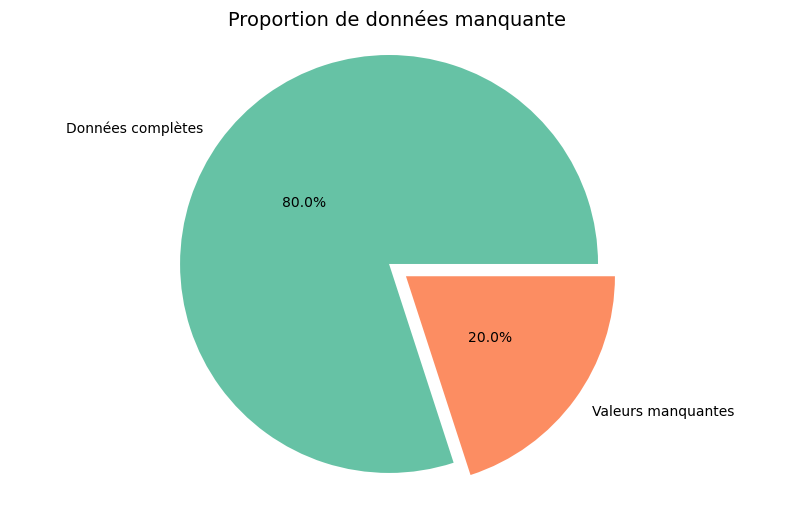

In [12]:
# proportion de donnee manquante
total_manquant = np.prod(data_edstatsfootnote.shape)
valeur_manquant = data_edstatsfootnote.isna().sum().sum()
labels = ["Données complètes", "Valeurs manquantes"]
vals = [total_manquant - valeur_manquant, valeur_manquant]
explose = (0, 0.1)
couleurs = ['#66c2a5', '#fc8d62'] 

# Création du graphique en secteurs
plt.figure(figsize=[10, 6]) 
plt.pie(x=vals, labels=labels, explode=explose, autopct="%.1f%%", pctdistance=0.5, colors=couleurs)  # Création du graphique en secteurs
plt.title("Proportion de données manquante", fontsize=14)  
plt.axis("equal") 
plt.show()  

#### Nombre dupliquer dans la donnée

In [13]:
data_edstatsfootnote.duplicated().sum()

0

### Bilan de EdStatsFootNote.csv

# importation fichier EDStatsCountry.csv à l'aide de l'outil Pandas 

In [98]:
data_edstatscountry = pd.read_csv('EDStatsCountry.csv')

## Etape-1: Menez une analyse generale des données

#### Afficher les 5 premier

In [99]:
data_edstatscountry.head()

,Country Code,Short Name,Table Name,Long Name,2-alpha code,Currency Unit,Special Notes,Region,Income Group,WB-2 code,National accounts base year,National accounts reference year,SNA price valuation,Lending category,Other groups,System of National Accounts,Alternative conversion factor,PPP survey year,Balance of Payments Manual in use,External debt Reporting status,System of trade,Government Accounting concept,IMF data dissemination standard,Latest population census,Latest household survey,Source of most recent Income and expenditure data,Vital registration complete,Latest agricultural census,Latest industrial data,Latest trade data,Latest water withdrawal data,Unnamed: 31
0,ABW,Aruba,Aruba,Aruba,AW,Aruban florin,SNA data for 2000-2011 are updated from offici...,Latin America & Caribbean,High income: nonOECD,AW,2000,NaN,Value added at basic prices (VAB),NaN,NaN,Country uses the 1993 System of National Accou...,NaN,NaN,"IMF Balance of Payments Manual, 6th edition.",NaN,Special trade system,NaN,NaN,2010,NaN,NaN,Yes,NaN,NaN,2012.0,NaN,NaN
1,AFG,Afghanistan,Afghanistan,Islamic State of Afghanistan,AF,Afghan afghani,Fiscal year end: March 20; reporting period fo...,South Asia,Low income,AF,2002/03,NaN,Value added at basic prices (VAB),IDA,HIPC,Country uses the 1993 System of National Accou...,NaN,NaN,NaN,Actual,General trade system,Consolidated central government,General Data Dissemination System (GDDS),1979,"Multiple Indicator Cluster Survey (MICS), 2010/11","Integrated household survey (IHS), 2008",NaN,2013/14,NaN,2012.0,2000,NaN
2,AGO,Angola,Angola,People's Republic of Angola,AO,Angolan kwanza,"April 2013 database update: Based on IMF data,...",Sub-Saharan Africa,Upper middle income,AO,2002,NaN,Value added at producer prices (VAP),IBRD,NaN,Country uses the 1993 System of National Accou...,1991–96,2005,"IMF Balance of Payments Manual, 6th edition.",Actual,Special trade system,Budgetary central government,General Data Dissemination System (GDDS),1970,"Malaria Indicator Survey (MIS), 2011","Integrated household survey (IHS), 2008",NaN,2015,NaN,NaN,2005,NaN
3,ALB,Albania,Albania,Republic of Albania,AL,Albanian lek,NaN,Europe & Central Asia,Upper middle income,AL,Original chained constant price data are resca...,1996.0,Value added at basic prices (VAB),IBRD,NaN,Country uses the 1993 System of National Accou...,NaN,Rolling,"IMF Balance of Payments Manual, 6th edition.",Actual,General trade system,Budgetary central government,General Data Dissemination System (GDDS),2011,"Demographic and Health Survey (DHS), 2008/09",Living Standards Measurement Study Survey (LSM...,Yes,2012,2010.0,2012.0,2006,NaN
4,AND,Andorra,Andorra,Principality of Andorra,AD,Euro,NaN,Europe & Central Asia,High income: nonOECD,AD,1990,NaN,NaN,NaN,NaN,Country uses the 1968 System of National Accou...,NaN,NaN,NaN,NaN,Special trade system,NaN,NaN,2011. Population figures compiled from adminis...,NaN,NaN,Yes,NaN,NaN,2006.0,NaN,NaN


####  Afficher les 5 dernier

In [100]:
data_edstatscountry.tail()

,Country Code,Short Name,Table Name,Long Name,2-alpha code,Currency Unit,Special Notes,Region,Income Group,WB-2 code,National accounts base year,National accounts reference year,SNA price valuation,Lending category,Other groups,System of National Accounts,Alternative conversion factor,PPP survey year,Balance of Payments Manual in use,External debt Reporting status,System of trade,Government Accounting concept,IMF data dissemination standard,Latest population census,Latest household survey,Source of most recent Income and expenditure data,Vital registration complete,Latest agricultural census,Latest industrial data,Latest trade data,Latest water withdrawal data,Unnamed: 31
236,XKX,Kosovo,Kosovo,Republic of Kosovo,NaN,Euro,"Kosovo became a World Bank member on June 29, ...",Europe & Central Asia,Lower middle income,KV,2008,NaN,Value added at basic prices (VAB),IDA,NaN,Country uses the 1993 System of National Accou...,NaN,NaN,NaN,Actual,NaN,NaN,General Data Dissemination System (GDDS),2011,NaN,"Integrated household survey (IHS), 2011",NaN,NaN,NaN,NaN,NaN,NaN
237,YEM,Yemen,"Yemen, Rep.",Republic of Yemen,YE,Yemeni rial,Based on official government statistics and In...,Middle East & North Africa,Lower middle income,RY,2007,NaN,Value added at producer prices (VAP),IDA,NaN,Country uses the 1993 System of National Accou...,1990–96,2005,"IMF Balance of Payments Manual, 6th edition.",Actual,Special trade system,Budgetary central government,General Data Dissemination System (GDDS),2004,"Demographic and Health Survey (DHS), 2013","Expenditure survey/budget survey (ES/BS), 2005",NaN,NaN,2006.0,2012.0,2005,NaN
238,ZAF,South Africa,South Africa,Republic of South Africa,ZA,South African rand,Fiscal year end: March 31; reporting period fo...,Sub-Saharan Africa,Upper middle income,ZA,2005,NaN,Value added at basic prices (VAB),IBRD,NaN,Country uses the 1993 System of National Accou...,NaN,2005,"IMF Balance of Payments Manual, 6th edition.",Preliminary,General trade system,Consolidated central government,Special Data Dissemination Standard (SDDS),2011,"Demographic and Health Survey (DHS), 2003; Wor...","Expenditure survey/budget survey (ES/BS), 2010",NaN,2007,2010.0,2012.0,2000,NaN
239,ZMB,Zambia,Zambia,Republic of Zambia,ZM,New Zambian kwacha,National accounts data have rebased to reflect...,Sub-Saharan Africa,Lower middle income,ZM,1994,NaN,Value added at basic prices (VAB),IDA,HIPC,Country uses the 1968 System of National Accou...,1990–92,2005,"IMF Balance of Payments Manual, 6th edition.",Actual,Special trade system,Budgetary central government,General Data Dissemination System (GDDS),2010,"Demographic and Health Survey (DHS), 2013","Integrated household survey (IHS), 2010",NaN,2010. Population and Housing Census.,NaN,2011.0,2002,NaN
240,ZWE,Zimbabwe,Zimbabwe,Republic of Zimbabwe,ZW,U.S. dollar,Fiscal year end: June 30; reporting period for...,Sub-Saharan Africa,Low income,ZW,2009,NaN,Value added at basic prices (VAB),Blend,NaN,Country uses the 1993 System of National Accou...,"1991, 1998",2005,"IMF Balance of Payments Manual, 6th edition.",Actual,General trade system,Consolidated central government,General Data Dissemination System (GDDS),2012,"Demographic and Health Survey (DHS), 2010/11","Integrated household survey (IHS), 2011/12",NaN,NaN,NaN,2012.0,2002,NaN


####  les données manquantes

In [101]:
data_edstatscountry.isnull().sum()

Country Code                                           0
Short Name                                             0
Table Name                                             0
Long Name                                              0
2-alpha code                                           3
Currency Unit                                         26
Special Notes                                         96
Region                                                27
Income Group                                          27
WB-2 code                                              1
National accounts base year                           36
National accounts reference year                     209
SNA price valuation                                   44
Lending category                                      97
Other groups                                         183
System of National Accounts                           26
Alternative conversion factor                        194
PPP survey year                

### Vusualisation des données manquantes de data_edstatscountry.csv

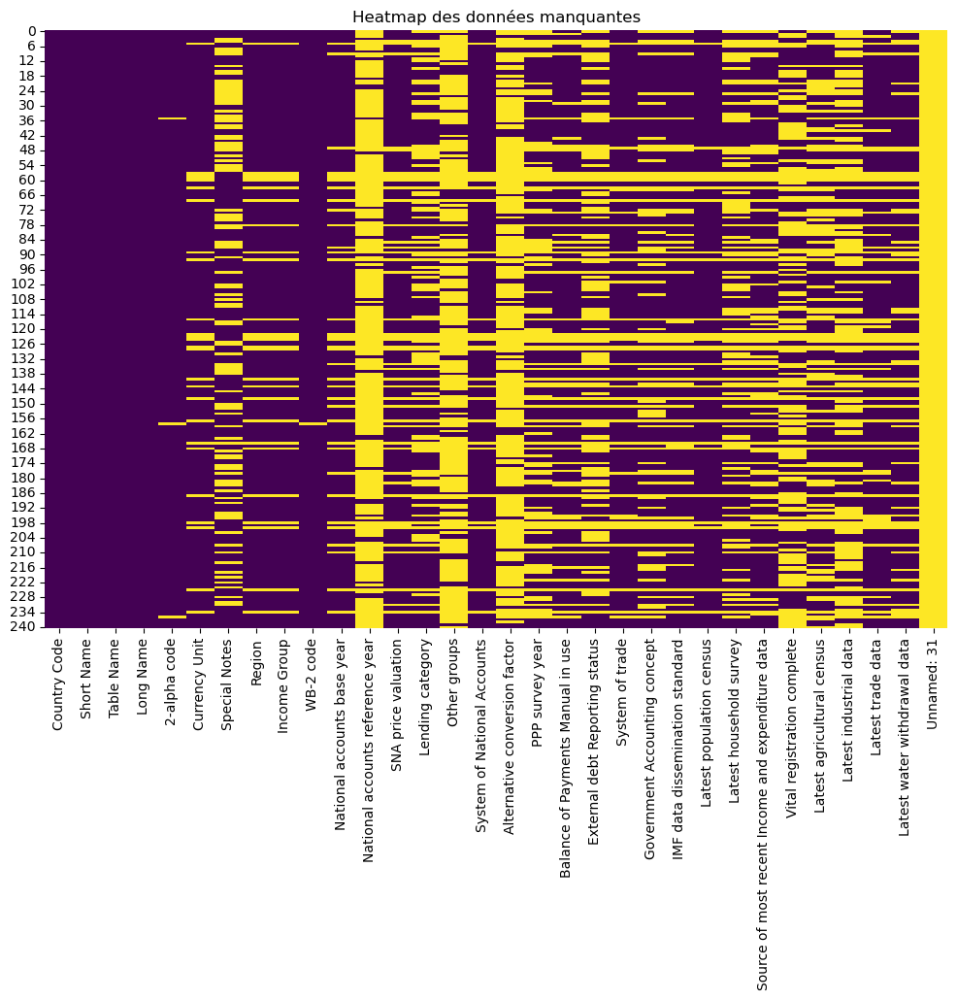

In [102]:
# Création de la heatmap
plt.figure(figsize=(12, 8))
sns.heatmap(data_edstatscountry.isna(), cbar=False, cmap='viridis')
plt.title('Heatmap des données manquantes')
plt.show()

### Proportion de données manquante

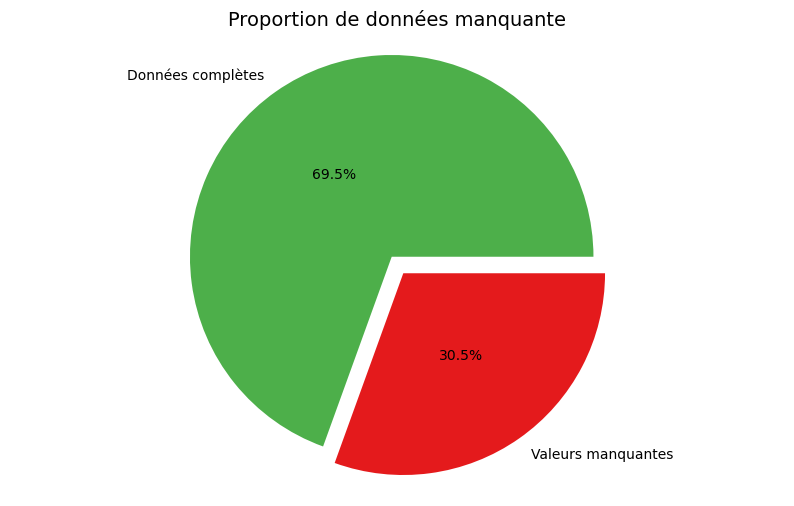

In [103]:
# Calcul des valeurs manquantes et complètes
total_manquant = np.prod(data_edstatscountry.shape)
valeur_manquant = data_edstatscountry.isna().sum().sum()
labels = ["Données complètes", "Valeurs manquantes"]
vals = [total_manquant - valeur_manquant, valeur_manquant]
explose = (0, 0.1)  

couleurs = ['#4daf4a', '#e41a1c']

# Création du graphique en secteurs
plt.figure(figsize=[10, 6])  
plt.pie(x=vals, labels=labels, explode=explose, autopct="%.1f%%", pctdistance=0.5, colors=couleurs)  # Création du graphique en secteurs
plt.title("Proportion de données manquante", fontsize=14)  
plt.axis("equal")  
plt.show()  

#### Nombre de donnée dupliquee

In [104]:
data_edstatscountry.duplicated().sum()

0

#### Nombre de colonne et ligne

In [105]:
data_edstatscountry.shape

(241, 32)

####  Les types de variable

In [106]:
data_edstatscountry.dtypes

Country Code                                          object
Short Name                                            object
Table Name                                            object
Long Name                                             object
2-alpha code                                          object
Currency Unit                                         object
Special Notes                                         object
Region                                                object
Income Group                                          object
WB-2 code                                             object
National accounts base year                           object
National accounts reference year                     float64
SNA price valuation                                   object
Lending category                                      object
Other groups                                          object
System of National Accounts                           object
Alternative conversion f

## Etape-2 Selectionner les données pertinentes

### Info sur chaque colonne

In [107]:
data_edstatscountry.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 241 entries, 0 to 240
Data columns (total 32 columns):
 #   Column                                             Non-Null Count  Dtype  
---  ------                                             --------------  -----  
 0   Country Code                                       241 non-null    object 
 1   Short Name                                         241 non-null    object 
 2   Table Name                                         241 non-null    object 
 3   Long Name                                          241 non-null    object 
 4   2-alpha code                                       238 non-null    object 
 5   Currency Unit                                      215 non-null    object 
 6   Special Notes                                      145 non-null    object 
 7   Region                                             214 non-null    object 
 8   Income Group                                       214 non-null    object 
 9   WB-2 code 

 #### les donnee pertinents choisi:

### Info sur pertinent Coutry Code

In [108]:
data_edstatscountry["Country Code"].value_counts()

Country Code
ABW    1
LCA    1
MRT    1
MUS    1
MWI    1
      ..
GRL    1
GTM    1
GUM    1
GUY    1
ZWE    1
Name: count, Length: 241, dtype: int64

#### Region

In [109]:
data_edstatscountry["Region"].value_counts()

Region
Europe & Central Asia         57
Sub-Saharan Africa            48
Latin America & Caribbean     41
East Asia & Pacific           36
Middle East & North Africa    21
South Asia                     8
North America                  3
Name: count, dtype: int64

####  Info sur pertinent Income Group

In [110]:
data_edstatscountry["Income Group"].value_counts()

Income Group
Upper middle income     55
Lower middle income     50
High income: nonOECD    44
Low income              34
High income: OECD       31
Name: count, dtype: int64

### Creation d'un dataframe a l'aide des pertinents colonnes 

In [111]:
indicator_edstatscountry = ['Upper middle income', 'Lower middle income', 'High income: nonOECD', 'Low income', 'High income: OECD']
# Filtrer le DataFrame pour inclure uniquement les lignes avec des sujets pertinents
filtre_edstatscountry = data_edstatscountry[data_edstatscountry['Income Group'].isin(indicator_edstatscountry )]
# Filtrer le DataFrame pour inclure uniquement les lignes avec des sujets pertinents
filtre_edstatscountry = data_edstatscountry[data_edstatscountry['Income Group'].isin(indicator_edstatscountry )]
# Sélectionner les colonnes 
pertinent_edstatscountry = filtre_edstatscountry[['Country Code', 'Income Group', 'Region']]
display(pertinent_edstatscountry)

,Country Code,Income Group,Region
0,ABW,High income: nonOECD,Latin America & Caribbean
1,AFG,Low income,South Asia
2,AGO,Upper middle income,Sub-Saharan Africa
3,ALB,Upper middle income,Europe & Central Asia
4,AND,High income: nonOECD,Europe & Central Asia
...,...,...,...
236,XKX,Lower middle income,Europe & Central Asia
237,YEM,Lower middle income,Middle East & North Africa
238,ZAF,Upper middle income,Sub-Saharan Africa
239,ZMB,Lower middle income,Sub-Saharan Africa


### Bilan de pertinent_edstatscountry.csv

### comparaison apres filtrage

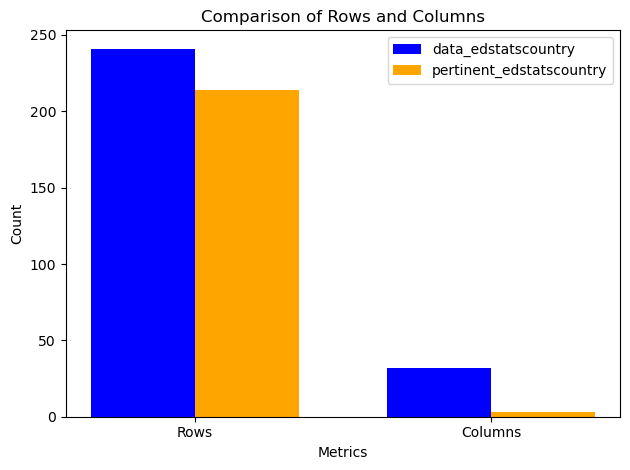

In [28]:

data_edstatscountry = pd.DataFrame({
    'Column1': range(241),
    'Column2': [i*2 for i in range(241)],
    'Column3': [i*3 for i in range(241)],
    # Ajouter plus de colonnes pour correspondre à 32 colonnes au total
    **{f'Column{i}': [j*(i+1) for j in range(241)] for i in range(4, 33)}
})

pertinent_edstatscountry = data_edstatscountry.iloc[:214, :3]

# Données pour les lignes et les colonnes
rows = [data_edstatscountry.shape[0], pertinent_edstatscountry.shape[0]]
columns = [data_edstatscountry.shape[1], pertinent_edstatscountry.shape[1]]

# Création du graphique
labels = ['Rows', 'Columns']
data1 = [data_edstatscountry.shape[0], data_edstatscountry.shape[1]]
data2 = [pertinent_edstatscountry.shape[0], pertinent_edstatscountry.shape[1]]

x = range(len(labels))  # Emplacement des étiquettes

fig, ax = plt.subplots()

# Largeur des barres
width = 0.35  

# Tracer les barres
ax.bar(x, data1, width, label='data_edstatscountry', color='blue')
ax.bar([p + width for p in x], data2, width, label='pertinent_edstatscountry', color='orange')

# Ajouter des labels, un titre et des étiquettes personnalisées pour les axes
ax.set_xlabel('Metrics')
ax.set_ylabel('Count')
ax.set_title('Comparison of Rows and Columns')
ax.set_xticks([p + width / 2 for p in x])
ax.set_xticklabels(labels)
ax.legend()

# Afficher le graphique
plt.tight_layout()
plt.show()

# importation de fichier EDStatsCountry-Series à l'aide de l'outil Pandas

In [29]:
data_EdStatsCountry_Series = pd.read_csv('EdStatsCountry-Series.csv')

## Etape-1: Menez une analyse generale des données

#### Afficher 5 premier 

In [30]:
data_EdStatsCountry_Series.head()

,CountryCode,SeriesCode,DESCRIPTION,Unnamed: 3
0,ABW,SP.POP.TOTL,Data sources : United Nations World Population...,NaN
1,ABW,SP.POP.GROW,Data sources: United Nations World Population ...,NaN
2,AFG,SP.POP.GROW,Data sources: United Nations World Population ...,NaN
3,AFG,NY.GDP.PCAP.PP.CD,Estimates are based on regression.,NaN
4,AFG,SP.POP.TOTL,Data sources : United Nations World Population...,NaN


####  Nombre de données manquantes

In [31]:
data_EdStatsCountry_Series.isnull().sum()

CountryCode      0
SeriesCode       0
DESCRIPTION      0
Unnamed: 3     613
dtype: int64

####  Afficher les 5 dernier

In [32]:
data_EdStatsCountry_Series.tail()

,CountryCode,SeriesCode,DESCRIPTION,Unnamed: 3
608,ZAF,SP.POP.GROW,"Data sources : Statistics South Africa, United...",NaN
609,ZMB,SP.POP.GROW,Data sources: United Nations World Population ...,NaN
610,ZMB,SP.POP.TOTL,Data sources : United Nations World Population...,NaN
611,ZWE,SP.POP.TOTL,Data sources : United Nations World Population...,NaN
612,ZWE,SP.POP.GROW,Data sources: United Nations World Population ...,NaN


#### Nombre de ligne et colonne

In [33]:
data_EdStatsCountry_Series.shape

(613, 4)

#### Nombre de ligne dupliquée 

In [34]:
data_EdStatsCountry_Series.duplicated().sum()

0

#### Les types de chaque variable

In [35]:
data_EdStatsCountry_Series.dtypes

CountryCode     object
SeriesCode      object
DESCRIPTION     object
Unnamed: 3     float64
dtype: object

### Proportion de données manquantes

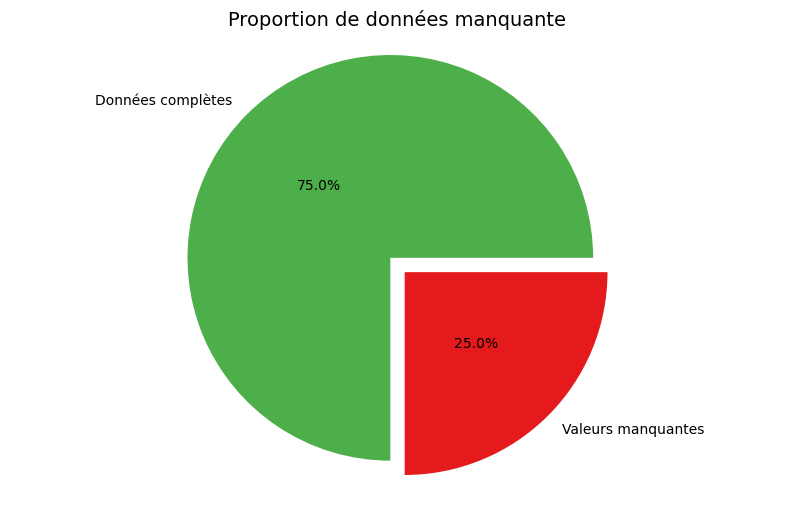

In [36]:

# Calcul des valeurs manquantes et complètes
total_manquant = np.prod(data_EdStatsCountry_Series.shape)
valeur_manquant = data_EdStatsCountry_Series.isna().sum().sum()
labels = ["Données complètes", "Valeurs manquantes"]
vals = [total_manquant - valeur_manquant, valeur_manquant]
explose = (0, 0.1)  

couleurs = ['#4daf4a', '#e41a1c']

# Création du graphique en secteurs
plt.figure(figsize=[10, 6]) 
plt.pie(x=vals, labels=labels, explode=explose, autopct="%.1f%%", pctdistance=0.5, colors=couleurs)  # Création du graphique en secteurs
plt.title("Proportion de données manquante", fontsize=14)  
plt.axis("equal") 
plt.show()  

### Bilan de data_EdStatsCountrySeries.csv

-Le jeu de donnée contient 613 ligne et 4 colonnes 
-Il contient un pourcentage manquant de 25%
-Il contient des variables telques Country code, Series Code et Description, qui fait que qu'on ne va va pas exploiter ce fichier car il ne presente pas des élements suffisants pour notre objectifs

.

# importation fichier EdStatsData.csv

In [37]:
data_EdStatsData = pd.read_csv('EdStatsData.csv')

## Etape-1: Menez une analyse generale des données

#### Afficher les 5 premier

In [38]:
data_EdStatsData.head()

,Country Name,Country Code,Indicator Name,Indicator Code,1970,1971,1972,1973,1974,1975,1976,1977,1978,1979,1980,1981,1982,1983,1984,1985,1986,1987,1988,1989,1990,1991,1992,1993,1994,1995,1996,1997,1998,1999,2000,2001,2002,2003,2004,2005,2006,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016,2017,2020,2025,2030,2035,2040,2045,2050,2055,2060,2065,2070,2075,2080,2085,2090,2095,2100,Unnamed: 69
0,Arab World,ARB,"Adjusted net enrolment rate, lower secondary, ...",UIS.NERA.2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,Arab World,ARB,"Adjusted net enrolment rate, lower secondary, ...",UIS.NERA.2.F,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,Arab World,ARB,"Adjusted net enrolment rate, lower secondary, ...",UIS.NERA.2.GPI,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,Arab World,ARB,"Adjusted net enrolment rate, lower secondary, ...",UIS.NERA.2.M,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,Arab World,ARB,"Adjusted net enrolment rate, primary, both sex...",SE.PRM.TENR,54.822121,54.894138,56.209438,57.267109,57.991138,59.36554,60.999962,61.92268,62.69342,64.383186,65.617767,66.085152,66.608139,67.290451,68.510094,69.033211,69.944908,71.04187,71.693779,71.699097,71.995819,72.602837,70.032722,70.464821,72.645683,71.81176,73.903511,74.425201,75.110817,76.254318,77.245682,78.800522,80.051399,80.805389,81.607063,82.489487,82.685509,83.280342,84.011871,84.195961,85.211998,85.24514,86.101669,85.51194,85.320152,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


#### Afficher les 5 dernier

In [39]:
data_EdStatsData.tail()

,Country Name,Country Code,Indicator Name,Indicator Code,1970,1971,1972,1973,1974,1975,1976,1977,1978,1979,1980,1981,1982,1983,1984,1985,1986,1987,1988,1989,1990,1991,1992,1993,1994,1995,1996,1997,1998,1999,2000,2001,2002,2003,2004,2005,2006,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016,2017,2020,2025,2030,2035,2040,2045,2050,2055,2060,2065,2070,2075,2080,2085,2090,2095,2100,Unnamed: 69
886925,Zimbabwe,ZWE,"Youth illiterate population, 15-24 years, male...",UIS.LP.AG15T24.M,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,47631.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,38800.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,166679.00000,NaN,NaN,199464.00000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
886926,Zimbabwe,ZWE,"Youth literacy rate, population 15-24 years, b...",SE.ADT.1524.LT.ZS,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,89.021851,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,95.411362,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,90.93070,NaN,NaN,90.42812,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
886927,Zimbabwe,ZWE,"Youth literacy rate, population 15-24 years, f...",SE.ADT.1524.LT.FE.ZS,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,84.812241,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,94.353439,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,92.12456,NaN,NaN,93.18835,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
886928,Zimbabwe,ZWE,"Youth literacy rate, population 15-24 years, g...",SE.ADT.1524.LT.FM.ZS,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.903920,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.977340,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.02828,NaN,NaN,1.06389,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
886929,Zimbabwe,ZWE,"Youth literacy rate, population 15-24 years, m...",SE.ADT.1524.LT.MA.ZS,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,93.826958,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,96.540619,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,89.59058,NaN,NaN,87.59186,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


#### Nombre de donnee manquante

In [40]:
data_EdStatsData.isnull().sum()

Country Name           0
Country Code           0
Indicator Name         0
Indicator Code         0
1970              814642
                   ...  
2085              835494
2090              835494
2095              835494
2100              835494
Unnamed: 69       886930
Length: 70, dtype: int64

### Proportion de données manquante de EdStatsData.csv

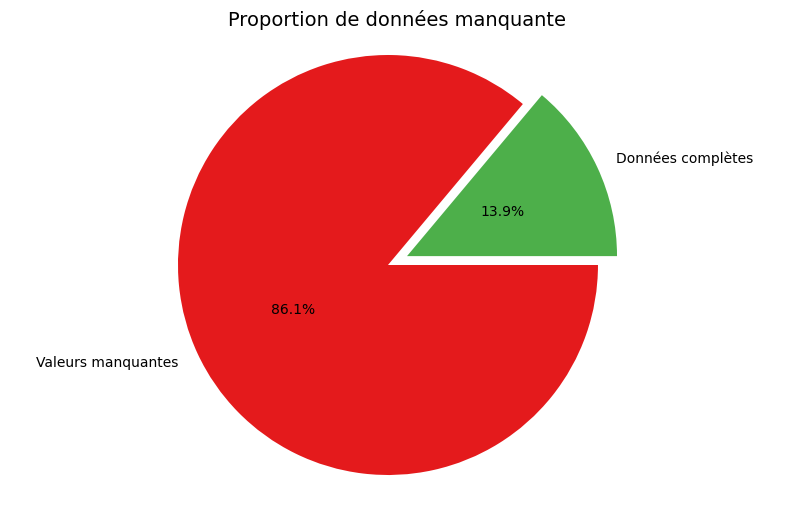

In [41]:

# Calcul des valeurs manquantes et complètes
total_manquant = np.prod(data_EdStatsData.shape)
valeur_manquant = data_EdStatsData.isna().sum().sum()
labels = ["Données complètes", "Valeurs manquantes"]
vals = [total_manquant - valeur_manquant, valeur_manquant]
explose = (0, 0.1)  

couleurs = ['#4daf4a', '#e41a1c']

# Création du graphique en secteurs
plt.figure(figsize=[10, 6])  
plt.pie(x=vals, labels=labels, explode=explose, autopct="%.1f%%", pctdistance=0.5, colors=couleurs)  
plt.title("Proportion de données manquante", fontsize=14)  
plt.axis("equal")  
plt.show()  

#### Les types de chaque variable

In [42]:
data_EdStatsData.dtypes

Country Name       object
Country Code       object
Indicator Name     object
Indicator Code     object
1970              float64
                   ...   
2085              float64
2090              float64
2095              float64
2100              float64
Unnamed: 69       float64
Length: 70, dtype: object

##### 1.4 nombre de ligne et colonne

In [43]:
data_EdStatsData.shape

(886930, 70)

#### les nombres de ligne dupliquer

In [44]:
data_EdStatsData.duplicated().sum()

0

## Etape-2 Selectionner les données pertinentes

###  Info sur les données pertinentes de data_EdStatsData

In [45]:
data_EdStatsData.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 886930 entries, 0 to 886929
Data columns (total 70 columns):
 #   Column          Non-Null Count   Dtype  
---  ------          --------------   -----  
 0   Country Name    886930 non-null  object 
 1   Country Code    886930 non-null  object 
 2   Indicator Name  886930 non-null  object 
 3   Indicator Code  886930 non-null  object 
 4   1970            72288 non-null   float64
 5   1971            35537 non-null   float64
 6   1972            35619 non-null   float64
 7   1973            35545 non-null   float64
 8   1974            35730 non-null   float64
 9   1975            87306 non-null   float64
 10  1976            37483 non-null   float64
 11  1977            37574 non-null   float64
 12  1978            37576 non-null   float64
 13  1979            36809 non-null   float64
 14  1980            89122 non-null   float64
 15  1981            38777 non-null   float64
 16  1982            37511 non-null   float64
 17  1983      

####  Info sur pertinent Countrie Name

In [46]:
data_EdStatsData["Country Name"].value_counts()

Country Name
Arab World               3665
Portugal                 3665
Micronesia, Fed. Sts.    3665
Moldova                  3665
Monaco                   3665
                         ... 
Equatorial Guinea        3665
Eritrea                  3665
Estonia                  3665
Ethiopia                 3665
Zimbabwe                 3665
Name: count, Length: 242, dtype: int64

#### Info sur pertinent Countrie Code

In [47]:
data_EdStatsData["Country Code"].value_counts()

Country Code
ARB    3665
PRT    3665
FSM    3665
MDA    3665
MCO    3665
       ... 
GNQ    3665
ERI    3665
EST    3665
ETH    3665
ZWE    3665
Name: count, Length: 242, dtype: int64

#### Info sur pertinent Indicator Name

In [48]:
data_EdStatsData["Indicator Name"].value_counts()

Indicator Name
Adjusted net enrolment rate, lower secondary, both sexes (%)                                       242
Population, ages 10-18, female                                                                     242
Population, ages 10-18, total                                                                      242
Population, ages 11-15, female                                                                     242
Population, ages 11-15, male                                                                       242
                                                                                                  ... 
Expenditure on education not allocated by level as % of government expenditure on education (%)    242
Expenditure on lower secondary as % of government expenditure on education (%)                     242
Expenditure on lower secondary as % of total government expenditure (%)                            242
Expenditure on post-secondary non-tertiary as % of governm

#### Info sur pertinent Indicator Code

In [49]:
data_EdStatsData["Indicator Code"].value_counts()

Indicator Code
UIS.NERA.2              242
SP.POP.1018.FE.UN       242
SP.POP.1018.TO.UN       242
SP.POP.1115.FE.UN       242
SP.POP.1115.MA.UN       242
                       ... 
UIS.XPUBP.UK            242
UIS.XPUBP.2             242
UIS.XGOVEXP.IMF.2       242
UIS.XPUBP.4             242
SE.ADT.1524.LT.MA.ZS    242
Name: count, Length: 3665, dtype: int64

####  Info sur pertinent 1970-2100

In [50]:
data_EdStatsData["1970"].value_counts()

1970
0.00000        1572
0.01000        1103
0.04000         762
0.02000         749
0.03000         707
               ... 
43695.00000       1
66370.00000       1
86005.00000       1
29.90667          1
0.53633           1
Name: count, Length: 24595, dtype: int64

### Creer un dataframe a l'aide des pertinent données

#### Suprimer les colonne et ligne contenant NaN

In [51]:
## supprimer les colonnes et les lignes qui ne contiennent que des valeurs NaN.
#data_EdStatsData = data_EdStatsData.dropna(axis="columns", how="all").dropna(axis="rows", how="all")

In [52]:
#data_EdStatsData

###  Acceder la liste d'Indicator Name

In [53]:
data_EdStatsData['Indicator Name'].values.tolist()

['Adjusted net enrolment rate, lower secondary, both sexes (%)',
 'Adjusted net enrolment rate, lower secondary, female (%)',
 'Adjusted net enrolment rate, lower secondary, gender parity index (GPI)',
 'Adjusted net enrolment rate, lower secondary, male (%)',
 'Adjusted net enrolment rate, primary, both sexes (%)',
 'Adjusted net enrolment rate, primary, female (%)',
 'Adjusted net enrolment rate, primary, gender parity index (GPI)',
 'Adjusted net enrolment rate, primary, male (%)',
 'Adjusted net enrolment rate, upper secondary, both sexes (%)',
 'Adjusted net enrolment rate, upper secondary, female (%)',
 'Adjusted net enrolment rate, upper secondary, gender parity index (GPI)',
 'Adjusted net enrolment rate, upper secondary, male (%)',
 'Adjusted net intake rate to Grade 1 of primary education, both sexes (%)',
 'Adjusted net intake rate to Grade 1 of primary education, female (%)',
 'Adjusted net intake rate to Grade 1 of primary education, gender parity index (GPI)',
 'Adjusted 

### Filtrer le dataframe en fonction de plus de 15 Indicateur

In [61]:
data_EdStatsData['Indicator Name'].values.tolist()

['Adjusted net enrolment rate, lower secondary, both sexes (%)',
 'Adjusted net enrolment rate, lower secondary, female (%)',
 'Adjusted net enrolment rate, lower secondary, gender parity index (GPI)',
 'Adjusted net enrolment rate, lower secondary, male (%)',
 'Adjusted net enrolment rate, primary, both sexes (%)',
 'Adjusted net enrolment rate, primary, female (%)',
 'Adjusted net enrolment rate, primary, gender parity index (GPI)',
 'Adjusted net enrolment rate, primary, male (%)',
 'Adjusted net enrolment rate, upper secondary, both sexes (%)',
 'Adjusted net enrolment rate, upper secondary, female (%)',
 'Adjusted net enrolment rate, upper secondary, gender parity index (GPI)',
 'Adjusted net enrolment rate, upper secondary, male (%)',
 'Adjusted net intake rate to Grade 1 of primary education, both sexes (%)',
 'Adjusted net intake rate to Grade 1 of primary education, female (%)',
 'Adjusted net intake rate to Grade 1 of primary education, gender parity index (GPI)',
 'Adjusted 

###  Afficher la liste indicateur de projection

In [62]:
filtre_ligne = data_EdStatsData["Indicator Name"].str.contains("Wittgenstein")
data_EdStatsData.loc[filtre_ligne, "Indicator Name"].unique()

array(['Wittgenstein Projection: Mean years of schooling. Age 0-19. Female',
       'Wittgenstein Projection: Mean years of schooling. Age 0-19. Male',
       'Wittgenstein Projection: Mean years of schooling. Age 0-19. Total',
       'Wittgenstein Projection: Mean years of schooling. Age 15+. Female',
       'Wittgenstein Projection: Mean Years of Schooling. Age 15+. Gender Gap',
       'Wittgenstein Projection: Mean years of schooling. Age 15+. Male',
       'Wittgenstein Projection: Mean years of schooling. Age 15+. Total',
       'Wittgenstein Projection: Mean years of schooling. Age 15-19. Female',
       'Wittgenstein Projection: Mean years of schooling. Age 15-19. Male',
       'Wittgenstein Projection: Mean years of schooling. Age 15-19. Total',
       'Wittgenstein Projection: Mean years of schooling. Age 20-24. Female',
       'Wittgenstein Projection: Mean years of schooling. Age 20-24. Male',
       'Wittgenstein Projection: Mean years of schooling. Age 20-24. Total',
     

In [63]:
#indicator_names = filtre['Indicator Name'].unique().tolist()
#for i in range(0, len(indicator_names), 30):
#    print(indicator_names[i:i+30])

####  choix des indicateur lié au projet (18)

In [64]:
#liste de 18 indicator
indicator_sup_15 = [
     'Population, ages 15-24, total', 'Population growth (annual %)',
     'GDP per capita, PPP (current international $)',
     'Internet users (per 100 people)',
     'Population, total',
     'Annual statutory teacher salaries in public institutions in USD. Lower Secondary. 10 years of experience',
     'Adjusted net enrolment rate, lower secondary, both sexes (%)',
     'Government expenditure on education as % of GDP (%)',
     'Expenditure on tertiary as % of total government expenditure (%)',
     'Government expenditure per post-secondary non-tertiary student as % of GDP per capita (%)',
     'GDP per capita, PPP (current international $)'
     'Adult illiterate population, 15+ years, both sexes (number)',
     'Adult literacy rate, population 15+ years, both sexes (%)',
     'Adult literacy rate, population 15+ years, gender parity index (GPI)',
     'Barro-Lee: Percentage of population age 15+ with no education',
     'Capital expenditure as % of total expenditure in lower secondary public institutions (%)',
     'Capital expenditure as % of total expenditure in tertiary public institutions (%)',
     'Capital expenditure as % of total expenditure in upper-secondary public institutions (%)',
     'Youth illiterate population, 15-24 years, both sexes (number)',
     'Youth literacy rate, population 15-24 years, both sexes (%)',
     'Population of the official entrance age to secondary general education, male (number)',
     'Population of the official age for tertiary education, both sexes (number)',
     'Wittgenstein Projection: Mean years of schooling. Age 20-24. Total',
     'Wittgenstein Projection: Percentage of the population age 25-29 by highest level of educational attainment. Post Secondary. Total',
     'Wittgenstein Projection: Population age 25-29 in thousands by highest level of educational attainment. Post Secondary. Total',
     'GDP per capita (current US$)',]


# Filtrer le DataFrame pour ne conserver que les lignes avec les Indicator Name choisis
filttre_indicator = data_EdStatsData[data_EdStatsData ['Indicator Name'].isin(indicator_sup_15)]

# Afficher le DataFrame filtré
display(filttre_indicator)

,Country Name,Country Code,Indicator Name,Indicator Code,1970,1971,1972,1973,1974,1975,1976,1977,1978,1979,1980,1981,1982,1983,1984,1985,1986,1987,1988,1989,1990,1991,1992,1993,1994,1995,1996,1997,1998,1999,2000,2001,2002,2003,2004,2005,2006,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016,2017,2020,2025,2030,2035,2040,2045,2050,2055,2060,2065,2070,2075,2080,2085,2090,2095,2100,Unnamed: 69
0,Arab World,ARB,"Adjusted net enrolment rate, lower secondary, ...",UIS.NERA.2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
20,Arab World,ARB,"Adult literacy rate, population 15+ years, bot...",SE.ADT.LITR.ZS,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,54.593472,54.593472,54.593472,54.593472,54.593472,54.593472,54.593472,54.593472,54.593472,54.593472,66.006065,66.006065,66.006065,66.006065,66.006065,66.006065,66.006065,66.006065,66.006065,66.006065,77.364586,77.364586,77.364586,77.364586,77.364586,77.364586,77.364586,77.364586,77.364586,77.364586,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
22,Arab World,ARB,"Adult literacy rate, population 15+ years, gen...",UIS.LR.AG15T99.GPI,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.610000,0.610000,0.610000,0.610000,0.610000,0.610000,0.610000,0.610000,0.610000,0.610000,0.720000,0.720000,0.720000,0.720000,0.720000,0.720000,0.720000,0.720000,0.720000,0.720000,0.820000,0.820000,0.820000,0.820000,0.820000,0.820000,0.820000,0.820000,0.820000,0.820000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
133,Arab World,ARB,Annual statutory teacher salaries in public in...,OECD.TSAL.2.E10,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
374,Arab World,ARB,Barro-Lee: Percentage of population age 15+ wi...,BAR.NOED.15UP.ZS,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
886626,Zimbabwe,ZWE,Wittgenstein Projection: Mean years of schooli...,PRJ.MYS.2024.MF,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,11.300000,NaN,NaN,NaN,NaN,11.70,NaN,NaN,12.00,12.20,12.30,12.50,12.60,12.70,12.70,12.80,12.80,12.90,12.90,13.00,13.00,13.10,13.20,13.20,13.30,NaN
886771,Zimbabwe,ZWE,Wittgenstein Projection: Percentage of the pop...,PRJ.ATT.2529.4.MF,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.060000,NaN,NaN,NaN,NaN,0.07,NaN,NaN,0.08,0.09,0.10,0.11,0.12,0.14,0.15,0.17,0.18,0.20,0.22,0.23,0.25,0.27,0.29,0.31,0.33,NaN
886897,Zimbabwe,ZWE,Wittgenstein Projection: Population age 25-29 ...,PRJ.POP.2529.4.MF,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,76.710000,NaN,NaN,NaN,NaN,90.03,NaN,NaN,99.70,107.30,117.68,134.22,144.02,152.44,158.23,162.40,169.05,177.46,185.54,191.79,195.98,203.30,209.91,219.22,222.40,NaN
886923,Zimbabwe,ZWE,"Youth illiterate population, 15-24 years, both...

### Affcher mes indicateurs choisi

In [65]:
#afficher les indicateur de filttre_indicator
filttre_indicator["Indicator Name"].value_counts()

Indicator Name
Adjusted net enrolment rate, lower secondary, both sexes (%)                                                                         242
Adult literacy rate, population 15+ years, both sexes (%)                                                                            242
Youth illiterate population, 15-24 years, both sexes (number)                                                                        242
Wittgenstein Projection: Population age 25-29 in thousands by highest level of educational attainment. Post Secondary. Total         242
Wittgenstein Projection: Percentage of the population age 25-29 by highest level of educational attainment. Post Secondary. Total    242
Wittgenstein Projection: Mean years of schooling. Age 20-24. Total                                                                   242
Population, total                                                                                                                    242
Population, ages 15-24, to

####  Suprime les colonne et ligne affecter par Nan

In [67]:
#filttre_indicator = filttre_indicator.dropna(axis="columns", how="all").dropna(axis="rows", how="all")
#filttre_indicator

#### Filtrer en fonction des pays

In [68]:
filttre_indicator['Country Name'].unique()

array(['Arab World', 'East Asia & Pacific',
       'East Asia & Pacific (excluding high income)', 'Euro area',
       'Europe & Central Asia',
       'Europe & Central Asia (excluding high income)', 'European Union',
       'Heavily indebted poor countries (HIPC)', 'High income',
       'Latin America & Caribbean',
       'Latin America & Caribbean (excluding high income)',
       'Least developed countries: UN classification',
       'Low & middle income', 'Low income', 'Lower middle income',
       'Middle East & North Africa',
       'Middle East & North Africa (excluding high income)',
       'Middle income', 'North America', 'OECD members', 'South Asia',
       'Sub-Saharan Africa', 'Sub-Saharan Africa (excluding high income)',
       'Upper middle income', 'World', 'Afghanistan', 'Albania',
       'Algeria', 'American Samoa', 'Andorra', 'Angola',
       'Antigua and Barbuda', 'Argentina', 'Armenia', 'Aruba',
       'Australia', 'Austria', 'Azerbaijan', 'Bahamas, The', 'Bahrain',


In [69]:
#Creer un array de numpy de la liste de tout les pays de mon dataframe filtre année
liste = np.array(filttre_indicator['Country Name'].unique())

# Liste des zones et territoires à exclure
pays_non_valide = ['Arab World', 'East Asia & Pacific',
       'East Asia & Pacific (excluding high income)', 'Euro area',
       'Europe & Central Asia',
       'Europe & Central Asia (excluding high income)', 'European Union',
       'Heavily indebted poor countries (HIPC)', 'High income',
       'Latin America & Caribbean',
       'Latin America & Caribbean (excluding high income)',
       'Least developed countries: UN classification',
       'Low & middle income', 'Low income', 'Lower middle income',
       'Middle East & North Africa',
       'Middle East & North Africa (excluding high income)',
       'Middle income', 'North America', 'OECD members', 'South Asia',
       'Sub-Saharan Africa', 'Sub-Saharan Africa (excluding high income)',
       'Upper middle income', 'World', 'American Samoa', 'Aruba', 'Bermuda', 'British Virgin Islands', 'Cayman Islands', 'Channel Islands', 'Curacao', 'Faroe Islands', 'French Polynesia', 'Gibraltar', 'Greenland', 'Guam', 'Hong Kong SAR, China', 'Isle of Man', 'Macao SAR, China', 'New Caledonia', 'Northern Mariana Islands', 'Puerto Rico', 'Sint Maarten (Dutch part)', 'Turks and Caicos Islands', 'Virgin Islands (U.S.)', 'West Bank and Gaza']

# Filtrage des pays souverains
pays_souverain = [liste for liste in liste if liste not in pays_non_valide]

display(pays_souverain)

['Afghanistan',
 'Albania',
 'Algeria',
 'Andorra',
 'Angola',
 'Antigua and Barbuda',
 'Argentina',
 'Armenia',
 'Australia',
 'Austria',
 'Azerbaijan',
 'Bahamas, The',
 'Bahrain',
 'Bangladesh',
 'Barbados',
 'Belarus',
 'Belgium',
 'Belize',
 'Benin',
 'Bhutan',
 'Bolivia',
 'Bosnia and Herzegovina',
 'Botswana',
 'Brazil',
 'Brunei Darussalam',
 'Bulgaria',
 'Burkina Faso',
 'Burundi',
 'Cabo Verde',
 'Cambodia',
 'Cameroon',
 'Canada',
 'Central African Republic',
 'Chad',
 'Chile',
 'China',
 'Colombia',
 'Comoros',
 'Congo, Dem. Rep.',
 'Congo, Rep.',
 'Costa Rica',
 "Cote d'Ivoire",
 'Croatia',
 'Cuba',
 'Cyprus',
 'Czech Republic',
 'Denmark',
 'Djibouti',
 'Dominica',
 'Dominican Republic',
 'Ecuador',
 'Egypt, Arab Rep.',
 'El Salvador',
 'Equatorial Guinea',
 'Eritrea',
 'Estonia',
 'Ethiopia',
 'Fiji',
 'Finland',
 'France',
 'Gabon',
 'Gambia, The',
 'Georgia',
 'Germany',
 'Ghana',
 'Greece',
 'Grenada',
 'Guatemala',
 'Guinea',
 'Guinea-Bissau',
 'Guyana',
 'Haiti',
 '

In [70]:
pertinent_EdStatsData = filttre_indicator[filttre_indicator['Country Name'].isin(pays_souverain)]

# Afficher le DataFrame filtré
display(pertinent_EdStatsData)

,Country Name,Country Code,Indicator Name,Indicator Code,1970,1971,1972,1973,1974,1975,1976,1977,1978,1979,1980,1981,1982,1983,1984,1985,1986,1987,1988,1989,1990,1991,1992,1993,1994,1995,1996,1997,1998,1999,2000,2001,2002,2003,2004,2005,2006,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016,2017,2020,2025,2030,2035,2040,2045,2050,2055,2060,2065,2070,2075,2080,2085,2090,2095,2100,Unnamed: 69
91625,Afghanistan,AFG,"Adjusted net enrolment rate, lower secondary, ...",UIS.NERA.2,NaN,NaN,NaN,NaN,7.05911,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,17.260189,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,28.05987,NaN,NaN,NaN,NaN,NaN,47.43679,50.627232,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
91645,Afghanistan,AFG,"Adult literacy rate, population 15+ years, bot...",SE.ADT.LITR.ZS,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,18.157681,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,31.74112,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
91647,Afghanistan,AFG,"Adult literacy rate, population 15+ years, gen...",UIS.LR.AG15T99.GPI,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.164560,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.38778,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
91758,Afghanistan,AFG,Annual statutory teacher salaries in public in...,OECD.TSAL.2.E10,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
91999,Afghanistan,AFG,Barro-Lee: Percentage of population age 15+ wi...,BAR.NOED.15UP.ZS,88.81,NaN,NaN,NaN,NaN,85.74,NaN,NaN,NaN,NaN,82.03,NaN,NaN,NaN,NaN,77.8,NaN,NaN,NaN,NaN,75.04,NaN,NaN,NaN,NaN,73.21,NaN,NaN,NaN,NaN,67.85,NaN,NaN,NaN,NaN,65.73,NaN,NaN,NaN,NaN,58.38,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
886626,Zimbabwe,ZWE,Wittgenstein Projection: Mean years of schooli...,PRJ.MYS.2024.MF,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,11.30,NaN,NaN,NaN,NaN,11.70,NaN,NaN,12.00,12.20,12.30,12.50,12.60,12.70,12.70,12.80,12.80,12.90,12.90,13.00,13.00,13.10,13.20,13.20,13.30,NaN
886771,Zimbabwe,ZWE,Wittgenstein Projection: Percentage of the pop...,PRJ.ATT.2529.4.MF,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.06,NaN,NaN,NaN,NaN,0.07,NaN,NaN,0.08,0.09,0.10,0.11,0.12,0.14,0.15,0.17,0.18,0.20,0.22,0.23,0.25,0.27,0.29,0.31,0.33,NaN
886897,Zimbabwe,ZWE,Wittgenstein Projection: Population age 25-29 ...,PRJ.POP.2529.4.MF,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,76.71,NaN,NaN,NaN,NaN,90.03,NaN,NaN,99.70,107.30,117.68,134.22,144.02,152.44,158.23,162.40,169.05,177.46,185.54,191.79,195.98,203.30,209.91,219.22,222.40,NaN
886923,Zimbabwe,ZWE,"Youth illiterate population, 15-24 years, both...",UIS.LP.AG15T24,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,164719.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,102022.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,295605.00000,NaN,NaN,311114.000000,NaN,NaN,NaN,NaN,NaN,NaN,

### Proportion de données manquante apres filtre

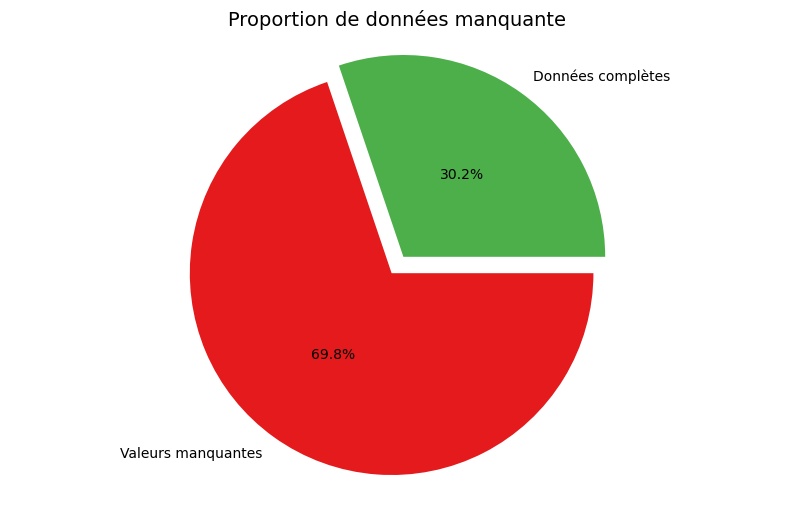

In [71]:
# Ignorer les avertissements liés à la division par zéro
warnings.filterwarnings("ignore", message="invalid value encountered in divide")

total_manquant = np.prod(pertinent_EdStatsData.shape)
valeur_manquant = pertinent_EdStatsData.isna().sum().sum()
labels = ["Données complètes", "Valeurs manquantes"]
vals = [total_manquant - valeur_manquant, valeur_manquant]
explose = (0, 0.1)  

couleurs = ['#4daf4a', '#e41a1c']

# Création du graphique en secteurs
plt.figure(figsize=[10, 6])  
plt.pie(x=vals, labels=labels, explode=explose, autopct="%.1f%%", pctdistance=0.5, colors=couleurs)  
plt.title("Proportion de données manquante", fontsize=14) 
plt.axis("equal") 
plt.show()  

### Pivoter le dataframe issus en filtre pays

In [73]:
# Faire fondre les colonnes années en une seule colonne
df_melt = pertinent_EdStatsData.melt(id_vars=["Country Name", "Country Code", "Indicator Name", "Indicator Code"], 
                    var_name="Year", 
                    value_name="Value")

# Pivoter les données
pertinent_EdStatsData_pivoter = df_melt.pivot_table(index=["Country Code", "Indicator Code", "Country Name", "Year"], 
                                   columns="Indicator Name", 
                                   values="Value", 
                                   aggfunc="first").reset_index()

# Afficher les premières lignes du tableau pivoté
display(pertinent_EdStatsData_pivoter)

Indicator Name,Country Code,Indicator Code,Country Name,Year,"Adjusted net enrolment rate, lower secondary, both sexes (%)","Adult literacy rate, population 15+ years, both sexes (%)","Adult literacy rate, population 15+ years, gender parity index (GPI)",Annual statutory teacher salaries in public institutions in USD. Lower Secondary. 10 years of experience,Barro-Lee: Percentage of population age 15+ with no education,Capital expenditure as % of total expenditure in lower secondary public institutions (%),Capital expenditure as % of total expenditure in tertiary public institutions (%),Capital expenditure as % of total expenditure in upper-secondary public institutions (%),Expenditure on tertiary as % of total government expenditure (%),GDP per capita (current US$),"GDP per capita, PPP (current international $)",Government expenditure on education as % of GDP (%),Government expenditure per post-secondary non-tertiary student as % of GDP per capita (%),Internet users (per 100 people),Population growth (annual %),"Population of the official age for tertiary education, both sexes (number)","Population of the official entrance age to secondary general education, male (number)","Population, ages 15-24, total","Population, total",Wittgenstein Projection: Mean years of schooling. Age 20-24. Total,Wittgenstein Projection: Percentage of the population age 25-29 by highest level of educational attainment. Post Secondary. Total,Wittgenstein Projection: Population age 25-29 in thousands by highest level of educational attainment. Post Secondary. Total,"Youth illiterate population, 15-24 years, both sexes (number)","Youth literacy rate, population 15-24 years, both sexes (%)"
0,AFG,BAR.NOED.15UP.ZS,Afghanistan,1970,NaN,NaN,NaN,NaN,88.81,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,AFG,BAR.NOED.15UP.ZS,Afghanistan,1975,NaN,NaN,NaN,NaN,85.74,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,AFG,BAR.NOED.15UP.ZS,Afghanistan,1980,NaN,NaN,NaN,NaN,82.03,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,AFG,BAR.NOED.15UP.ZS,Afghanistan,1985,NaN,NaN,NaN,NaN,77.80,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,AFG,BAR.NOED.15UP.ZS,Afghanistan,1990,NaN,NaN,NaN,NaN,75.04,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
80141,ZWE,UIS.SAP.23.GPV.G1.M,Zimbabwe,1988,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,125515.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
80142,ZWE,UIS.SAP.23.GPV.G1.M,Zimbabwe,1989,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,130472.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
80143,ZWE,UIS.XGOVEXP.IMF.56,Zimbabwe,2010,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.98968,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
80144,ZWE,UIS.XGOVEXP.IMF.56,Zimbabwe,2009,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.90494,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


### Quantité de donnée par ans

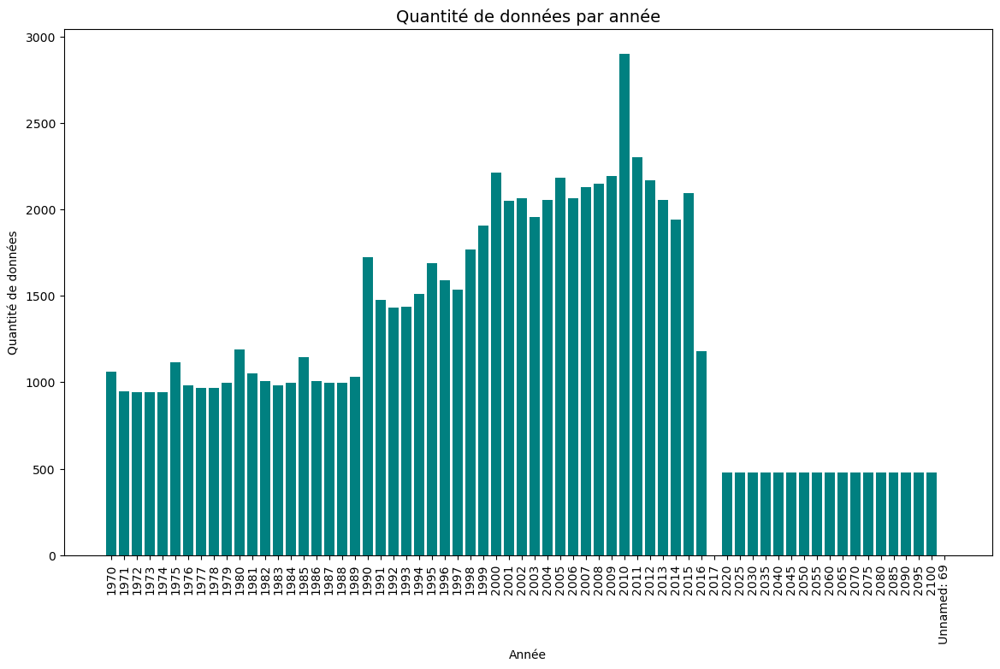

In [74]:
# Calcul du nombre de données non manquantes par année
data_counts = pertinent_EdStatsData.iloc[:, 4:].count()

# Création du graphique
plt.figure(figsize=(14, 8))
plt.bar(data_counts.index, data_counts.values, color='teal')
plt.title("Quantité de données par année", fontsize=14)
plt.xlabel("Année")
plt.ylabel("Quantité de données")
plt.xticks(rotation=90)
plt.show()

### Bilan de EdStatsData.csv

# importation fichierEdStatsSeries.csv

In [75]:
data_EdStatsSeries = pd.read_csv('EdStatsSeries.csv')

## Etape-1: Menez une analyse generale des données

#### Afficher les 5 premier

In [76]:
data_EdStatsSeries.head()

,Series Code,Topic,Indicator Name,Short definition,Long definition,Unit of measure,Periodicity,Base Period,Other notes,Aggregation method,Limitations and exceptions,Notes from original source,General comments,Source,Statistical concept and methodology,Development relevance,Related source links,Other web links,Related indicators,License Type,Unnamed: 20
0,BAR.NOED.1519.FE.ZS,Attainment,Barro-Lee: Percentage of female population age...,Percentage of female population age 15-19 with...,Percentage of female population age 15-19 with...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Robert J. Barro and Jong-Wha Lee: http://www.b...,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,BAR.NOED.1519.ZS,Attainment,Barro-Lee: Percentage of population age 15-19 ...,Percentage of population age 15-19 with no edu...,Percentage of population age 15-19 with no edu...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Robert J. Barro and Jong-Wha Lee: http://www.b...,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,BAR.NOED.15UP.FE.ZS,Attainment,Barro-Lee: Percentage of female population age...,Percentage of female population age 15+ with n...,Percentage of female population age 15+ with n...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Robert J. Barro and Jong-Wha Lee: http://www.b...,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,BAR.NOED.15UP.ZS,Attainment,Barro-Lee: Percentage of population age 15+ wi...,Percentage of population age 15+ with no educa...,Percentage of population age 15+ with no educa...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Robert J. Barro and Jong-Wha Lee: http://www.b...,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,BAR.NOED.2024.FE.ZS,Attainment,Barro-Lee: Percentage of female population age...,Percentage of female population age 20-24 with...,Percentage of female population age 20-24 with...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Robert J. Barro and Jong-Wha Lee: http://www.b...,NaN,NaN,NaN,NaN,NaN,NaN,NaN


#### 1.2 Afficher 5 dernier

In [77]:
data_EdStatsSeries.tail()

,Series Code,Topic,Indicator Name,Short definition,Long definition,Unit of measure,Periodicity,Base Period,Other notes,Aggregation method,Limitations and exceptions,Notes from original source,General comments,Source,Statistical concept and methodology,Development relevance,Related source links,Other web links,Related indicators,License Type,Unnamed: 20
3660,UIS.XUNIT.USCONST.3.FSGOV,Expenditures,Government expenditure per upper secondary stu...,NaN,"Average total (current, capital and transfers)...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,UNESCO Institute for Statistics,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3661,UIS.XUNIT.USCONST.4.FSGOV,Expenditures,Government expenditure per post-secondary non-...,NaN,"Average total (current, capital and transfers)...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,UNESCO Institute for Statistics,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3662,UIS.XUNIT.USCONST.56.FSGOV,Expenditures,Government expenditure per tertiary student (c...,NaN,"Average total (current, capital and transfers)...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,UNESCO Institute for Statistics,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3663,XGDP.23.FSGOV.FDINSTADM.FFD,Expenditures,Government expenditure in secondary institutio...,"Total general (local, regional and central) go...","Total general (local, regional and central) go...",NaN,NaN,NaN,Secondary,NaN,NaN,NaN,NaN,UNESCO Institute for Statistics,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3664,XGDP.56.FSGOV.FDINSTADM.FFD,Expenditures,Government expenditure in tertiary institution...,"Total general (local, regional and central) go...","Total general (local, regional and central) go...",NaN,NaN,NaN,Tertiary,NaN,NaN,NaN,NaN,UNESCO Institute for Statistics,NaN,NaN,NaN,NaN,NaN,NaN,NaN


#### Nombre de donnée manquante

In [78]:
data_EdStatsSeries.isnull().sum()

Series Code                               0
Topic                                     0
Indicator Name                            0
Short definition                       1509
Long definition                           0
Unit of measure                        3665
Periodicity                            3566
Base Period                            3351
Other notes                            3113
Aggregation method                     3618
Limitations and exceptions             3651
Notes from original source             3665
General comments                       3651
Source                                    0
Statistical concept and methodology    3642
Development relevance                  3662
Related source links                   3450
Other web links                        3665
Related indicators                     3665
License Type                           3665
Unnamed: 20                            3665
dtype: int64

### Proportion de donnée manquante de EdStatsSeries.csv

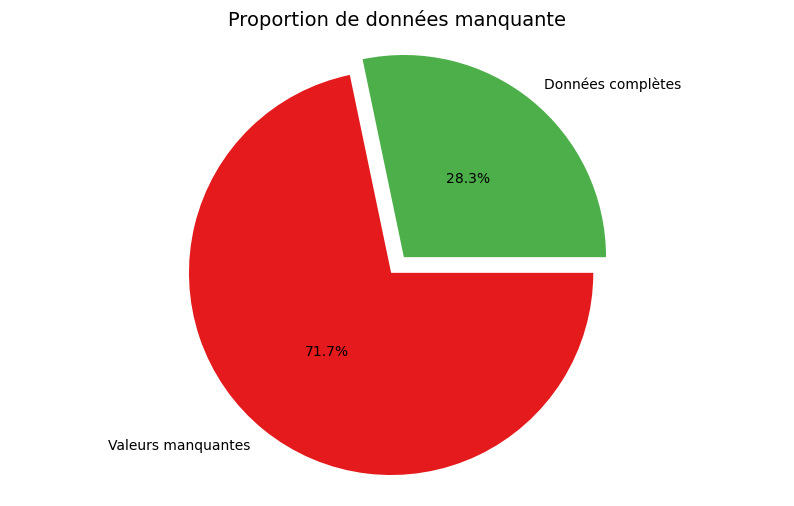

In [79]:

total_manquant = np.prod(data_EdStatsSeries.shape)
valeur_manquant = data_EdStatsSeries.isna().sum().sum()
labels = ["Données complètes", "Valeurs manquantes"]
vals = [total_manquant - valeur_manquant, valeur_manquant]
explose = (0, 0.1)  

couleurs = ['#4daf4a', '#e41a1c']

# Création du graphique en secteurs
plt.figure(figsize=[10, 6])  
plt.pie(x=vals, labels=labels, explode=explose, autopct="%.1f%%", pctdistance=0.5, colors=couleurs) 
plt.title("Proportion de données manquante", fontsize=14)
plt.axis("equal")  
plt.show()  

### Visualisation des données manquante de EdStatsSeries.csv

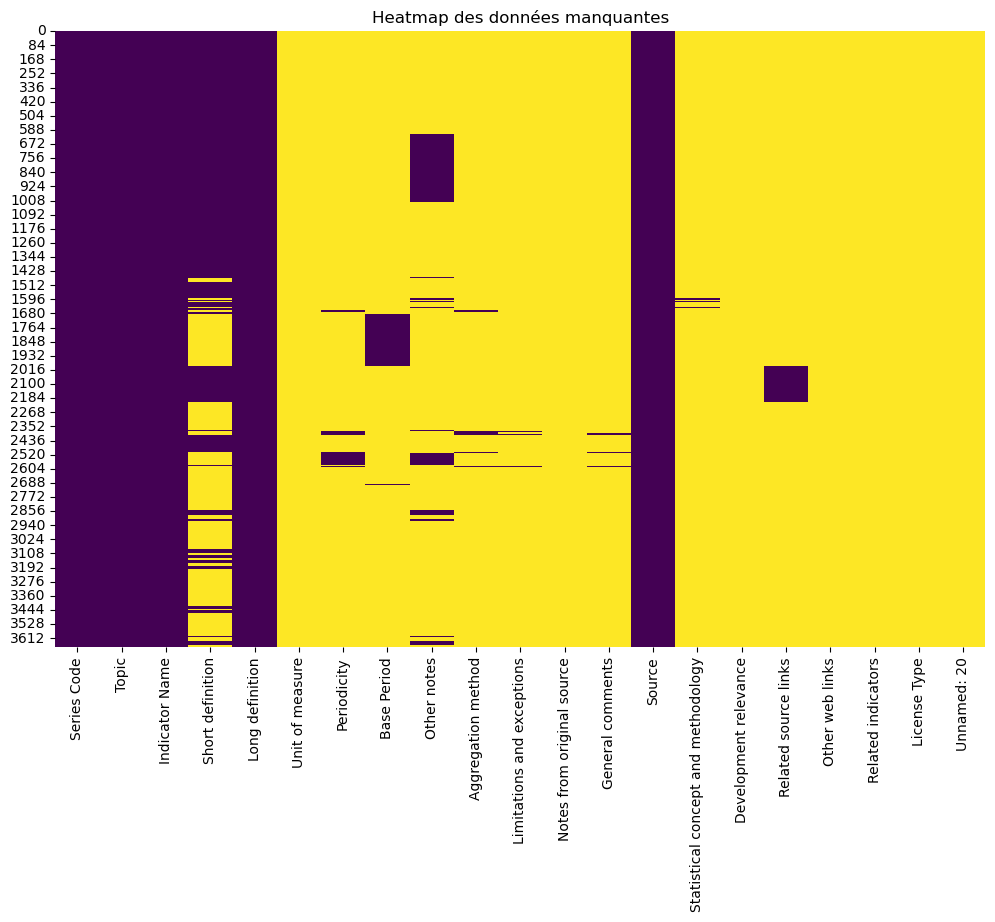

In [80]:
# Création de la heatmap
plt.figure(figsize=(12, 8))
sns.heatmap(data_EdStatsSeries.isna(), cbar=False, cmap='viridis')
plt.title('Heatmap des données manquantes')
plt.show()

####  Les types de variable 

In [81]:
data_EdStatsSeries.dtypes

Series Code                             object
Topic                                   object
Indicator Name                          object
Short definition                        object
Long definition                         object
Unit of measure                        float64
Periodicity                             object
Base Period                             object
Other notes                             object
Aggregation method                      object
Limitations and exceptions              object
Notes from original source             float64
General comments                        object
Source                                  object
Statistical concept and methodology     object
Development relevance                   object
Related source links                    object
Other web links                        float64
Related indicators                     float64
License Type                           float64
Unnamed: 20                            float64
dtype: object

#### 1.5 Le nombre de colonne et ligne

In [82]:
data_EdStatsSeries.shape

(3665, 21)

#### Le nombre de ligne dupliquée

In [83]:
data_EdStatsSeries.duplicated().sum()

0

## Etape-2 Selectionner les données pertinentes

#### filtrer ligne

In [84]:
filtre_ligne = data_EdStatsSeries["Long definition"].str.contains("Internet")
data_EdStatsSeries.loc[filtre_ligne, :]


,Series Code,Topic,Indicator Name,Short definition,Long definition,Unit of measure,Periodicity,Base Period,Other notes,Aggregation method,Limitations and exceptions,Notes from original source,General comments,Source,Statistical concept and methodology,Development relevance,Related source links,Other web links,Related indicators,License Type,Unnamed: 20
611,IT.NET.USER.P2,Infrastructure: Communications,Internet users (per 100 people),NaN,Internet users are individuals who have used t...,NaN,Annual,NaN,NaN,Weighted average,Operators have traditionally been the main sou...,NaN,Please cite the International Telecommunicatio...,"International Telecommunication Union, World T...",NaN,NaN,NaN,NaN,NaN,NaN,NaN


### Info sur les colonnes 

In [85]:
data_EdStatsSeries.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3665 entries, 0 to 3664
Data columns (total 21 columns):
 #   Column                               Non-Null Count  Dtype  
---  ------                               --------------  -----  
 0   Series Code                          3665 non-null   object 
 1   Topic                                3665 non-null   object 
 2   Indicator Name                       3665 non-null   object 
 3   Short definition                     2156 non-null   object 
 4   Long definition                      3665 non-null   object 
 5   Unit of measure                      0 non-null      float64
 6   Periodicity                          99 non-null     object 
 7   Base Period                          314 non-null    object 
 8   Other notes                          552 non-null    object 
 9   Aggregation method                   47 non-null     object 
 10  Limitations and exceptions           14 non-null     object 
 11  Notes from original source    

In [86]:
nomdutopicchoisi = "Secondary"

filtre = data_EdStatsSeries["Topic"] == nomdutopicchoisi
data_EdStatsSeries.loc[filtre,"Indicator Name"]

2218    Gross enrolment ratio, primary and secondary, ...
2219    Gross enrolment ratio, secondary, gender parit...
2287    Official entrance age to lower secondary educa...
2288          Lower secondary completion rate, female (%)
2289            Lower secondary completion rate, male (%)
                              ...                        
3549    Official entrance age to upper secondary educa...
3553    Effective transition rate from primary to lowe...
3578    Under-age enrolment ratio in secondary educati...
3579    Under-age enrolment ratio in secondary educati...
3580    Under-age enrolment ratio in secondary educati...
Name: Indicator Name, Length: 256, dtype: object

####  Info sur pertinent series code

In [87]:
data_EdStatsSeries["Series Code"].value_counts()

Series Code
BAR.NOED.1519.FE.ZS            1
SP.POP.0710.FE.UN              1
SP.POP.0710.TO.UN              1
SP.POP.0711.FE.UN              1
SP.POP.0711.MA.UN              1
                              ..
LO.PASEC.MAT5.LO.MA            1
LO.PASEC.MAT5.MA               1
LO.PASEC.REA.2                 1
LO.PASEC.REA.2.FE              1
XGDP.56.FSGOV.FDINSTADM.FFD    1
Name: count, Length: 3665, dtype: int64

#### Info sur pertinent Topic

In [88]:
data_EdStatsSeries["Topic"].value_counts()

Topic
Learning Outcomes                                                                               1046
Attainment                                                                                       733
Education Equality                                                                               426
Secondary                                                                                        256
Primary                                                                                          248
Population                                                                                       213
Tertiary                                                                                         158
Teachers                                                                                         137
Expenditures                                                                                      93
Engaging the Private Sector (SABER)                                                  

#### Info sur pertinent Indicator Name

In [89]:
data_EdStatsSeries["Indicator Name"].value_counts()

Indicator Name
Barro-Lee: Percentage of female population age 15-19 with no education                        1
Population, ages 7-10, female                                                                 1
Population, ages 7-10, total                                                                  1
Population, ages 7-11, female                                                                 1
Population, ages 7-11, male                                                                   1
                                                                                             ..
PASEC: Male 5th grade students below the Failure Rate on the mathematics scale (%)            1
PASEC: Mean performance on the mathematics scale (100 points) for 5th grade students. Male    1
PASEC: Mean performance on the language scale for 2nd grade students. Total                   1
PASEC: Mean performance on the language scale for 2nd grade students. Female                  1
Government expenditure in

### creation d'un dataframe a l'aide des pertinent colonnes 

In [90]:
indicator_liste = [
      'Population, ages 15-24, total', 'Population growth (annual %)',
     'GDP per capita, PPP (current international $)',
     'Internet users (per 100 people)',
     'Population, total',
     'Annual statutory teacher salaries in public institutions in USD. Lower Secondary. 10 years of experience',
     'Adjusted net enrolment rate, lower secondary, both sexes (%)',
     'Government expenditure on education as % of GDP (%)',
     'Expenditure on tertiary as % of total government expenditure (%)',
     'Government expenditure per post-secondary non-tertiary student as % of GDP per capita (%)',
     'GDP per capita, PPP (current international $)'
     'Adult illiterate population, 15+ years, both sexes (number)',
     'Adult literacy rate, population 15+ years, both sexes (%)',
     'Adult literacy rate, population 15+ years, gender parity index (GPI)',
     'Barro-Lee: Percentage of population age 15+ with no education',
     'Capital expenditure as % of total expenditure in lower secondary public institutions (%)',
     'Capital expenditure as % of total expenditure in tertiary public institutions (%)',
     'Capital expenditure as % of total expenditure in upper-secondary public institutions (%)',
     'Youth illiterate population, 15-24 years, both sexes (number)',
     'Youth literacy rate, population 15-24 years, both sexes (%)',
     'Population of the official entrance age to secondary general education, male (number)',
     'Population of the official age for tertiary education, both sexes (number)',
     'Wittgenstein Projection: Mean years of schooling. Age 20-24. Total',
     'Wittgenstein Projection: Percentage of the population age 25-29 by highest level of educational attainment. Post Secondary. Total',
     'Wittgenstein Projection: Population age 25-29 in thousands by highest level of educational attainment. Post Secondary. Total',
     'GDP per capita (current US$)',]

filtre = data_EdStatsSeries[data_EdStatsSeries['Indicator Name'].isin(indicator_liste)]


pertinent_EdStatsSeries = filtre[['Series Code', 'Indicator Name', 'Topic']]

display(pertinent_EdStatsSeries)

,Series Code,Indicator Name,Topic
3,BAR.NOED.15UP.ZS,Barro-Lee: Percentage of population age 15+ wi...,Attainment
611,IT.NET.USER.P2,Internet users (per 100 people),Infrastructure: Communications
1662,NY.GDP.PCAP.CD,GDP per capita (current US$),Economic Policy & Debt: National accounts: US$...
1664,NY.GDP.PCAP.PP.CD,"GDP per capita, PPP (current international $)",Economic Policy & Debt: Purchasing power parity
1679,OECD.TSAL.2.E10,Annual statutory teacher salaries in public in...,Teachers
2212,SE.ADT.1524.LT.ZS,"Youth literacy rate, population 15-24 years, b...",Literacy
2215,SE.ADT.LITR.ZS,"Adult literacy rate, population 15+ years, bot...",Literacy
2381,SE.XPD.TOTL.GD.ZS,Government expenditure on education as % of GD...,Expenditures
2506,SP.POP.1524.TO.UN,"Population, ages 15-24, total",Population
2589,SP.POP.GROW,Population growth (annual %),Health: Population: Dynamics


In [91]:
pertinent_EdStatsSeries.shape

(21, 3)

### Proportion de données manquante après filtre de data_EdStatsSeries

(-1.105, 1.205, -1.1, 1.1)

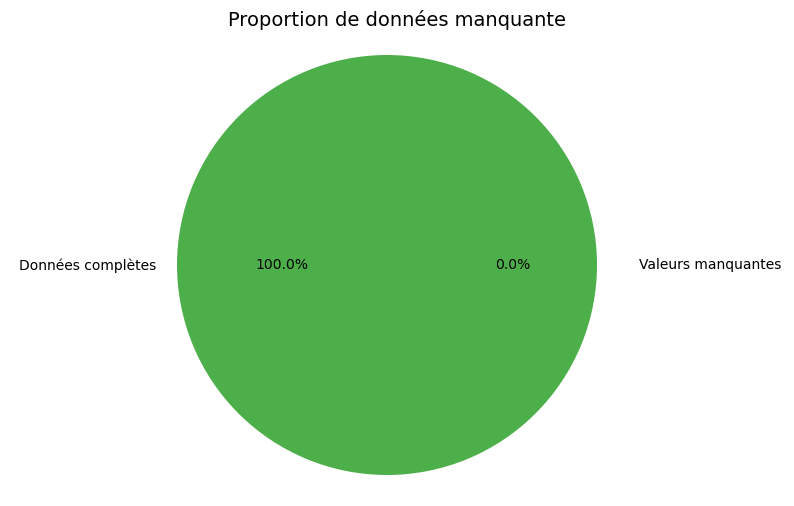

In [92]:

total_manquant = np.prod(pertinent_EdStatsSeries.shape)
valeur_manquant = pertinent_EdStatsSeries.isna().sum().sum()
labels = ["Données complètes", "Valeurs manquantes"]
vals = [total_manquant - valeur_manquant, valeur_manquant]
explose = (0, 0.1)  

couleurs = ['#4daf4a', '#e41a1c']

# Création du graphique en secteurs
plt.figure(figsize=[10, 6]) 
plt.pie(x=vals, labels=labels, explode=explose, autopct="%.1f%%", pctdistance=0.5, colors=couleurs) 
plt.title("Proportion de données manquante", fontsize=14)
plt.axis("equal")

### Bilan de  EdStatsSeries.csv

# Etape-3 Creer un dataframe dans le but mener une analyse

###  Affichage les dataframes pertinents

In [116]:
display(pertinent_EdStatsSeries.head())
display(pertinent_edstatscountry.head())
display(pertinent_EdStatsData.head())

,Series Code,Indicator Name,Topic
3,BAR.NOED.15UP.ZS,Barro-Lee: Percentage of population age 15+ wi...,Attainment
611,IT.NET.USER.P2,Internet users (per 100 people),Infrastructure: Communications
1662,NY.GDP.PCAP.CD,GDP per capita (current US$),Economic Policy & Debt: National accounts: US$...
1664,NY.GDP.PCAP.PP.CD,"GDP per capita, PPP (current international $)",Economic Policy & Debt: Purchasing power parity
1679,OECD.TSAL.2.E10,Annual statutory teacher salaries in public in...,Teachers


,Country Code,Income Group,Region
0,ABW,High income: nonOECD,Latin America & Caribbean
1,AFG,Low income,South Asia
2,AGO,Upper middle income,Sub-Saharan Africa
3,ALB,Upper middle income,Europe & Central Asia
4,AND,High income: nonOECD,Europe & Central Asia


,Country Name,Country Code,Indicator Name,Indicator Code,1970,1971,1972,1973,1974,1975,1976,1977,1978,1979,1980,1981,1982,1983,1984,1985,1986,1987,1988,1989,1990,1991,1992,1993,1994,1995,1996,1997,1998,1999,2000,2001,2002,2003,2004,2005,2006,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016,2017,2020,2025,2030,2035,2040,2045,2050,2055,2060,2065,2070,2075,2080,2085,2090,2095,2100,Unnamed: 69
91625,Afghanistan,AFG,"Adjusted net enrolment rate, lower secondary, ...",UIS.NERA.2,NaN,NaN,NaN,NaN,7.05911,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,17.260189,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,28.05987,NaN,NaN,NaN,NaN,NaN,47.43679,50.627232,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
91645,Afghanistan,AFG,"Adult literacy rate, population 15+ years, bot...",SE.ADT.LITR.ZS,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,18.157681,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,31.74112,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
91647,Afghanistan,AFG,"Adult literacy rate, population 15+ years, gen...",UIS.LR.AG15T99.GPI,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.164560,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.38778,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
91758,Afghanistan,AFG,Annual statutory teacher salaries in public in...,OECD.TSAL.2.E10,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
91999,Afghanistan,AFG,Barro-Lee: Percentage of population age 15+ wi...,BAR.NOED.15UP.ZS,88.81,NaN,NaN,NaN,NaN,85.74,NaN,NaN,NaN,NaN,82.03,NaN,NaN,NaN,NaN,77.8,NaN,NaN,NaN,NaN,75.04,NaN,NaN,NaN,NaN,73.21,NaN,NaN,NaN,NaN,67.85,NaN,NaN,NaN,NaN,65.73,NaN,NaN,NaN,NaN,58.38,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [117]:
# Effectuez maintenant la jointure
jointure = pertinent_EdStatsData.merge(pertinent_edstatscountry, on="Country Code", how="left")
display(jointure)

,Country Name,Country Code,Indicator Name,Indicator Code,1970,1971,1972,1973,1974,1975,1976,1977,1978,1979,1980,1981,1982,1983,1984,1985,1986,1987,1988,1989,1990,1991,1992,1993,1994,1995,1996,1997,1998,1999,2000,2001,2002,2003,2004,2005,2006,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016,2017,2020,2025,2030,2035,2040,2045,2050,2055,2060,2065,2070,2075,2080,2085,2090,2095,2100,Unnamed: 69,Income Group,Region
0,Afghanistan,AFG,"Adjusted net enrolment rate, lower secondary, ...",UIS.NERA.2,NaN,NaN,NaN,NaN,7.05911,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,17.260189,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,28.05987,NaN,NaN,NaN,NaN,NaN,47.43679,50.627232,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Low income,South Asia
1,Afghanistan,AFG,"Adult literacy rate, population 15+ years, bot...",SE.ADT.LITR.ZS,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,18.157681,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,31.74112,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Low income,South Asia
2,Afghanistan,AFG,"Adult literacy rate, population 15+ years, gen...",UIS.LR.AG15T99.GPI,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.164560,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.38778,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Low income,South Asia
3,Afghanistan,AFG,Annual statutory teacher salaries in public in...,OECD.TSAL.2.E10,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Low income,South Asia
4,Afghanistan,AFG,Barro-Lee: Percentage of population age 15+ wi...,BAR.NOED.15UP.ZS,88.81,NaN,NaN,NaN,NaN,85.74,NaN,NaN,NaN,NaN,82.03,NaN,NaN,NaN,NaN,77.8,NaN,NaN,NaN,NaN,75.04,NaN,NaN,NaN,NaN,73.21,NaN,NaN,NaN,NaN,67.85,NaN,NaN,NaN,NaN,65.73,NaN,NaN,NaN,NaN,58.38,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Low income,South Asia
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4675,Zimbabwe,ZWE,Wittgenstein Projection: Mean years of schooli...,PRJ.MYS.2024.MF,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,11.30,NaN,NaN,NaN,NaN,11.70,NaN,NaN,12.00,12.20,12.30,12.50,12.60,12.70,12.70,12.80,12.80,12.90,12.90,13.00,13.00,13.10,13.20,13.20,13.30,NaN,Low income,Sub-Saharan Africa
4676,Zimbabwe,ZWE,Wittgenstein Projection: Percentage of the pop...,PRJ.ATT.2529.4.MF,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.06,NaN,NaN,NaN,NaN,0.07,NaN,NaN,0.08,0.09,0.10,0.11,0.12,0.14,0.15,0.17,0.18,0.20,0.22,0.23,0.25,0.27,0.29,0.31,0.33,NaN,Low income,Sub-Saharan Africa
4677,Zimbabwe,ZWE,Wittgenstein Projection: Population age 25-29 ...,PRJ.POP.2529.4.MF,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,76.71,NaN,NaN,NaN,NaN,90.03,NaN,NaN,99.70,107.30,117.68,134.22,144.02,152.44,158.23,162.40,169.05,177.46,185.54,191.79,195.98,203.30,209.91,219.22,222.40,NaN,Low income,Sub-Saharan Africa
4678,Zimbabwe,ZWE,"Youth illiterate population, 15-24 years, both...",UIS.LP.AG15T24,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN

### Jointure de pertinent_EdStatsData et pertinent_edstatscountry

In [118]:
jointure = pertinent_EdStatsData.merge(pertinent_edstatscountry, on="Country Code", how="left")
display(jointure)

,Country Name,Country Code,Indicator Name,Indicator Code,1970,1971,1972,1973,1974,1975,1976,1977,1978,1979,1980,1981,1982,1983,1984,1985,1986,1987,1988,1989,1990,1991,1992,1993,1994,1995,1996,1997,1998,1999,2000,2001,2002,2003,2004,2005,2006,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016,2017,2020,2025,2030,2035,2040,2045,2050,2055,2060,2065,2070,2075,2080,2085,2090,2095,2100,Unnamed: 69,Income Group,Region
0,Afghanistan,AFG,"Adjusted net enrolment rate, lower secondary, ...",UIS.NERA.2,NaN,NaN,NaN,NaN,7.05911,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,17.260189,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,28.05987,NaN,NaN,NaN,NaN,NaN,47.43679,50.627232,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Low income,South Asia
1,Afghanistan,AFG,"Adult literacy rate, population 15+ years, bot...",SE.ADT.LITR.ZS,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,18.157681,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,31.74112,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Low income,South Asia
2,Afghanistan,AFG,"Adult literacy rate, population 15+ years, gen...",UIS.LR.AG15T99.GPI,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.164560,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.38778,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Low income,South Asia
3,Afghanistan,AFG,Annual statutory teacher salaries in public in...,OECD.TSAL.2.E10,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Low income,South Asia
4,Afghanistan,AFG,Barro-Lee: Percentage of population age 15+ wi...,BAR.NOED.15UP.ZS,88.81,NaN,NaN,NaN,NaN,85.74,NaN,NaN,NaN,NaN,82.03,NaN,NaN,NaN,NaN,77.8,NaN,NaN,NaN,NaN,75.04,NaN,NaN,NaN,NaN,73.21,NaN,NaN,NaN,NaN,67.85,NaN,NaN,NaN,NaN,65.73,NaN,NaN,NaN,NaN,58.38,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Low income,South Asia
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4675,Zimbabwe,ZWE,Wittgenstein Projection: Mean years of schooli...,PRJ.MYS.2024.MF,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,11.30,NaN,NaN,NaN,NaN,11.70,NaN,NaN,12.00,12.20,12.30,12.50,12.60,12.70,12.70,12.80,12.80,12.90,12.90,13.00,13.00,13.10,13.20,13.20,13.30,NaN,Low income,Sub-Saharan Africa
4676,Zimbabwe,ZWE,Wittgenstein Projection: Percentage of the pop...,PRJ.ATT.2529.4.MF,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.06,NaN,NaN,NaN,NaN,0.07,NaN,NaN,0.08,0.09,0.10,0.11,0.12,0.14,0.15,0.17,0.18,0.20,0.22,0.23,0.25,0.27,0.29,0.31,0.33,NaN,Low income,Sub-Saharan Africa
4677,Zimbabwe,ZWE,Wittgenstein Projection: Population age 25-29 ...,PRJ.POP.2529.4.MF,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,76.71,NaN,NaN,NaN,NaN,90.03,NaN,NaN,99.70,107.30,117.68,134.22,144.02,152.44,158.23,162.40,169.05,177.46,185.54,191.79,195.98,203.30,209.91,219.22,222.40,NaN,Low income,Sub-Saharan Africa
4678,Zimbabwe,ZWE,"Youth illiterate population, 15-24 years, both...",UIS.LP.AG15T24,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN

### Jointure avec pertinent_EdStatsSeries

In [119]:
df = jointure.merge(pertinent_EdStatsSeries, on="Indicator Name", how="inner")
display(df)

,Country Name,Country Code,Indicator Name,Indicator Code,1970,1971,1972,1973,1974,1975,1976,1977,1978,1979,1980,1981,1982,1983,1984,1985,1986,1987,1988,1989,1990,1991,1992,1993,1994,1995,1996,1997,1998,1999,2000,2001,2002,2003,2004,2005,2006,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016,2017,2020,2025,2030,2035,2040,2045,2050,2055,2060,2065,2070,2075,2080,2085,2090,2095,2100,Unnamed: 69,Income Group,Region,Series Code,Topic
0,Afghanistan,AFG,"Adjusted net enrolment rate, lower secondary, ...",UIS.NERA.2,NaN,NaN,NaN,NaN,7.05911,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,17.260189,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,28.05987,NaN,NaN,NaN,NaN,NaN,47.436790,50.627232,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Low income,South Asia,UIS.NERA.2,Secondary
1,Albania,ALB,"Adjusted net enrolment rate, lower secondary, ...",UIS.NERA.2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,84.558281,85.30661,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,87.666588,88.778252,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Upper middle income,Europe & Central Asia,UIS.NERA.2,Secondary
2,Algeria,DZA,"Adjusted net enrolment rate, lower secondary, ...",UIS.NERA.2,NaN,9.1732,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,45.43399,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,60.367668,57.79586,59.062691,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Upper middle income,Middle East & North Africa,UIS.NERA.2,Secondary
3,Andorra,AND,"Adjusted net enrolment rate, lower secondary, ...",UIS.NERA.2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,High income: nonOECD,Europe & Central Asia,UIS.NERA.2,Secondary
4,Angola,AGO,"Adjusted net enrolment rate, lower secondary, ...",UIS.NERA.2,NaN,NaN,3.44941,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.915100,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5.12146,5.16169,6.00600,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Upper middle income,Sub-Saharan Africa,UIS.NERA.2,Secondary
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4090,"Venezuela, RB",VEN,"Youth literacy rate, population 15-24 years, b...",SE.ADT.1524.LT.ZS,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,93.111763,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,95.439034,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,97.19934,NaN,NaN,NaN,NaN,NaN,98.39878,NaN,98.53330,NaN,97.55916,NaN,NaN,NaN,99.00763,98.75951,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Upper middle income,Latin America & Caribbean,SE.ADT.1524.LT.ZS,Literacy
4091,Vietnam,VNM,"Youth literacy rate, population 15-24 years, b...",SE.ADT.1524.LT.ZS,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,95.025124,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,93.734261,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,94.09706,94.836510,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,97.09167,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Lower middle income,East Asia & Pacific,SE.ADT.1524.LT.ZS,Literacy
4092,"Yemen, Rep.",YEM,"Youth literacy rate, population 15-24 years, b...",SE.ADT.1524.LT.ZS,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,60.222141,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN

In [120]:
df["Indicator Name"].value_counts()

Indicator Name
Adjusted net enrolment rate, lower secondary, both sexes (%)                                                195
Government expenditure on education as % of GDP (%)                                                         195
Youth illiterate population, 15-24 years, both sexes (number)                                               195
Population, total                                                                                           195
Population, ages 15-24, total                                                                               195
Population of the official entrance age to secondary general education, male (number)                       195
Population of the official age for tertiary education, both sexes (number)                                  195
Population growth (annual %)                                                                                195
Internet users (per 100 people)                                                          

## Quelque graphique du dataframe pret a analyser

#### Nombre de donnee par an

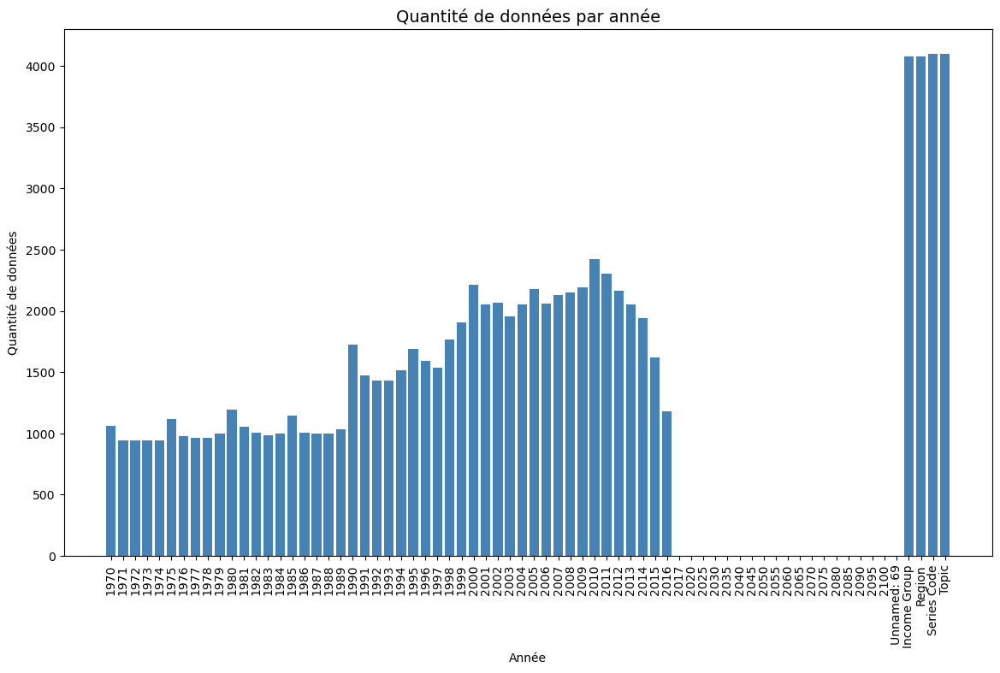

In [121]:
# Calcul du nombre de données non manquantes par année
data_counts = df.iloc[:, 4:].count()

# Création du graphique
plt.figure(figsize=(14, 8))
plt.bar(data_counts.index, data_counts.values, color='steelblue')
plt.title("Quantité de données par année", fontsize=14)
plt.xlabel("Année")
plt.ylabel("Quantité de données")
plt.xticks(rotation=90)
plt.show()

#### Graphique des données par pays 

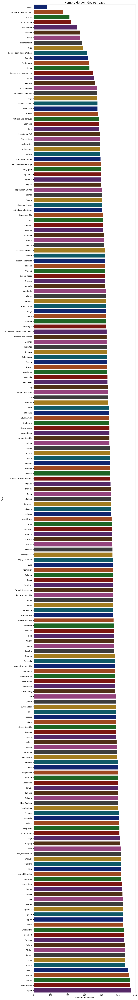

In [122]:
# numero de colonne commence les annees
YEARS = df.columns[4:]

# Calculer la quantité de données par pays
data_counts_by_country = df.groupby("Country Name")[YEARS].count().sum(axis=1).sort_values()

# Créer le graphique
plt.figure(figsize=(10, len(data_counts_by_country) / 2)) 
plt.title("Nombre de données par pays", size=15)
plot = sns.barplot(x=data_counts_by_country.values, y=data_counts_by_country.index, palette="dark")
plot.set(xlabel="Quantité de données", ylabel="Pays")
plt.show()

#### Graphique données par Topic

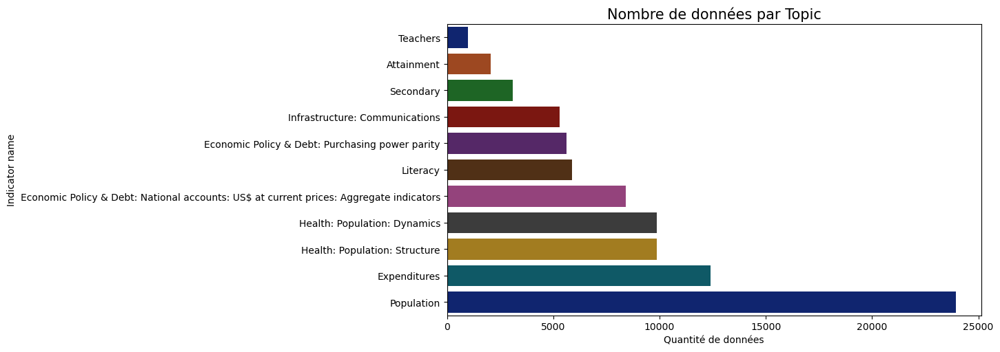

In [123]:
# numero de colonne commence les annees
YEARS = df.columns[4:]

# Calculer la quantité de données par pays
data_counts_by_country = df.groupby("Topic")[YEARS].count().sum(axis=1).sort_values()

# Créer le graphique
plt.figure(figsize=(10, len(data_counts_by_country) / 2))  
plt.title("Nombre de données par Topic", size=15)
plot = sns.barplot(x=data_counts_by_country.values, y=data_counts_by_country.index, palette="dark")
plot.set(xlabel="Quantité de données", ylabel="Indicator name")
plt.show()

#### Graphique donnee par Region

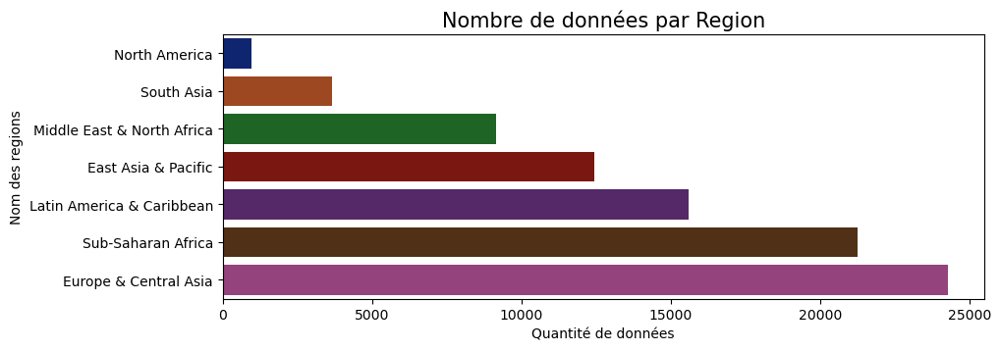

In [124]:
# numero de colonne commence les annees
YEARS = df.columns[4:]

# Calculer la quantité de données par pays
data_counts_by_country = df.groupby("Region")[YEARS].count().sum(axis=1).sort_values()

# Créer le graphique
plt.figure(figsize=(10, len(data_counts_by_country) / 2))  
plt.title("Nombre de données par Region", size=15)
plot = sns.barplot(x=data_counts_by_country.values, y=data_counts_by_country.index, palette="dark")
plot.set(xlabel="Quantité de données", ylabel="Nom des regions")
plt.show()

#### Graphique donnee par indicator Name

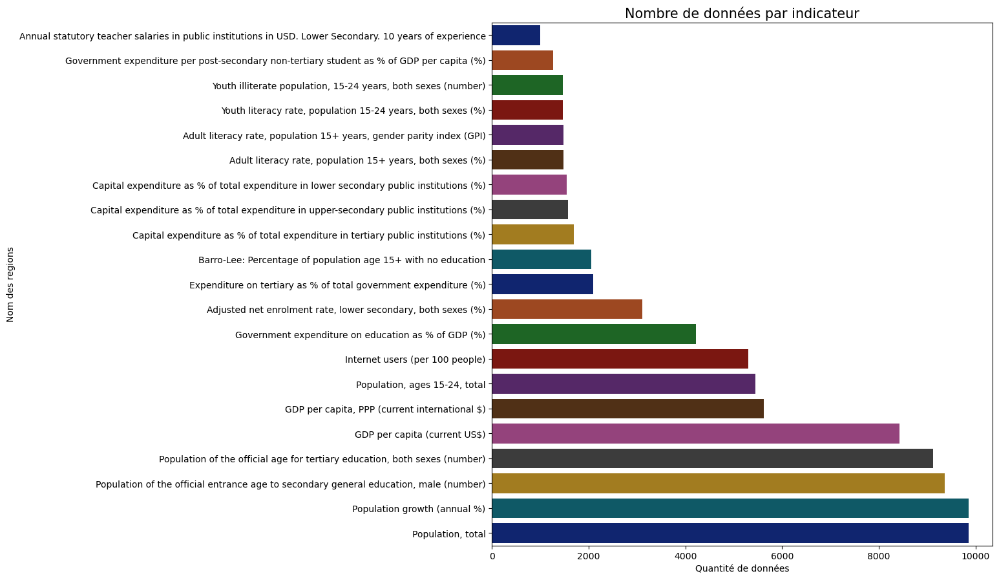

In [125]:
# numero de colonne commence les annees
YEARS = df.columns[4:]

# Calculer la quantité de données par pays
data_counts_by_country = df.groupby("Indicator Name")[YEARS].count().sum(axis=1).sort_values()

# Créer le graphique
plt.figure(figsize=(10, len(data_counts_by_country) / 2))  
plt.title("Nombre de données par indicateur", size=15)
plot = sns.barplot(x=data_counts_by_country.values, y=data_counts_by_country.index, palette="dark")
plot.set(xlabel="Quantité de données", ylabel="Nom des regions")
plt.show()

# Etape-4 Analyser le jeu de donnée

### Exploration du dataframe pret a analyser

#### Afficher les 5 premier

In [126]:
df.head()

,Country Name,Country Code,Indicator Name,Indicator Code,1970,1971,1972,1973,1974,1975,1976,1977,1978,1979,1980,1981,1982,1983,1984,1985,1986,1987,1988,1989,1990,1991,1992,1993,1994,1995,1996,1997,1998,1999,2000,2001,2002,2003,2004,2005,2006,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016,2017,2020,2025,2030,2035,2040,2045,2050,2055,2060,2065,2070,2075,2080,2085,2090,2095,2100,Unnamed: 69,Income Group,Region,Series Code,Topic
0,Afghanistan,AFG,"Adjusted net enrolment rate, lower secondary, ...",UIS.NERA.2,NaN,NaN,NaN,NaN,7.05911,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,17.260189,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,28.05987,NaN,NaN,NaN,NaN,NaN,47.436790,50.627232,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Low income,South Asia,UIS.NERA.2,Secondary
1,Albania,ALB,"Adjusted net enrolment rate, lower secondary, ...",UIS.NERA.2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,84.558281,85.30661,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,87.666588,88.778252,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Upper middle income,Europe & Central Asia,UIS.NERA.2,Secondary
2,Algeria,DZA,"Adjusted net enrolment rate, lower secondary, ...",UIS.NERA.2,NaN,9.1732,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,45.43399,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,60.367668,57.79586,59.062691,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Upper middle income,Middle East & North Africa,UIS.NERA.2,Secondary
3,Andorra,AND,"Adjusted net enrolment rate, lower secondary, ...",UIS.NERA.2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,High income: nonOECD,Europe & Central Asia,UIS.NERA.2,Secondary
4,Angola,AGO,"Adjusted net enrolment rate, lower secondary, ...",UIS.NERA.2,NaN,NaN,3.44941,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.9151,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5.12146,5.16169,6.006,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Upper middle income,Sub-Saharan Africa,UIS.NERA.2,Secondary


#### Info sur les variables

In [127]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4095 entries, 0 to 4094
Data columns (total 74 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   Country Name    4095 non-null   object 
 1   Country Code    4095 non-null   object 
 2   Indicator Name  4095 non-null   object 
 3   Indicator Code  4095 non-null   object 
 4   1970            1063 non-null   float64
 5   1971            945 non-null    float64
 6   1972            942 non-null    float64
 7   1973            940 non-null    float64
 8   1974            943 non-null    float64
 9   1975            1116 non-null   float64
 10  1976            981 non-null    float64
 11  1977            965 non-null    float64
 12  1978            967 non-null    float64
 13  1979            999 non-null    float64
 14  1980            1191 non-null   float64
 15  1981            1053 non-null   float64
 16  1982            1009 non-null   float64
 17  1983            983 non-null    f

#### Nombre de colonne et ligne

In [128]:
df.shape

(4095, 74)

#### Nombre dupliqué 

In [129]:
df.duplicated().sum()

0

#### Types des variables

In [130]:
df.dtypes

Country Name       object
Country Code       object
Indicator Name     object
Indicator Code     object
1970              float64
                   ...   
Unnamed: 69       float64
Income Group       object
Region             object
Series Code        object
Topic              object
Length: 74, dtype: object

#### Nombre de donnees manquantes

In [131]:
df.isnull().sum()

Country Name         0
Country Code         0
Indicator Name       0
Indicator Code       0
1970              3032
                  ... 
Unnamed: 69       4095
Income Group        21
Region              21
Series Code          0
Topic                0
Length: 74, dtype: int64

#### Pourcentage donnees manquantes

In [132]:
poucentage_manquant = df.isna().sum()*100/df.shape[0]
round(poucentage_manquant.sort_values(),2)

Country Name        0.0
Series Code         0.0
Indicator Code      0.0
Topic               0.0
Indicator Name      0.0
                  ...  
2040              100.0
2035              100.0
2030              100.0
2070              100.0
2045              100.0
Length: 74, dtype: float64

### Visualisation des données manquantes Missing

#### Affichage Missing 

In [133]:
df.replace('--', pd.NA, inplace=True)

#### Missigno matrix

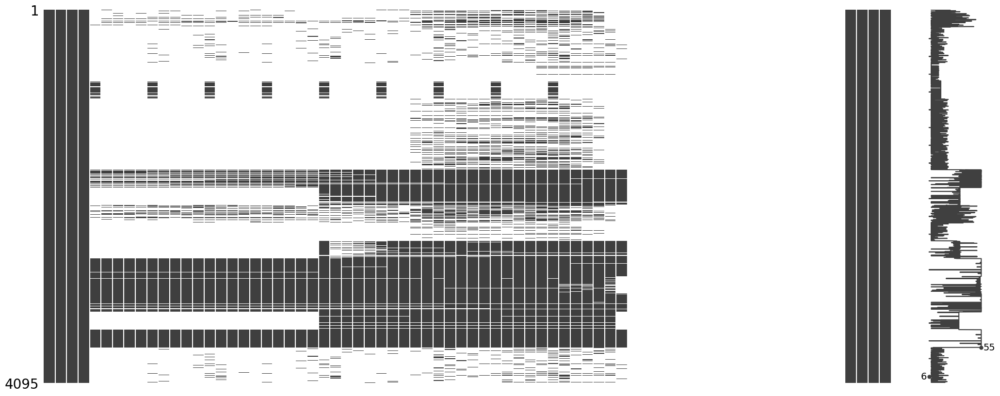

In [134]:
msno.matrix(df)
plt.show()

### Missigno bar

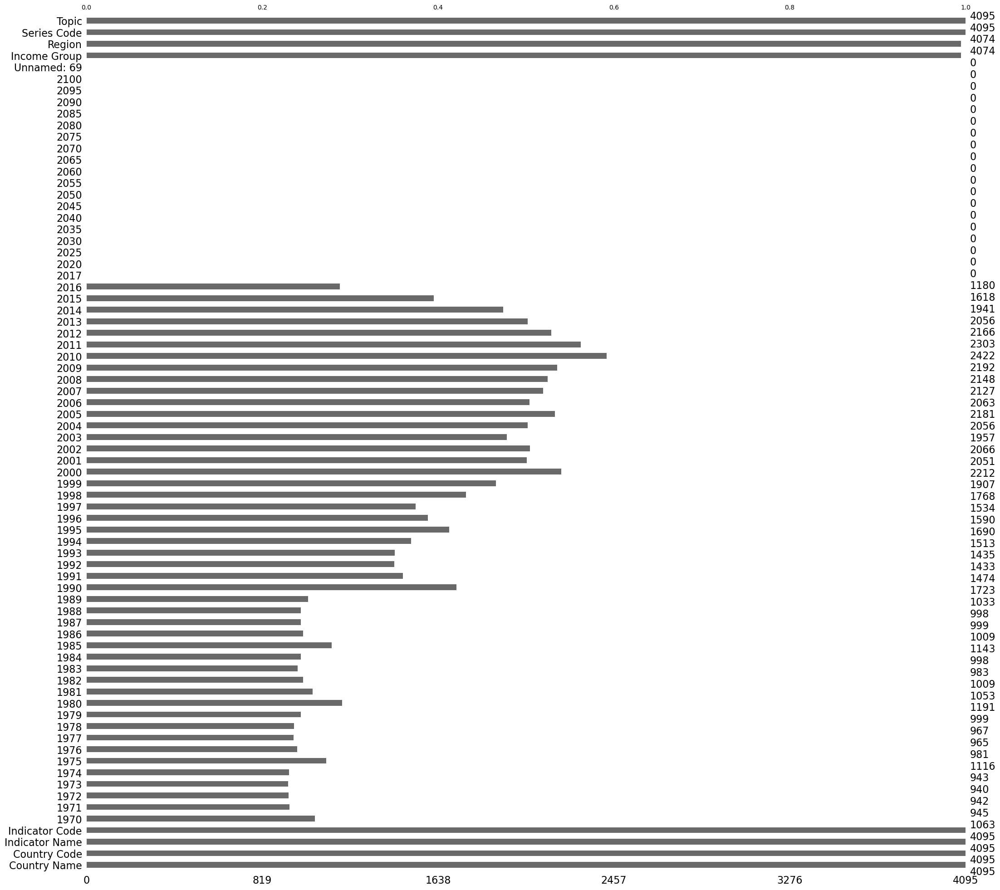

In [135]:
msno.bar(df)
plt.show()

### Missigne Heatmap

In [136]:
#msno.heatmap(df)

### Missigno Dendrograme

<Axes: >

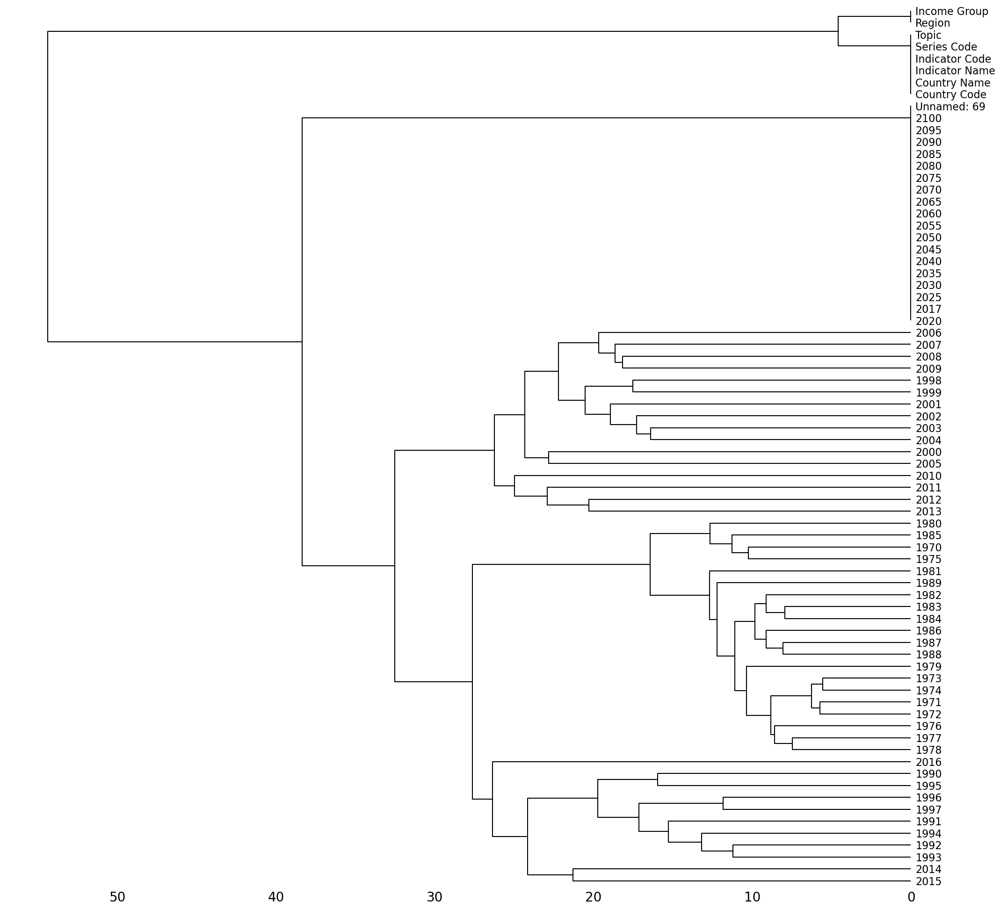

In [137]:
msno.dendrogram(df)

# Filtrer les 3 jointure de dataframe 

#### Choix des années pertinents 

In [138]:
# Afficher les nom de colonne 
df.columns

Index(['Country Name', 'Country Code', 'Indicator Name', 'Indicator Code',
       '1970', '1971', '1972', '1973', '1974', '1975', '1976', '1977', '1978',
       '1979', '1980', '1981', '1982', '1983', '1984', '1985', '1986', '1987',
       '1988', '1989', '1990', '1991', '1992', '1993', '1994', '1995', '1996',
       '1997', '1998', '1999', '2000', '2001', '2002', '2003', '2004', '2005',
       '2006', '2007', '2008', '2009', '2010', '2011', '2012', '2013', '2014',
       '2015', '2016', '2017', '2020', '2025', '2030', '2035', '2040', '2045',
       '2050', '2055', '2060', '2065', '2070', '2075', '2080', '2085', '2090',
       '2095', '2100', 'Unnamed: 69', 'Income Group', 'Region', 'Series Code',
       'Topic'],
      dtype='object')

In [139]:
# je vais suprimer certaine annee qui ne sont pas interessant du projet 
filtre_annee = pd.DataFrame(df[['Country Name', 'Country Code', 'Indicator Name', 'Indicator Code', 'Income Group', 'Region', 'Topic', '2005', '2006', '2007', '2008', '2009', '2010', '2011', '2012', '2013', '2014', '2015']])
display(filtre_annee)

,Country Name,Country Code,Indicator Name,Indicator Code,Income Group,Region,Topic,2005,2006,2007,2008,2009,2010,2011,2012,2013,2014,2015
0,Afghanistan,AFG,"Adjusted net enrolment rate, lower secondary, ...",UIS.NERA.2,Low income,South Asia,Secondary,NaN,NaN,28.05987,NaN,NaN,NaN,NaN,NaN,47.436790,50.627232,NaN
1,Albania,ALB,"Adjusted net enrolment rate, lower secondary, ...",UIS.NERA.2,Upper middle income,Europe & Central Asia,Secondary,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,87.666588,88.778252,NaN
2,Algeria,DZA,"Adjusted net enrolment rate, lower secondary, ...",UIS.NERA.2,Upper middle income,Middle East & North Africa,Secondary,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,Andorra,AND,"Adjusted net enrolment rate, lower secondary, ...",UIS.NERA.2,High income: nonOECD,Europe & Central Asia,Secondary,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,Angola,AGO,"Adjusted net enrolment rate, lower secondary, ...",UIS.NERA.2,Upper middle income,Sub-Saharan Africa,Secondary,NaN,NaN,NaN,5.12146,5.16169,6.00600,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4090,"Venezuela, RB",VEN,"Youth literacy rate, population 15-24 years, b...",SE.ADT.1524.LT.ZS,Upper middle income,Latin America & Caribbean,Literacy,NaN,NaN,98.39878,NaN,98.53330,NaN,97.55916,NaN,NaN,NaN,99.00763
4091,Vietnam,VNM,"Youth literacy rate, population 15-24 years, b...",SE.ADT.1524.LT.ZS,Lower middle income,East Asia & Pacific,Literacy,NaN,NaN,NaN,NaN,97.09167,NaN,NaN,NaN,NaN,NaN,NaN
4092,"Yemen, Rep.",YEM,"Youth literacy rate, population 15-24 years, b...",SE.ADT.1524.LT.ZS,Lower middle income,Middle East & North Africa,Literacy,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4093,Zambia,ZMB,"Youth literacy rate, population 15-24 years, b...",SE.ADT.1524.LT.ZS,Lower middle income,Sub-Saharan Africa,Literacy,NaN,NaN,64.04964,NaN,NaN,88.71456,NaN,NaN,NaN,NaN,NaN


#### Afficher la liste d'indicateur de df

In [140]:
# j'affiche la liste pour filtrer
filtre_annee["Indicator Name"].value_counts()

Indicator Name
Adjusted net enrolment rate, lower secondary, both sexes (%)                                                195
Government expenditure on education as % of GDP (%)                                                         195
Youth illiterate population, 15-24 years, both sexes (number)                                               195
Population, total                                                                                           195
Population, ages 15-24, total                                                                               195
Population of the official entrance age to secondary general education, male (number)                       195
Population of the official age for tertiary education, both sexes (number)                                  195
Population growth (annual %)                                                                                195
Internet users (per 100 people)                                                          

#### choix des indicateurs pertinents

In [141]:
indicator_precise = [
     'Population, ages 15-24, total', 'Population growth (annual %)',
     'GDP per capita, PPP (current international $)',
     'Internet users (per 100 people)',
     'Adjusted net enrolment rate, lower secondary, both sexes (%)',
     'Population, total',
     'Annual statutory teacher salaries in public institutions in USD. Lower Secondary. 10 years of experience',
     'GDP per capita, PPP (current international $)'
     'Adult literacy rate, population 15+ years, both sexes (%)',
     'Government expenditure on education as % of GDP (%)',
     'Expenditure on tertiary as % of total government expenditure (%) ',
     'Population of the official entrance age to secondary general education, male (number)',
     'Wittgenstein Projection: Mean years of schooling. Age 20-24. Total',
     'Wittgenstein Projection: Percentage of the population age 25-29 by highest level of educational attainment. Post Secondary. Total',
     'Wittgenstein Projection: Population age 25-29 in thousands by highest level of educational attainment. Post Secondary. Total',
     'GDP per capita (current US$)',]


# Filtrer le DataFrame pour ne conserver que les indicator choisi
data_etude = filtre_annee[filtre_annee['Indicator Name'].isin(indicator_precise)]

# Afficher le DataFrame filtré
display(data_etude)

,Country Name,Country Code,Indicator Name,Indicator Code,Income Group,Region,Topic,2005,2006,2007,2008,2009,2010,2011,2012,2013,2014,2015
0,Afghanistan,AFG,"Adjusted net enrolment rate, lower secondary, ...",UIS.NERA.2,Low income,South Asia,Secondary,NaN,NaN,2.805987e+01,NaN,NaN,NaN,NaN,NaN,4.743679e+01,5.062723e+01,NaN
1,Albania,ALB,"Adjusted net enrolment rate, lower secondary, ...",UIS.NERA.2,Upper middle income,Europe & Central Asia,Secondary,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,8.766659e+01,8.877825e+01,NaN
2,Algeria,DZA,"Adjusted net enrolment rate, lower secondary, ...",UIS.NERA.2,Upper middle income,Middle East & North Africa,Secondary,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,Andorra,AND,"Adjusted net enrolment rate, lower secondary, ...",UIS.NERA.2,High income: nonOECD,Europe & Central Asia,Secondary,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,Angola,AGO,"Adjusted net enrolment rate, lower secondary, ...",UIS.NERA.2,Upper middle income,Sub-Saharan Africa,Secondary,NaN,NaN,NaN,5.121460e+00,5.161690e+00,6.006000e+00,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3700,"Venezuela, RB",VEN,"Population, total",SP.POP.TOTL,Upper middle income,Latin America & Caribbean,Health: Population: Structure,26784161.0,27239168.0,2.769196e+07,2.814170e+07,2.858732e+07,2.902803e+07,29463291.0,29893080.0,3.031785e+07,3.073838e+07,31155134.0
3701,Vietnam,VNM,"Population, total",SP.POP.TOTL,Lower middle income,East Asia & Pacific,Health: Population: Structure,82392100.0,83311200.0,8.421850e+07,8.511870e+07,8.602500e+07,8.693250e+07,87860300.0,88809200.0,8.975950e+07,9.072890e+07,91713300.0
3702,"Yemen, Rep.",YEM,"Population, total",SP.POP.TOTL,Lower middle income,Middle East & North Africa,Health: Population: Structure,20582927.0,21160534.0,2.175160e+07,2.235639e+07,2.297493e+07,2.360678e+07,24252206.0,24909969.0,2.557632e+07,2.624633e+07,26916207.0
3703,Zambia,ZMB,"Population, total",SP.POP.TOTL,Lower middle income,Sub-Saharan Africa,Health: Population: Structure,12052156.0,12383446.0,1.272597e+07,1.308252e+07,1.345642e+07,1.385003e+07,14264756.0,14699937.0,1.515321e+07,1.562097e+07,16100587.0


In [142]:
data_etude["Indicator Name"].value_counts()

Indicator Name
Adjusted net enrolment rate, lower secondary, both sexes (%)                                                195
Annual statutory teacher salaries in public institutions in USD. Lower Secondary. 10 years of experience    195
GDP per capita (current US$)                                                                                195
GDP per capita, PPP (current international $)                                                               195
Government expenditure on education as % of GDP (%)                                                         195
Internet users (per 100 people)                                                                             195
Population growth (annual %)                                                                                195
Population of the official entrance age to secondary general education, male (number)                       195
Population, ages 15-24, total                                                            

In [143]:
## supprimer les colonnes et les lignes qui ne contiennent que des valeurs NaN.
#data_etude = data_etude.dropna(axis="columns", how="all").dropna(axis="rows", how="all")
#data_etude

# pivoter les 3 jointure

In [144]:
# Faire fondre les colonnes années en une seule colonne
df_melt1 = data_etude.melt(id_vars=["Country Name", "Country Code", "Indicator Name", "Indicator Code", "Income Group",	"Region", "Topic"], 
                    var_name="Year", 
                    value_name="Value")

# Pivoter les données
data_etude_pivoter = df_melt1.pivot_table(index=["Country Code", "Indicator Code", "Country Name", "Year", "Income Group", "Region", "Topic"], 
                                   columns="Indicator Name", 
                                   values="Value", 
                                   aggfunc="first").reset_index()

# Afficher les premières lignes du tableau pivoté
display(data_etude_pivoter)

Indicator Name,Country Code,Indicator Code,Country Name,Year,Income Group,Region,Topic,"Adjusted net enrolment rate, lower secondary, both sexes (%)",Annual statutory teacher salaries in public institutions in USD. Lower Secondary. 10 years of experience,GDP per capita (current US$),"GDP per capita, PPP (current international $)",Government expenditure on education as % of GDP (%),Internet users (per 100 people),Population growth (annual %),"Population of the official entrance age to secondary general education, male (number)","Population, ages 15-24, total","Population, total"
0,AFG,IT.NET.USER.P2,Afghanistan,2005,Low income,South Asia,Infrastructure: Communications,NaN,NaN,NaN,NaN,NaN,1.224148,NaN,NaN,NaN,NaN
1,AFG,IT.NET.USER.P2,Afghanistan,2006,Low income,South Asia,Infrastructure: Communications,NaN,NaN,NaN,NaN,NaN,2.107124,NaN,NaN,NaN,NaN
2,AFG,IT.NET.USER.P2,Afghanistan,2007,Low income,South Asia,Infrastructure: Communications,NaN,NaN,NaN,NaN,NaN,1.900000,NaN,NaN,NaN,NaN
3,AFG,IT.NET.USER.P2,Afghanistan,2008,Low income,South Asia,Infrastructure: Communications,NaN,NaN,NaN,NaN,NaN,1.840000,NaN,NaN,NaN,NaN
4,AFG,IT.NET.USER.P2,Afghanistan,2009,Low income,South Asia,Infrastructure: Communications,NaN,NaN,NaN,NaN,NaN,3.550000,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16743,ZWE,UIS.SAP.23.GPV.G1.M,Zimbabwe,2011,Low income,Sub-Saharan Africa,Population,NaN,NaN,NaN,NaN,NaN,NaN,NaN,170228.0,NaN,NaN
16744,ZWE,UIS.SAP.23.GPV.G1.M,Zimbabwe,2012,Low income,Sub-Saharan Africa,Population,NaN,NaN,NaN,NaN,NaN,NaN,NaN,171085.0,NaN,NaN
16745,ZWE,UIS.SAP.23.GPV.G1.M,Zimbabwe,2013,Low income,Sub-Saharan Africa,Population,NaN,NaN,NaN,NaN,NaN,NaN,NaN,172889.0,NaN,NaN
16746,ZWE,UIS.SAP.23.GPV.G1.M,Zimbabwe,2014,Low income,Sub-Saharan Africa,Population,NaN,NaN,NaN,NaN,NaN,NaN,NaN,175306.0,NaN,NaN


### Graphique de frequence des indicateurs

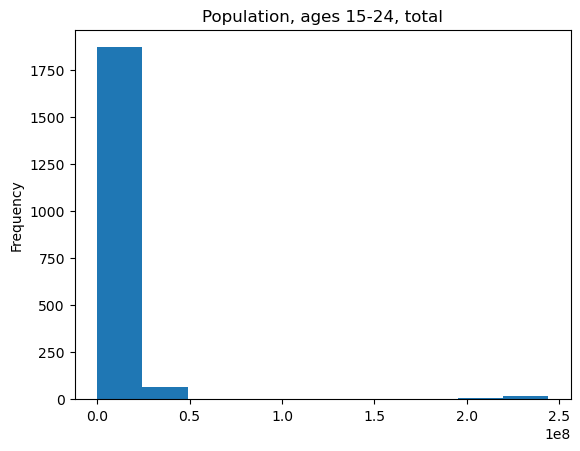

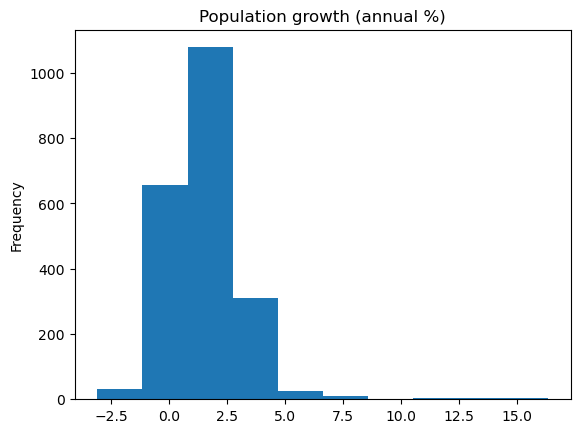

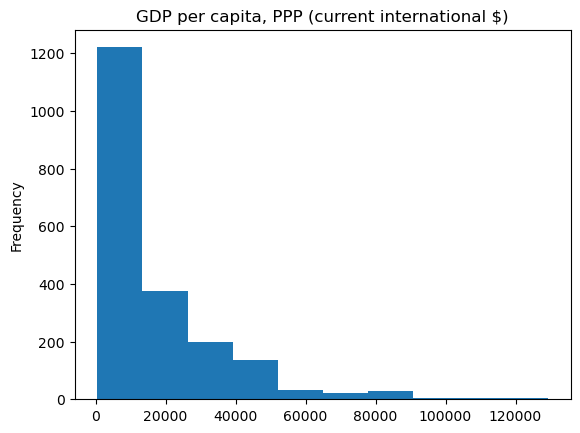

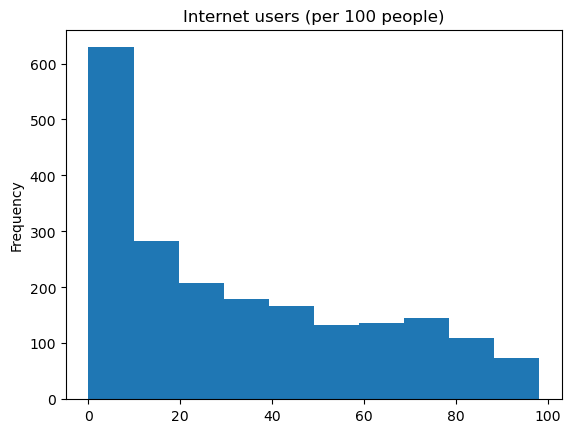

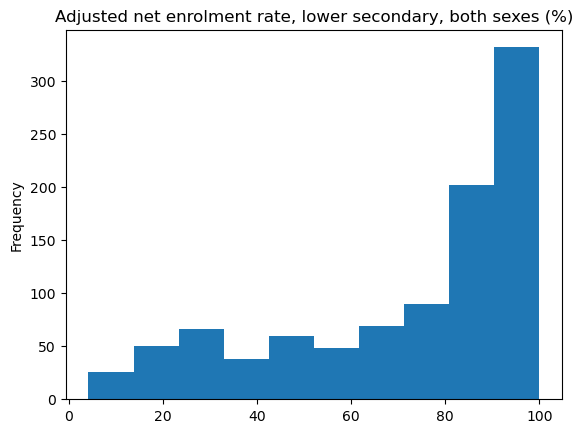

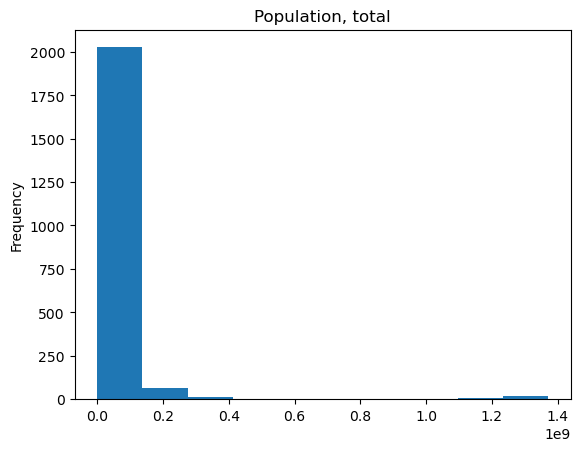

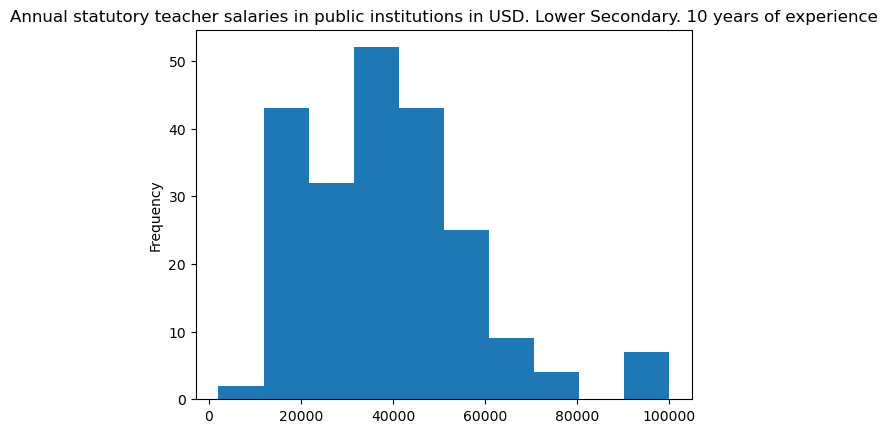

KeyError: 'GDP per capita, PPP (current international $)Adult literacy rate, population 15+ years, both sexes (%)'

In [145]:
for name in indicator_precise:
    data_etude_pivoter[name].plot.hist()
    plt.title(name)
    plt.show()

#  Exploration du data_etude_pivoter

####  Nombre de ligne et colonne

In [146]:
data_etude_pivoter.shape

(16748, 17)

####  Nombre ligne dupliquée 

In [147]:
data_etude_pivoter.duplicated().sum()

0

####  Nombre de donnee manquante 

In [148]:
data_etude_pivoter.isnull().sum()

Indicator Name
Country Code                                                                                                    0
Indicator Code                                                                                                  0
Country Name                                                                                                    0
Year                                                                                                            0
Income Group                                                                                                    0
Region                                                                                                          0
Topic                                                                                                           0
Adjusted net enrolment rate, lower secondary, both sexes (%)                                                15767
Annual statutory teacher salaries in public institutions in USD. Lower Se

#### Pourcentage de donnee manquante 

In [149]:
pourcentage_manquant = (data_etude_pivoter.isna().sum() / data_etude_pivoter.shape[0]) * 100
pourcentage_manquant_arrondi = pourcentage_manquant.sort_values().round(2)

In [150]:
pourcentage_manquant

Indicator Name
Country Code                                                                                                 0.000000
Indicator Code                                                                                               0.000000
Country Name                                                                                                 0.000000
Year                                                                                                         0.000000
Income Group                                                                                                 0.000000
Region                                                                                                       0.000000
Topic                                                                                                        0.000000
Adjusted net enrolment rate, lower secondary, both sexes (%)                                                94.142584
Annual statutory teacher salaries in publ

### Graphique des donnee manquante du data_etude_pivoter

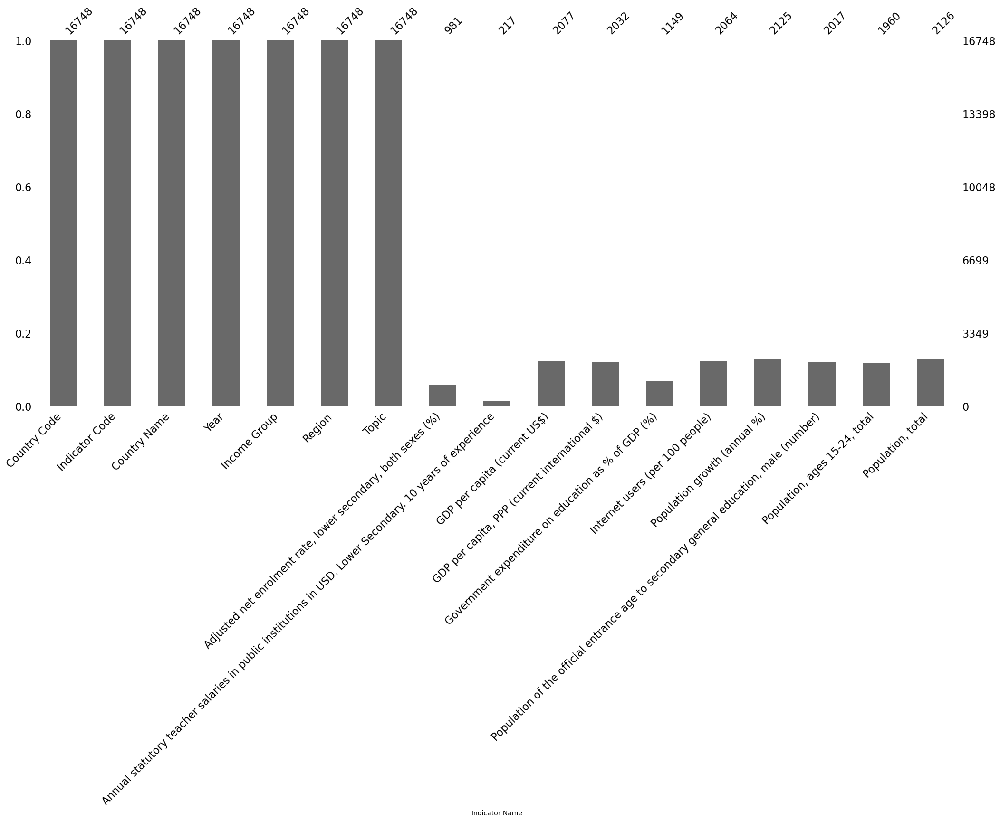

In [151]:
# Aavoir une idee sur l'ensemble des donnees au niveau manquants Representation en bar
msno.bar(data_etude_pivoter)
plt.show()

#### Les types dece chaque

In [152]:
data_etude_pivoter.dtypes

Indicator Name
Country Code                                                                                                 object
Indicator Code                                                                                               object
Country Name                                                                                                 object
Year                                                                                                         object
Income Group                                                                                                 object
Region                                                                                                       object
Topic                                                                                                        object
Adjusted net enrolment rate, lower secondary, both sexes (%)                                                float64
Annual statutory teacher salaries in public institutions 

# Nettoyage des donnees "data_etude_pivoter"

####  supprimer les colonnes et les lignes qui ne contiennent que des valeurs NaN.

In [153]:
data_etude_pivoter = data_etude_pivoter.dropna(axis="columns", how="all").dropna(axis="rows", how="all")
data_etude_pivoter

Indicator Name,Country Code,Indicator Code,Country Name,Year,Income Group,Region,Topic,"Adjusted net enrolment rate, lower secondary, both sexes (%)",Annual statutory teacher salaries in public institutions in USD. Lower Secondary. 10 years of experience,GDP per capita (current US$),"GDP per capita, PPP (current international $)",Government expenditure on education as % of GDP (%),Internet users (per 100 people),Population growth (annual %),"Population of the official entrance age to secondary general education, male (number)","Population, ages 15-24, total","Population, total"
0,AFG,IT.NET.USER.P2,Afghanistan,2005,Low income,South Asia,Infrastructure: Communications,NaN,NaN,NaN,NaN,NaN,1.224148,NaN,NaN,NaN,NaN
1,AFG,IT.NET.USER.P2,Afghanistan,2006,Low income,South Asia,Infrastructure: Communications,NaN,NaN,NaN,NaN,NaN,2.107124,NaN,NaN,NaN,NaN
2,AFG,IT.NET.USER.P2,Afghanistan,2007,Low income,South Asia,Infrastructure: Communications,NaN,NaN,NaN,NaN,NaN,1.900000,NaN,NaN,NaN,NaN
3,AFG,IT.NET.USER.P2,Afghanistan,2008,Low income,South Asia,Infrastructure: Communications,NaN,NaN,NaN,NaN,NaN,1.840000,NaN,NaN,NaN,NaN
4,AFG,IT.NET.USER.P2,Afghanistan,2009,Low income,South Asia,Infrastructure: Communications,NaN,NaN,NaN,NaN,NaN,3.550000,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16743,ZWE,UIS.SAP.23.GPV.G1.M,Zimbabwe,2011,Low income,Sub-Saharan Africa,Population,NaN,NaN,NaN,NaN,NaN,NaN,NaN,170228.0,NaN,NaN
16744,ZWE,UIS.SAP.23.GPV.G1.M,Zimbabwe,2012,Low income,Sub-Saharan Africa,Population,NaN,NaN,NaN,NaN,NaN,NaN,NaN,171085.0,NaN,NaN
16745,ZWE,UIS.SAP.23.GPV.G1.M,Zimbabwe,2013,Low income,Sub-Saharan Africa,Population,NaN,NaN,NaN,NaN,NaN,NaN,NaN,172889.0,NaN,NaN
16746,ZWE,UIS.SAP.23.GPV.G1.M,Zimbabwe,2014,Low income,Sub-Saharan Africa,Population,NaN,NaN,NaN,NaN,NaN,NaN,NaN,175306.0,NaN,NaN


#### Convertir les objetct en float

In [154]:
# Convertir la colonne "Population, total" en valeurs numériques pour une sele 
#data_etude_pivoter["Population, total"] = pd.to_numeric(data_etude_pivoter["Population, total"], errors='coerce')

#Avec plusieur a la fois 
# Liste des colonnes à convertir (virgule supplémentaire corrigée)
colonnes_a_convertir = [
    'Adjusted net enrolment rate, lower secondary, both sexes (%)',                                                
    'Annual statutory teacher salaries in public institutions in USD. Lower Secondary. 10 years of experience',    
    'GDP per capita (current US$)',                                                                                
    'GDP per capita, PPP (current international $)',                                                               
    'Government expenditure on education as % of GDP (%)',                                                         
    'Internet users (per 100 people)',                                                                             
    'Population growth (annual %)',                                                                                
    'Population of the official entrance age to secondary general education, male (number)',                      
    'Population, ages 15-24, total',]

# Conversion des colonnes en numériques
data_etude_pivoter[colonnes_a_convertir] = data_etude_pivoter[colonnes_a_convertir].apply(pd.to_numeric, errors='coerce')


#### Verification apres converssion 

In [155]:
data_etude_pivoter.dtypes

Indicator Name
Country Code                                                                                                 object
Indicator Code                                                                                               object
Country Name                                                                                                 object
Year                                                                                                         object
Income Group                                                                                                 object
Region                                                                                                       object
Topic                                                                                                        object
Adjusted net enrolment rate, lower secondary, both sexes (%)                                                float64
Annual statutory teacher salaries in public institutions 

In [156]:
data_etude_pivoter['Country Name'].unique()

array(['Afghanistan', 'Angola', 'Albania', 'Andorra',
       'United Arab Emirates', 'Argentina', 'Armenia',
       'Antigua and Barbuda', 'Australia', 'Austria', 'Azerbaijan',
       'Burundi', 'Belgium', 'Benin', 'Burkina Faso', 'Bangladesh',
       'Bulgaria', 'Bahrain', 'Bahamas, The', 'Bosnia and Herzegovina',
       'Belarus', 'Belize', 'Bolivia', 'Brazil', 'Barbados',
       'Brunei Darussalam', 'Bhutan', 'Botswana',
       'Central African Republic', 'Canada', 'Switzerland', 'Chile',
       'China', "Cote d'Ivoire", 'Cameroon', 'Congo, Dem. Rep.',
       'Congo, Rep.', 'Colombia', 'Comoros', 'Cabo Verde', 'Costa Rica',
       'Cuba', 'Cyprus', 'Czech Republic', 'Germany', 'Djibouti',
       'Dominica', 'Denmark', 'Dominican Republic', 'Algeria', 'Ecuador',
       'Egypt, Arab Rep.', 'Eritrea', 'Spain', 'Estonia', 'Ethiopia',
       'Finland', 'Fiji', 'France', 'Micronesia, Fed. Sts.', 'Gabon',
       'United Kingdom', 'Georgia', 'Ghana', 'Guinea', 'Gambia, The',
       'Guinea-

# Calcul statistique 

### Calculer les statistiques descriptives pour les variables numériques

In [157]:
stats_descriptives = data_etude_pivoter.describe()

In [158]:
display(stats_descriptives)

Indicator Name,"Adjusted net enrolment rate, lower secondary, both sexes (%)",Annual statutory teacher salaries in public institutions in USD. Lower Secondary. 10 years of experience,GDP per capita (current US$),"GDP per capita, PPP (current international $)",Government expenditure on education as % of GDP (%),Internet users (per 100 people),Population growth (annual %),"Population of the official entrance age to secondary general education, male (number)","Population, ages 15-24, total","Population, total"
count,981.000000,217.000000,2077.000000,2032.000000,1149.000000,2064.000000,2125.000000,2.017000e+03,1.960000e+03,2.126000e+03
mean,71.961440,38195.416515,13889.455891,16483.166972,4.620834,32.743447,1.512681,3.321920e+05,6.720702e+06,3.564070e+07
std,26.536954,18337.235326,22523.085203,19051.838882,1.769395,28.194963,1.599955,1.223278e+06,2.435724e+07,1.345009e+08
min,4.205020,2053.228014,150.507043,488.388087,0.805210,0.000000,-3.107229,1.100000e+02,2.732000e+03,1.002700e+04
25%,53.124458,24406.867633,1349.970144,3230.534330,3.368400,7.107500,0.506567,1.663200e+04,5.003935e+05,1.709219e+06
50%,83.936897,37441.618159,4560.512586,9786.075171,4.612500,25.000000,1.303574,6.503300e+04,1.322803e+06,7.442606e+06
75%,92.874130,47445.084216,14817.377777,22618.227204,5.540130,55.054998,2.333768,2.582600e+05,4.999280e+06,2.431441e+07
max,99.969803,100067.507747,192989.189527,129349.916352,14.059080,98.200000,16.331638,1.341657e+07,2.441202e+08,1.371220e+09


### Calcul de la moyenne, la mediane et l'ecart-type de chaque pays par indicateur

In [159]:
# Calculer la moyenne, la médiane et l'écart-type pour chaque indicateur par pays
stats_par_pays = data_etude_pivoter.groupby("Country Name").agg({
    'Adjusted net enrolment rate, lower secondary, both sexes (%)': ['mean', 'median', 'std'],
    'Annual statutory teacher salaries in public institutions in USD. Lower Secondary. 10 years of experience': ['mean', 'median', 'std'],
    'GDP per capita (current US$)': ['mean', 'median', 'std'],
    'GDP per capita, PPP (current international $)': ['mean', 'median', 'std'],
    'Government expenditure on education as % of GDP (%)': ['mean', 'median', 'std'],
    'Internet users (per 100 people)': ['mean', 'median', 'std'],
    'Population growth (annual %)': ['mean', 'median', 'std'],
    'Population of the official entrance age to secondary general education, male (number)': ['mean', 'median', 'std'],
    'Population, ages 15-24, total': ['mean', 'median', 'std'],
    'Population, total': ['mean', 'median', 'std']
}).reset_index()

# Afficher les premières lignes du tableau des statistiques par pays
display(stats_par_pays.head())

Indicator Name Country Name  \
                              
0               Afghanistan   
1                   Albania   
2                   Algeria   
3                   Andorra   
4                    Angola   

Indicator Name Adjusted net enrolment rate, lower secondary, both sexes (%)  \
                                                                       mean   
0                                                       42.041297             
1                                                       88.222420             
2                                                             NaN             
3                                                             NaN             
4                                                        5.429717             

Indicator Name                       \
                  median        std   
0               47.43679  12.212902   
1               88.22242   0.786065   
2                    NaN        NaN   
3                    NaN        NaN   
4                5.16169   0.499481   

Indicator Name Annual statutory teacher salaries in public institutions in USD. Lower Secondary. 10 years of experience  \
                                                                                                                   mean   
0                                                             NaN                                                         
1                                                             NaN                                                         
2                                                             NaN                                                         
3                                                             NaN                                                         
4                                                             NaN                                                         

Indicator Name            GDP per capita (current US$)                \
               median std                         mean        median   
0                 NaN NaN                   486.471484    553.300289   
1                 NaN NaN                  3955.240067   4114.136545   
2                 NaN NaN                  4530.246695   4463.394675   
3                 NaN NaN                 42083.437745  41282.020122   
4                 NaN NaN                  3567.064270   3695.793748   

Indicator Name              GDP per capita, PPP (current international $)  \
                        std                                          mean   
0                149.952438                                   1522.744280   
1                609.366033                                   9151.101768   
2                888.876001                                  12738.198381   
3               3722.812896                                           NaN   
4               1087.998401                                   5615.334689   

Indicator Name                             \
                      median          std   
0                1581.600836   340.293886   
1                9646.615727  1907.452569   
2               12610.248054  1171.685117   
3                        NaN          NaN   
4                5775.864013   980.222252   

Indicator Name Government expenditure on education as % of GDP (%)            \
                                                              mean    median   
0                                                        3.334565   3.450315   
1                                                        3.300712   3.252735   
2                                                        4.354250   4.354250   
3                                                        2.690549   2.966190   
4                                                        3.037270   2.858450   

Indicator Name           Internet users (per 100 people)                    \
                     std                            mean median        std   
0             

### Calculer la moyenne, la médiane et l'écart-type pour chaque indicateur par région

In [160]:

stats_par_region = data_etude_pivoter.groupby("Region").agg({
    'Adjusted net enrolment rate, lower secondary, both sexes (%)': ['mean', 'median', 'std'],
    'Annual statutory teacher salaries in public institutions in USD. Lower Secondary. 10 years of experience': ['mean', 'median', 'std'],
    'GDP per capita (current US$)': ['mean', 'median', 'std'],
    'GDP per capita, PPP (current international $)': ['mean', 'median', 'std'],
    'Government expenditure on education as % of GDP (%)': ['mean', 'median', 'std'],
    'Internet users (per 100 people)': ['mean', 'median', 'std'],
    'Population growth (annual %)': ['mean', 'median', 'std'],
    'Population of the official entrance age to secondary general education, male (number)': ['mean', 'median', 'std'],
    'Population, ages 15-24, total': ['mean', 'median', 'std'],
    'Population, total': ['mean', 'median', 'std']
}).reset_index()

# Afficher les premières lignes du tableau des statistiques par région
display(stats_par_region.head())

Indicator Name                      Region  \
                                             
0                      East Asia & Pacific   
1                    Europe & Central Asia   
2                Latin America & Caribbean   
3               Middle East & North Africa   
4                            North America   

Indicator Name Adjusted net enrolment rate, lower secondary, both sexes (%)  \
                                                                       mean   
0                                                       73.058745             
1                                                       92.806616             
2                                                       72.754937             
3                                                       77.468788             
4                                                       87.979883             

Indicator Name                        \
                   median        std   
0               85.996399  24.789342   
1               93.841007   5.175605   
2               74.417824  12.646726   
3               86.043556  20.119095   
4               88.161831   0.779790   

Indicator Name Annual statutory teacher salaries in public institutions in USD. Lower Secondary. 10 years of experience  \
                                                                                                                   mean   
0                                                    43378.992651                                                         
1                                                    38180.453605                                                         
2                                                    24935.487401                                                         
3                                                    24496.521077                                                         
4                                                    52940.821104                                                         

Indicator Name                             GDP per capita (current US$)  \
                      median           std                         mean   
0               42858.714779   9793.992601                 10784.176510   
1               35005.729733  20108.789224                 29174.506640   
2               22970.664999   5802.406830                  7767.571470   
3               24406.867633   2565.592923                 16596.079089   
4               53758.090000   7731.084426                 47925.709240   

Indicator Name                              \
                      median           std   
0                3149.637852  15757.937385   
1               15739.735412  32833.879938   
2                6392.207882   5428.843846   
3                7017.345229  19100.125298   
4               48217.708238   4969.889514   

Indicator Name GDP per capita, PPP (current international $)                \
                                                        mean        median   
0                                               15077.260516   5597.081189   
1                                               26332.266333  23102.957192   
2                                               12381.166513  11320.903056   
3                                               30519.308609  16335.497752   
4                                               45338.912418  44694.965108   

Indicator Name                \
                         std   
0               20127.266016   
1               18409.105468   
2                6463.815228   
3               30331.085740   
4                5565.803971   

Indicator Name Government expenditure on education as % of GDP (%)           \
                                                              mean   median   
0                                                        4.509405   4.25357   
1                                                        4.943774   4.95445   
2                                          

### Evolution d'internet par region au fil du temps

Pour analyser la tendance et l'évolution des différents indicateurs par pays et par région, nous pouvons visualiser les statistiques calculées et interpréter les résultats. Voici quelques observations possibles et des méthodes pour les analyser :

1. Moyenne des utilisateurs d'Internet (par 100 personnes)
Méthode d'analyse :

Tracer un graphique de tendance montrant l'évolution de l'utilisation d'Internet par région au fil des ans.
Comparer les moyennes des différents pays et régions pour voir quelles zones géographiques sont en avance ou en retard.
Code pour visualiser la tendance :

C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


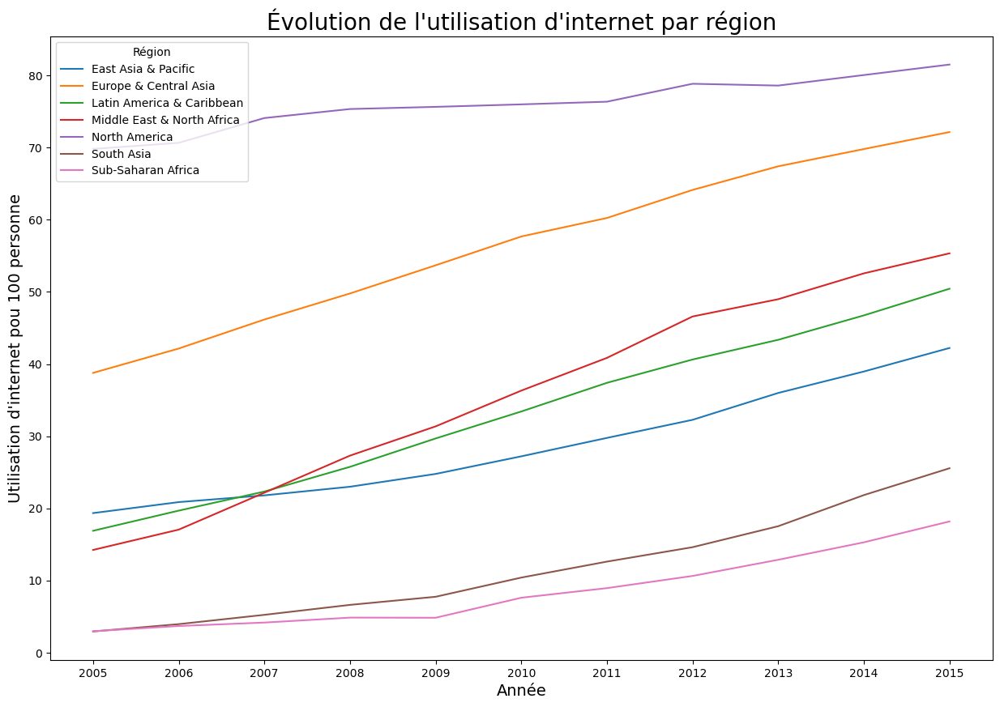

In [161]:
# Calculer la moyenne du PIB par habitant par année et par région
gdp_mean_per_year_region = data_etude_pivoter.groupby(["Year", "Region"])["Internet users (per 100 people)"].mean().reset_index()

plt.figure(figsize=(15, 10))
sns.lineplot(data=gdp_mean_per_year_region, x="Year", y="Internet users (per 100 people)", hue="Region")

plt.title("Évolution de l'utilisation d'internet par région", size=20)
plt.xlabel("Année", size=14)
plt.ylabel("Utilisation d'internet pou 100 personne", size=14)
plt.legend(title="Région")
plt.show()

### Evolution du PIB par habitant par region

2. Croissance du PIB par habitant (current US$)
Méthode d'analyse :

Tracer des graphiques de tendance pour le PIB par habitant au fil des ans pour différentes régions.
Analyser la corrélation entre l'augmentation du PIB par habitant et l'utilisation d'Internet.

C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


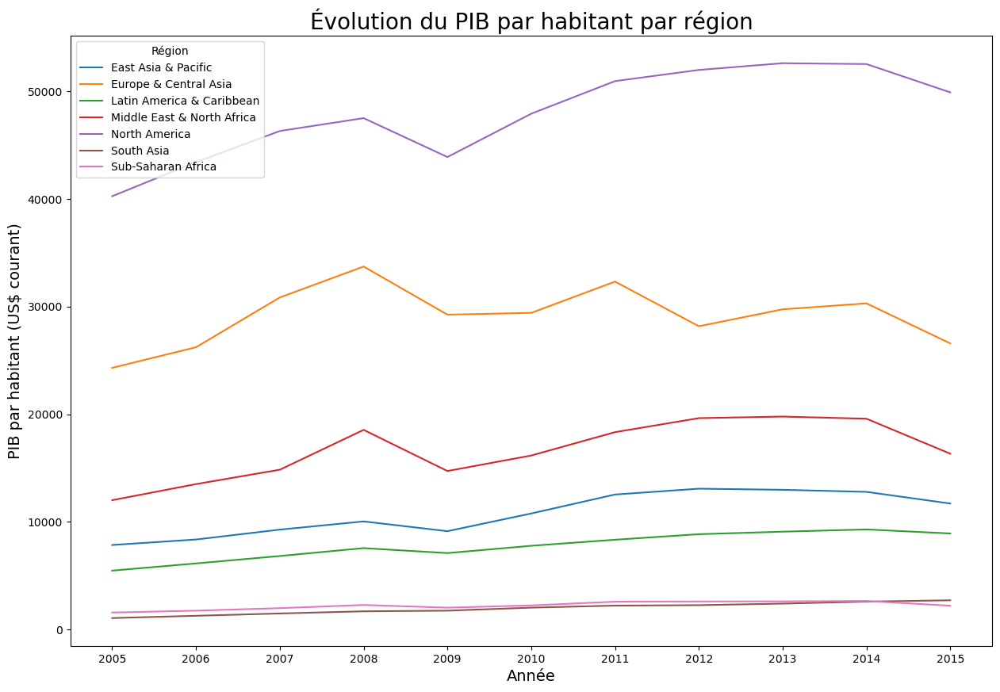

In [162]:
# Calculer la moyenne du PIB par habitant par année et par région
gdp_mean_per_year_region = data_etude_pivoter.groupby(["Year", "Region"])["GDP per capita (current US$)"].mean().reset_index()

plt.figure(figsize=(15, 10))
sns.lineplot(data=gdp_mean_per_year_region, x="Year", y="GDP per capita (current US$)", hue="Region")

plt.title("Évolution du PIB par habitant par région", size=20)
plt.xlabel("Année", size=14)
plt.ylabel("PIB par habitant (US$ courant)", size=14)
plt.legend(title="Région")
plt.show()

### Evolution des depense publique en education par region

Dépenses publiques en éducation (% du PIB)
Méthode d'analyse :

Analyser la tendance des dépenses publiques en éducation pour comprendre l'engagement des gouvernements.
Comparer les tendances entre différentes régions pour voir où les investissements dans l'éducation augmentent ou diminuent.

C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


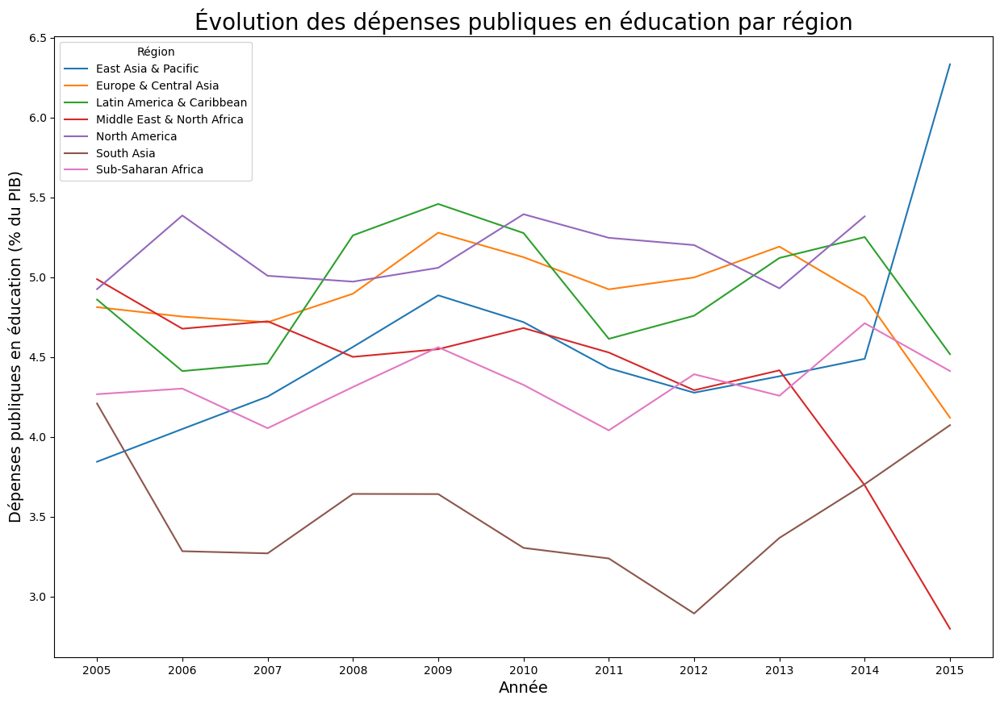

In [163]:
# Calculer la moyenne des dépenses publiques en éducation par année et par région
education_expenditure_mean_per_year_region = data_etude_pivoter.groupby(["Year", "Region"])["Government expenditure on education as % of GDP (%)"].mean().reset_index()

plt.figure(figsize=(15, 10))
sns.lineplot(data=education_expenditure_mean_per_year_region, x="Year", y="Government expenditure on education as % of GDP (%)", hue="Region")

plt.title("Évolution des dépenses publiques en éducation par région", size=20)
plt.xlabel("Année", size=14)
plt.ylabel("Dépenses publiques en éducation (% du PIB)", size=14)
plt.legend(title="Région")
plt.show()

### Evolution de la croissance demographique par region 

Croissance de la population
Méthode d'analyse :

Analyser la croissance démographique pour comprendre les dynamiques de la population.
Observer les tendances par région pour identifier les zones à forte croissance démographique.
Code pour visualiser la tendance :

C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


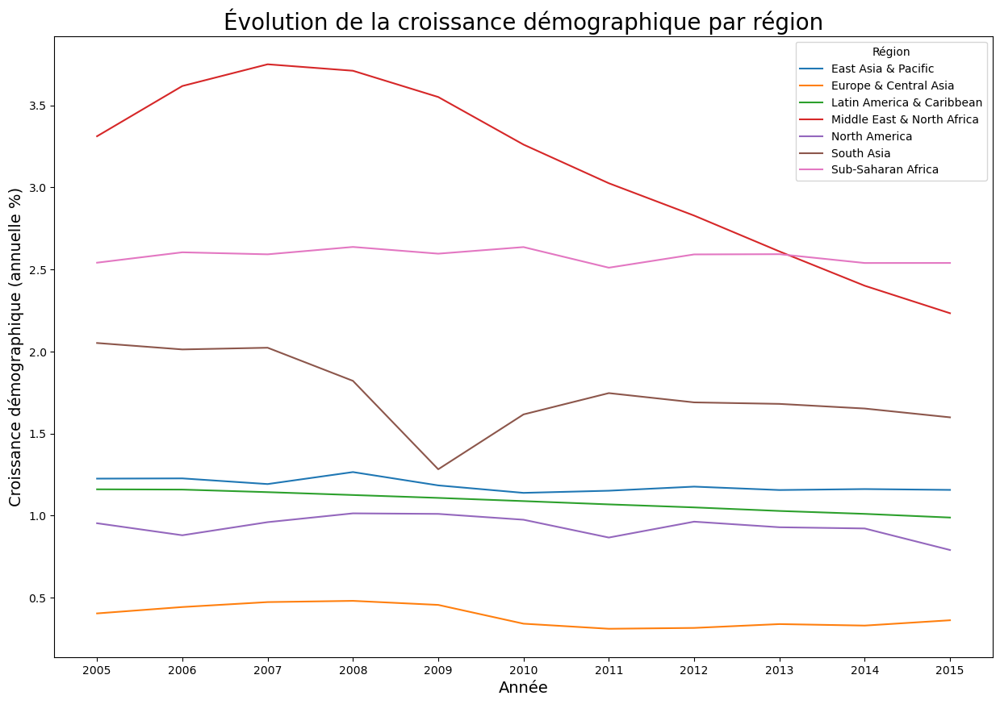

In [164]:
# Calculer la moyenne de la croissance démographique par année et par région
population_growth_mean_per_year_region = data_etude_pivoter.groupby(["Year", "Region"])["Population growth (annual %)"].mean().reset_index()

plt.figure(figsize=(15, 10))
sns.lineplot(data=population_growth_mean_per_year_region, x="Year", y="Population growth (annual %)", hue="Region")

plt.title("Évolution de la croissance démographique par région", size=20)
plt.xlabel("Année", size=14)
plt.ylabel("Croissance démographique (annuelle %)", size=14)
plt.legend(title="Région")
plt.show()

### Top des pays utilisant l'internet dans chaque region

In [225]:
# Sélectionner les colonnes pertinentes
filtered_data = data_etude_pivoter[['Country Name', 'Region', 'Year', 'Internet users (per 100 people)']]

# Groupby par région et par pays, et calculer la moyenne de l'utilisation d'Internet pour chaque pays dans chaque région
average_internet_usage_by_country_region = filtered_data.groupby(['Region', 'Country Name'])['Internet users (per 100 people)'].mean().reset_index()

# Initialiser un dictionnaire pour stocker les tableaux par région
region_tables = {}

# Parcourir chaque région unique dans le DataFrame
for region in average_internet_usage_by_country_region['Region'].unique():
    # Filtrer les données pour la région actuelle
    region_df = average_internet_usage_by_country_region[average_internet_usage_by_country_region['Region'] == region]
    # Sélectionner les cinq premiers de chaque région
    top_5 = region_df.nlargest(5, 'Internet users (per 100 people)')
    # Ajouter les données de la région au dictionnaire
    region_tables[region] = top_5

# Afficher les tableaux pour chaque région
for region, df in region_tables.items():
    display(f"Région : {region}")
    display(df)
    display("\n")

'Région : East Asia & Pacific'

,Region,Country Name,Internet users (per 100 people)
9,East Asia & Pacific,"Korea, Rep.",82.409507
6,East Asia & Pacific,Japan,78.950104
16,East Asia & Pacific,New Zealand,77.549779
0,East Asia & Pacific,Australia,75.533792
21,East Asia & Pacific,Singapore,70.985841


'\n'

'Région : Europe & Central Asia'

,Region,Country Name,Internet users (per 100 people)
49,Europe & Central Asia,Iceland,93.494208
64,Europe & Central Asia,Norway,91.255787
74,Europe & Central Asia,Sweden,89.951252
41,Europe & Central Asia,Denmark,89.456384
63,Europe & Central Asia,Netherlands,89.083381


'\n'

'Région : Latin America & Caribbean'

,Region,Country Name,Internet users (per 100 people)
85,Latin America & Caribbean,Barbados,65.270000
108,Latin America & Caribbean,St. Kitts and Nevis,56.309091
84,Latin America & Caribbean,"Bahamas, The",50.008018
113,Latin America & Caribbean,Trinidad and Tobago,48.335921
82,Latin America & Caribbean,Antigua and Barbuda,48.107273


'\n'

'Région : Middle East & North Africa'

,Region,Country Name,Internet users (per 100 people)
134,Middle East & North Africa,United Arab Emirates,70.899999
117,Middle East & North Africa,Bahrain,61.944466
130,Middle East & North Africa,Qatar,60.462039
127,Middle East & North Africa,Malta,59.543409
122,Middle East & North Africa,Israel,59.409747


'\n'

'Région : North America'

,Region,Country Name,Internet users (per 100 people)
136,North America,Canada,80.177273
137,North America,United States,71.997537


'\n'

'Région : South Asia'

,Region,Country Name,Internet users (per 100 people)
142,South Asia,Maldives,29.955274
140,South Asia,Bhutan,14.918675
145,South Asia,Sri Lanka,13.251250
141,South Asia,India,10.081240
144,South Asia,Pakistan,8.908394


'\n'

'Région : Sub-Saharan Africa'

,Region,Country Name,Internet users (per 100 people)
182,Sub-Saharan Africa,Seychelles,42.633956
174,Sub-Saharan Africa,Mauritius,30.015604
185,Sub-Saharan Africa,South Africa,26.180016
151,Sub-Saharan Africa,Cabo Verde,25.329804
180,Sub-Saharan Africa,Sao Tome and Principe,18.921417


'\n'

### top 5 population 15-24 ans dans chaque region

In [229]:
# Sélectionner les colonnes pertinentes
filtered_data = data_etude_pivoter[['Country Name', 'Region', 'Year', 'Population, ages 15-24, total']]

# Groupby par région et par pays, et calculer la moyenne de la population des 15-24 ans pour chaque pays dans chaque région
average_population_by_country_region = filtered_data.groupby(['Region', 'Country Name'])['Population, ages 15-24, total'].mean().reset_index()

# Initialiser un dictionnaire pour stocker les tableaux par région
region_tables = {}

# Parcourir chaque région unique dans le DataFrame
for region in average_population_by_country_region['Region'].unique():
    # Filtrer les données pour la région actuelle
    region_df = average_population_by_country_region[average_population_by_country_region['Region'] == region]
    # Sélectionner les cinq premiers de chaque région, triés par ordre décroissant de la population des 15-24 ans
    top_5 = region_df.nlargest(5, 'Population, ages 15-24, total', keep='all').sort_values(by='Population, ages 15-24, total', ascending=False)
    # Ajouter les données de la région au dictionnaire
    region_tables[region] = top_5

# Afficher les tableaux pour chaque région
for region, df in region_tables.items():
    display(f"Région : {region}")
    display(df)
    display("\n")

'Région : East Asia & Pacific'

,Region,Country Name,"Population, ages 15-24, total"
3,East Asia & Pacific,China,2.139920e+08
5,East Asia & Pacific,Indonesia,4.224988e+07
19,East Asia & Pacific,Philippines,1.818628e+07
28,East Asia & Pacific,Vietnam,1.788584e+07
6,East Asia & Pacific,Japan,1.285234e+07


'\n'

'Région : Europe & Central Asia'

,Region,Country Name,"Population, ages 15-24, total"
68,Europe & Central Asia,Russian Federation,1.994313e+07
77,Europe & Central Asia,Turkey,1.371290e+07
46,Europe & Central Asia,Germany,9.329035e+06
80,Europe & Central Asia,United Kingdom,7.935112e+06
44,Europe & Central Asia,France,7.655038e+06


'\n'

'Région : Latin America & Caribbean'

,Region,Country Name,"Population, ages 15-24, total"
88,Latin America & Caribbean,Brazil,3.407926e+07
103,Latin America & Caribbean,Mexico,1.975948e+07
90,Latin America & Caribbean,Colombia,8.761080e+06
83,Latin America & Caribbean,Argentina,6.789339e+06
107,Latin America & Caribbean,Peru,5.562232e+06


'\n'

'Région : Middle East & North Africa'

,Region,Country Name,"Population, ages 15-24, total"
120,Middle East & North Africa,"Iran, Islamic Rep.",1.622460e+07
119,Middle East & North Africa,"Egypt, Arab Rep.",1.535590e+07
116,Middle East & North Africa,Algeria,7.112625e+06
121,Middle East & North Africa,Iraq,6.411907e+06
128,Middle East & North Africa,Morocco,6.331142e+06


'\n'

'Région : North America'

,Region,Country Name,"Population, ages 15-24, total"
137,North America,United States,4.462605e+07
136,North America,Canada,4.436876e+06


'\n'

'Région : South Asia'

,Region,Country Name,"Population, ages 15-24, total"
141,South Asia,India,2.335402e+08
144,South Asia,Pakistan,3.811780e+07
139,South Asia,Bangladesh,3.309297e+07
143,South Asia,Nepal,6.176622e+06
138,South Asia,Afghanistan,6.086033e+06


'\n'

'Région : Sub-Saharan Africa'

,Region,Country Name,"Population, ages 15-24, total"
178,Sub-Saharan Africa,Nigeria,3.273706e+07
161,Sub-Saharan Africa,Ethiopia,1.843683e+07
156,Sub-Saharan Africa,"Congo, Dem. Rep.",1.345947e+07
185,Sub-Saharan Africa,South Africa,9.791719e+06
189,Sub-Saharan Africa,Tanzania,8.797845e+06


'\n'

### top 5 depense gournement dans l'education chaque region

In [232]:
# Sélectionner les colonnes pertinentes
filtered_data = data_etude_pivoter[['Country Name', 'Region', 'Year', 'Government expenditure on education as % of GDP (%)']]

# Groupby par région et par pays, et calculer la moyenne des dépenses gouvernementales en éducation en pourcentage du PIB pour chaque pays dans chaque région
average_gov_exp_by_country_region = filtered_data.groupby(['Region', 'Country Name'])['Government expenditure on education as % of GDP (%)'].mean().reset_index()

# Initialiser un dictionnaire pour stocker les tableaux par région
region_tables = {}

# Parcourir chaque région unique dans le DataFrame
for region in average_gov_exp_by_country_region['Region'].unique():
    # Filtrer les données pour la région actuelle
    region_df = average_gov_exp_by_country_region[average_gov_exp_by_country_region['Region'] == region]
    # Sélectionner les cinq premiers de chaque région, triés par ordre décroissant des dépenses gouvernementales en éducation en pourcentage du PIB
    top_5 = region_df.nlargest(5, 'Government expenditure on education as % of GDP (%)', keep='all').sort_values(by='Government expenditure on education as % of GDP (%)', ascending=False)
    # Ajouter les données de la région au dictionnaire
    region_tables[region] = top_5

# Afficher les tableaux pour chaque région
for region, df in region_tables.items():
    display(f"Région : {region}")
    display(df)
    display("\n")

'Région : East Asia & Pacific'

,Region,Country Name,Government expenditure on education as % of GDP (%)
13,East Asia & Pacific,"Micronesia, Fed. Sts.",12.467750
22,East Asia & Pacific,Solomon Islands,9.413570
24,East Asia & Pacific,Timor-Leste,8.474134
16,East Asia & Pacific,New Zealand,6.401531
27,East Asia & Pacific,Vanuatu,5.314170


'\n'

'Région : Europe & Central Asia'

,Region,Country Name,Government expenditure on education as % of GDP (%)
60,Europe & Central Asia,Moldova,8.243421
41,Europe & Central Asia,Denmark,8.056027
49,Europe & Central Asia,Iceland,7.376407
74,Europe & Central Asia,Sweden,6.857855
64,Europe & Central Asia,Norway,6.788152


'\n'

'Région : Latin America & Caribbean'

,Region,Country Name,Government expenditure on education as % of GDP (%)
92,Latin America & Caribbean,Cuba,11.917463
87,Latin America & Caribbean,Bolivia,6.982454
86,Latin America & Caribbean,Belize,6.207994
91,Latin America & Caribbean,Costa Rica,6.099055
102,Latin America & Caribbean,Jamaica,5.899429


'\n'

'Région : Middle East & North Africa'

,Region,Country Name,Government expenditure on education as % of GDP (%)
118,Middle East & North Africa,Djibouti,7.372280
127,Middle East & North Africa,Malta,6.465781
133,Middle East & North Africa,Tunisia,6.380217
122,Middle East & North Africa,Israel,5.642523
131,Middle East & North Africa,Saudi Arabia,5.489180


'\n'

'Région : North America'

,Region,Country Name,Government expenditure on education as % of GDP (%)
137,North America,United States,5.238131
136,North America,Canada,4.954318


'\n'

'Région : South Asia'

,Region,Country Name,Government expenditure on education as % of GDP (%)
140,South Asia,Bhutan,5.506915
142,South Asia,Maldives,4.793994
143,South Asia,Nepal,3.759442
141,South Asia,India,3.501614
138,South Asia,Afghanistan,3.334565


'\n'

'Région : Sub-Saharan Africa'

,Region,Country Name,Government expenditure on education as % of GDP (%)
168,Sub-Saharan Africa,Lesotho,11.570697
148,Sub-Saharan Africa,Botswana,9.721000
176,Sub-Saharan Africa,Namibia,6.957137
193,Sub-Saharan Africa,Zimbabwe,6.817810
188,Sub-Saharan Africa,Swaziland,6.646286


'\n'

### top 5 PIB par habitant de chaque region

In [233]:
# Sélectionner les colonnes pertinentes
filtered_data = data_etude_pivoter[['Country Name', 'Region', 'Year', 'GDP per capita, PPP (current international $)']]

# Groupby par région et par pays, et calculer la moyenne du PIB par habitant en PPP pour chaque pays dans chaque région
average_gdp_by_country_region = filtered_data.groupby(['Region', 'Country Name'])['GDP per capita, PPP (current international $)'].mean().reset_index()

# Initialiser un dictionnaire pour stocker les tableaux par région
region_tables = {}

# Parcourir chaque région unique dans le DataFrame
for region in average_gdp_by_country_region['Region'].unique():
    # Filtrer les données pour la région actuelle
    region_df = average_gdp_by_country_region[average_gdp_by_country_region['Region'] == region]
    # Sélectionner les cinq premiers de chaque région, triés par ordre décroissant du PIB par habitant en PPP
    top_5 = region_df.nlargest(5, 'GDP per capita, PPP (current international $)', keep='all').sort_values(by='GDP per capita, PPP (current international $)', ascending=False)
    # Ajouter les données de la région au dictionnaire
    region_tables[region] = top_5

# Afficher les tableaux pour chaque région
for region, df in region_tables.items():
    display(f"Région : {region}")
    display(df)
    display("\n")

'Région : East Asia & Pacific'

,Region,Country Name,"GDP per capita, PPP (current international $)"
1,East Asia & Pacific,Brunei Darussalam,79451.901659
21,East Asia & Pacific,Singapore,70909.129321
0,East Asia & Pacific,Australia,40319.447119
6,East Asia & Pacific,Japan,35832.512013
16,East Asia & Pacific,New Zealand,31970.523981


'\n'

'Région : Europe & Central Asia'

,Region,Country Name,"GDP per capita, PPP (current international $)"
58,Europe & Central Asia,Luxembourg,88166.134822
69,Europe & Central Asia,San Marino,71035.931629
64,Europe & Central Asia,Norway,59599.063347
75,Europe & Central Asia,Switzerland,53839.470734
50,Europe & Central Asia,Ireland,47451.725492


'\n'

'Région : Latin America & Caribbean'

,Region,Country Name,"GDP per capita, PPP (current international $)"
113,Latin America & Caribbean,Trinidad and Tobago,30309.709703
84,Latin America & Caribbean,"Bahamas, The",23012.638933
108,Latin America & Caribbean,St. Kitts and Nevis,22046.769892
82,Latin America & Caribbean,Antigua and Barbuda,20334.014436
89,Latin America & Caribbean,Chile,18872.216292


'\n'

'Région : Middle East & North Africa'

,Region,Country Name,"GDP per capita, PPP (current international $)"
130,Middle East & North Africa,Qatar,118949.466806
124,Middle East & North Africa,Kuwait,80605.567115
134,Middle East & North Africa,United Arab Emirates,67696.458346
131,Middle East & North Africa,Saudi Arabia,46759.803340
129,Middle East & North Africa,Oman,42071.652237


'\n'

'Région : North America'

,Region,Country Name,"GDP per capita, PPP (current international $)"
137,North America,United States,49788.978295
136,North America,Canada,40888.846541


'\n'

'Région : South Asia'

,Region,Country Name,"GDP per capita, PPP (current international $)"
142,South Asia,Maldives,12052.325183
145,South Asia,Sri Lanka,8705.523580
140,South Asia,Bhutan,6192.924690
141,South Asia,India,4358.812997
144,South Asia,Pakistan,4283.800066


'\n'

'Région : Sub-Saharan Africa'

,Region,Country Name,"GDP per capita, PPP (current international $)"
159,Sub-Saharan Africa,Equatorial Guinea,33385.832569
182,Sub-Saharan Africa,Seychelles,21613.977859
162,Sub-Saharan Africa,Gabon,15811.507266
174,Sub-Saharan Africa,Mauritius,15728.620938
148,Sub-Saharan Africa,Botswana,13647.165107


'\n'

### graphique heatmap d'utilisation d'internet des pays dans chaque region

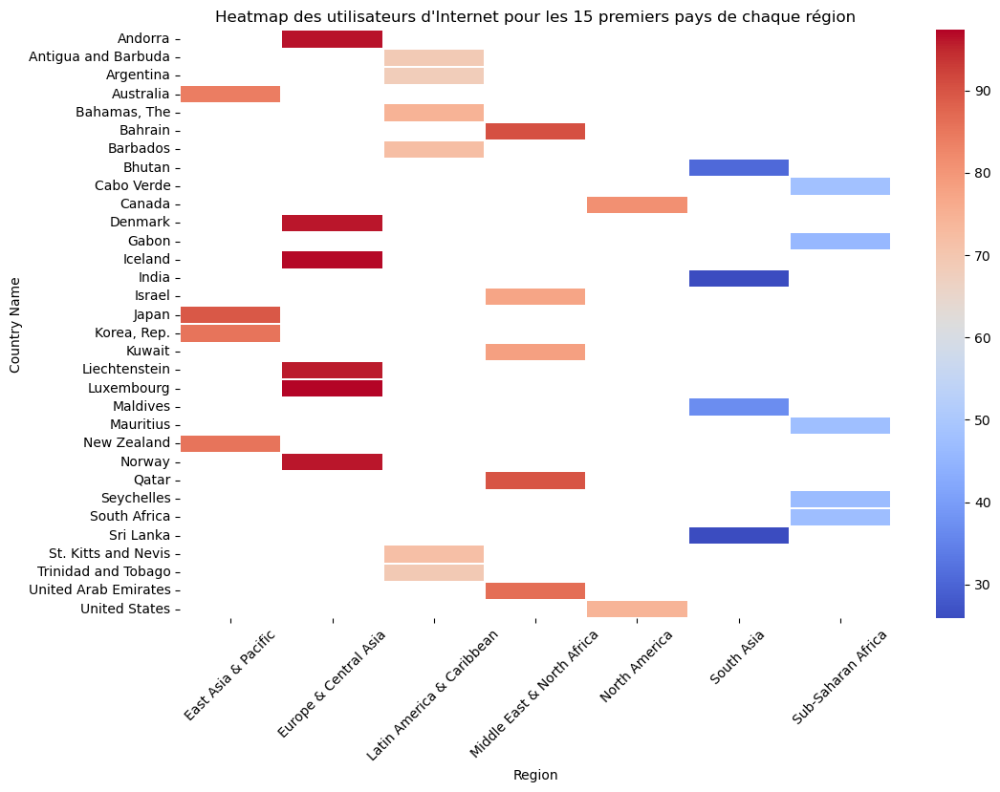

In [173]:
# Filtrer les 15 premiers pays pour chaque région
top_15_countries_per_region = data_etude_pivoter.groupby('Region').apply(lambda x: x.nlargest(15, 'Internet users (per 100 people)')).reset_index(drop=True)

# Créer une table pivot pour les données filtrées
pivot_table = top_15_countries_per_region.pivot_table(index='Country Name', columns='Region', values='Internet users (per 100 people)')

# Créer la figure
fig = plt.figure(figsize=(12, 8))

# Dessiner le heatmap
heatmap = sns.heatmap(pivot_table, cmap='coolwarm', linewidths=0.1)

# Ajuster les étiquettes de l'axe y
heatmap.set_yticklabels(heatmap.get_yticklabels(), rotation=0, fontsize=10)

# Ajuster les étiquettes de l'axe x
heatmap.set_xticklabels(heatmap.get_xticklabels(), rotation=45, fontsize=10)

# Ajouter un titre
plt.title('Heatmap des utilisateurs d\'Internet pour les 15 premiers pays de chaque région')

# Afficher le heatmap
plt.show()

### graphique heatmap depense du gouvernement des pays dans chaque region

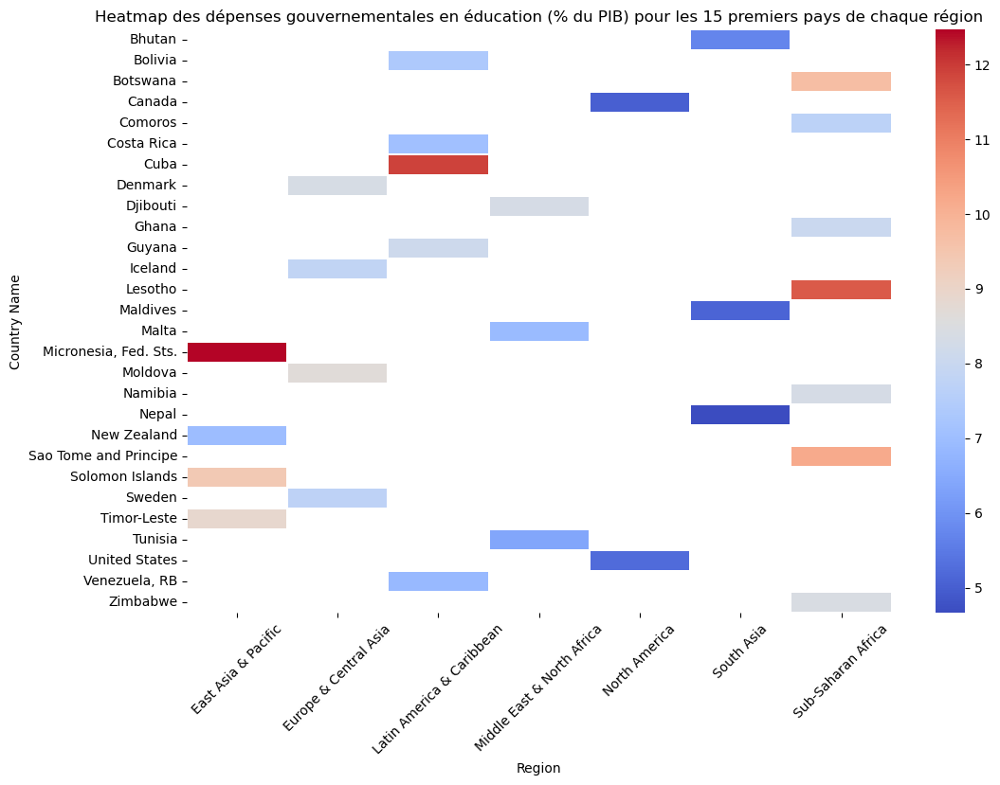

In [174]:
# Filtrer les 15 premiers pays pour chaque région en fonction du pourcentage des dépenses gouvernementales en éducation par rapport au PIB (%)
top_15_countries_per_region = data_etude_pivoter.groupby('Region').apply(lambda x: x.nlargest(15, 'Government expenditure on education as % of GDP (%)')).reset_index(drop=True)

# Créer une table pivot pour les données filtrées
pivot_table = top_15_countries_per_region.pivot_table(index='Country Name', columns='Region', values='Government expenditure on education as % of GDP (%)')

# Créer la figure
fig = plt.figure(figsize=(12, 8))

# Dessiner le heatmap
heatmap = sns.heatmap(pivot_table, cmap='coolwarm', linewidths=0.1)

# Ajuster les étiquettes de l'axe y
heatmap.set_yticklabels(heatmap.get_yticklabels(), rotation=0, fontsize=10)

# Ajuster les étiquettes de l'axe x
heatmap.set_xticklabels(heatmap.get_xticklabels(), rotation=45, fontsize=10)

# Ajouter un titre
plt.title('Heatmap des dépenses gouvernementales en éducation (% du PIB) pour les 15 premiers pays de chaque région')

# Afficher le heatmap
plt.show()

### Graphique heatmap population agé de 15-24 ans des pays dans chaque region

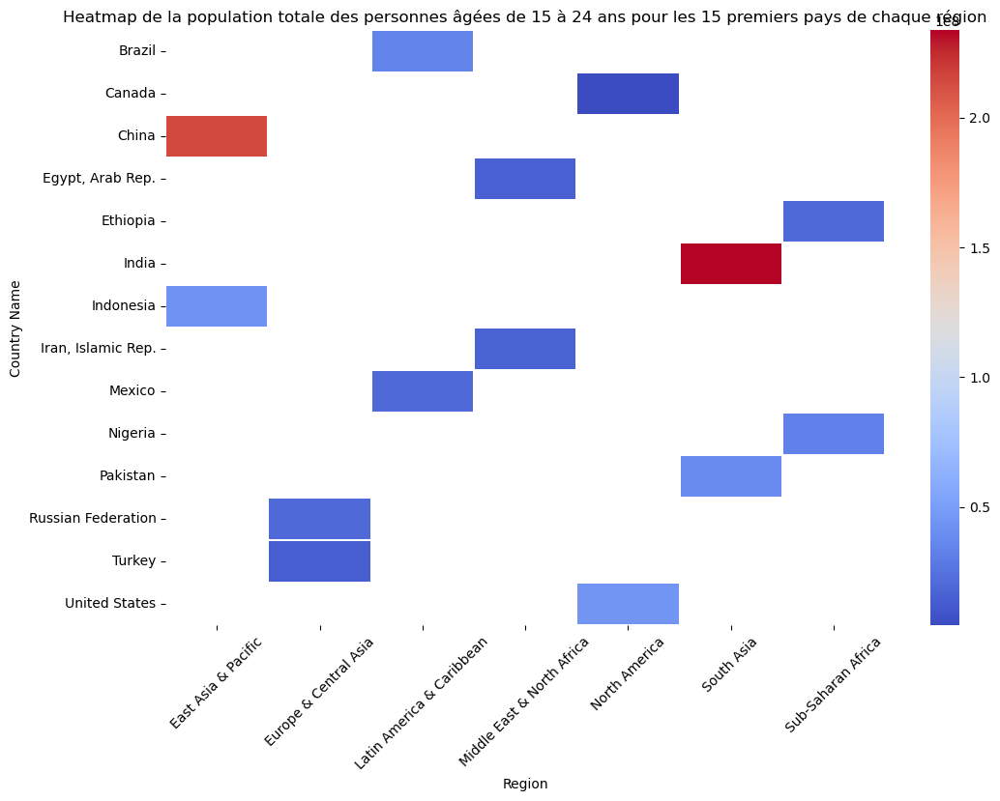

In [175]:
# Filtrer les 15 premiers pays pour chaque région en fonction de la population totale des personnes âgées de 15 à 24 ans
top_15_countries_per_region = data_etude_pivoter.groupby('Region').apply(lambda x: x.nlargest(15, 'Population, ages 15-24, total')).reset_index(drop=True)

# Créer une table pivot pour les données filtrées
pivot_table = top_15_countries_per_region.pivot_table(index='Country Name', columns='Region', values='Population, ages 15-24, total')

# Créer la figure
fig = plt.figure(figsize=(12, 8))

# Dessiner le heatmap
heatmap = sns.heatmap(pivot_table, cmap='coolwarm', linewidths=0.1)

# Ajuster les étiquettes de l'axe y
heatmap.set_yticklabels(heatmap.get_yticklabels(), rotation=0, fontsize=10)

# Ajuster les étiquettes de l'axe x
heatmap.set_xticklabels(heatmap.get_xticklabels(), rotation=45, fontsize=10)

# Ajouter un titre
plt.title('Heatmap de la population totale des personnes âgées de 15 à 24 ans pour les 15 premiers pays de chaque région')

# Afficher le heatmap
plt.show()

## Reprensentation pour les pays

### Trie des population, ages 15-24 

In [176]:
# Filtrer les pays avec une population âgée de 15-24 ans supérieure à 1 322 803
population_15_24_sup = data_etude_pivoter[data_etude_pivoter["Population, ages 15-24, total"] > 1.322803e+06]

# Trier les résultats en ordre décroissant par population des 15-24 ans
population_15_24_sup_decroissant = population_15_24_sup.sort_values(by="Population, ages 15-24, total", ascending=False)

# Afficher les résultats triés
display(population_15_24_sup_decroissant)

Indicator Name,Country Code,Indicator Code,Country Name,Year,Income Group,Region,Topic,"Adjusted net enrolment rate, lower secondary, both sexes (%)",Annual statutory teacher salaries in public institutions in USD. Lower Secondary. 10 years of experience,GDP per capita (current US$),"GDP per capita, PPP (current international $)",Government expenditure on education as % of GDP (%),Internet users (per 100 people),Population growth (annual %),"Population of the official entrance age to secondary general education, male (number)","Population, ages 15-24, total","Population, total"
6839,IND,SP.POP.1524.TO.UN,India,2015,Lower middle income,South Asia,Population,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,244120201.0,NaN
6838,IND,SP.POP.1524.TO.UN,India,2014,Lower middle income,South Asia,Population,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,243002731.0,NaN
6837,IND,SP.POP.1524.TO.UN,India,2013,Lower middle income,South Asia,Population,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,241535030.0,NaN
6836,IND,SP.POP.1524.TO.UN,India,2012,Lower middle income,South Asia,Population,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,239713636.0,NaN
6835,IND,SP.POP.1524.TO.UN,India,2011,Lower middle income,South Asia,Population,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,237548472.0,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12543,PRY,SP.POP.1524.TO.UN,Paraguay,2012,Lower middle income,Latin America & Caribbean,Population,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1333409.0,NaN
7585,JOR,SP.POP.1524.TO.UN,Jordan,2015,Upper middle income,Middle East & North Africa,Population,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1331040.0,NaN
12451,PRT,SP.POP.1524.TO.UN,Portugal,2005,High income: OECD,Europe & Central Asia,Population,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1327017.0,NaN
3818,CZE,SP.POP.1524.TO.UN,Czech Republic,2006,High income: OECD,Europe & Central Asia,Population,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1325533.0,NaN


### Graphique lineaire des top 5 pays population, ages 15-24, total

C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


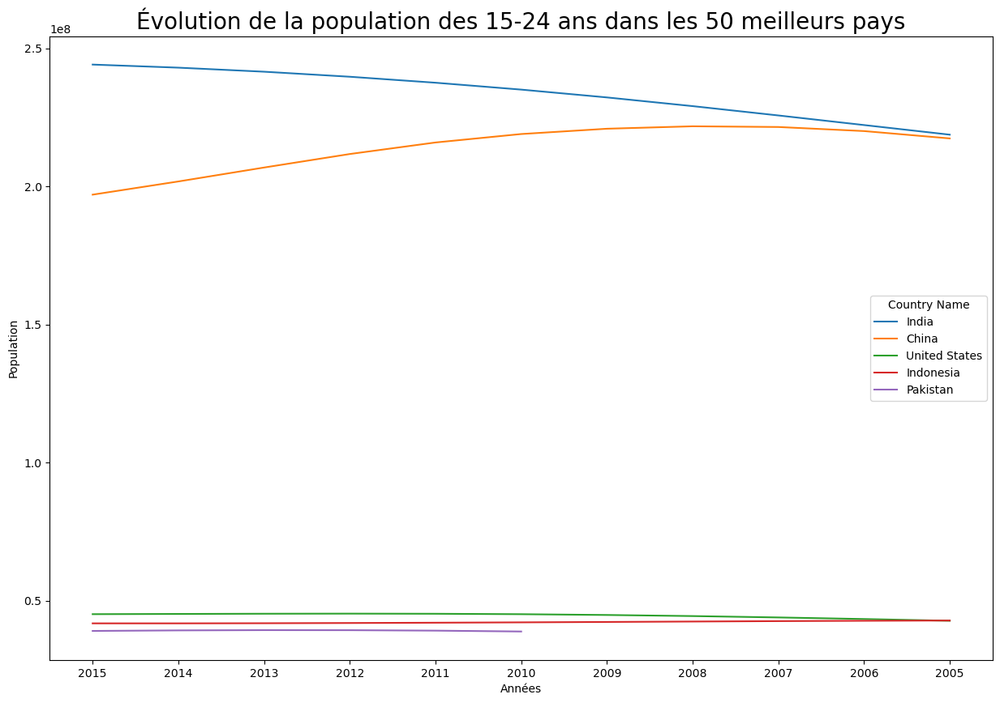

In [177]:
# Trier les données par ordre décroissant selon la population des 15-24 ans
data_etude_pivoter_sorted = data_etude_pivoter.sort_values(by="Population, ages 15-24, total", ascending=False)

# Sélectionner les 50 premiers pays avec la population des 15-24 ans la plus élevée
top_20_countries = data_etude_pivoter_sorted.head(50)

plt.figure(figsize=(15, 10))
plot = sns.lineplot(x="Year",
                    y="Population, ages 15-24, total",
                    hue="Country Name",
                    data=top_20_countries)

plt.title("Évolution de la population des 15-24 ans dans les 50 meilleurs pays", size=20)
plot.set(xlabel="Années", ylabel="Population")

# Sauvegarder le graphique
plt.savefig("evolution_population_15_24_top_20.png")
plt.show()

###  Graphique en bar des top 5 pays population, ages 15-24, total

In [178]:
import plotly.express as px

# Filtrer et trier les données
data = data_etude_pivoter[["Country Name", "Population, ages 15-24, total"]]
data_sorted = data.sort_values(by="Population, ages 15-24, total", ascending=False).head(50)

# Créer le graphique à barres
fig = px.bar(data_sorted, 
             x="Population, ages 15-24, total", 
             y="Country Name", 
             orientation='h', 
             title="Population des 20 pays avec les plus grandes populations âgées de 15-24 ans",  # Utilisation de guillemets doubles pour éviter le conflit
             labels={"Population, ages 15-24, total": "Population âgée de 15-24 ans", "Country Name": "Pays"})

# Mettre à jour la disposition pour ordonner les pays de manière ascendante
fig.update_layout(yaxis={'categoryorder':'total ascending'}, height=700)

# Afficher le graphique
fig.show()

### Trie des 5 meilleurs scor en utilisation d'internet

In [179]:
Internet_sup_15 = data_etude_pivoter[data_etude_pivoter["Internet users (per 100 people)"]>80]
Internet_sup_15
# Trier les résultats en ordre décroissant "
Internet_sup_15_decroissant = Internet_sup_15.sort_values(by="Internet users (per 100 people)", ascending=False)
Internet_sup_15_decroissant

Indicator Name,Country Code,Indicator Code,Country Name,Year,Income Group,Region,Topic,"Adjusted net enrolment rate, lower secondary, both sexes (%)",Annual statutory teacher salaries in public institutions in USD. Lower Secondary. 10 years of experience,GDP per capita (current US$),"GDP per capita, PPP (current international $)",Government expenditure on education as % of GDP (%),Internet users (per 100 people),Population growth (annual %),"Population of the official entrance age to secondary general education, male (number)","Population, ages 15-24, total","Population, total"
7156,ISL,IT.NET.USER.P2,Iceland,2015,High income: OECD,Europe & Central Asia,Infrastructure: Communications,NaN,NaN,NaN,NaN,NaN,98.200000,NaN,NaN,NaN,NaN
7155,ISL,IT.NET.USER.P2,Iceland,2014,High income: OECD,Europe & Central Asia,Infrastructure: Communications,NaN,NaN,NaN,NaN,NaN,98.160000,NaN,NaN,NaN,NaN
9206,LUX,IT.NET.USER.P2,Luxembourg,2015,High income: OECD,Europe & Central Asia,Infrastructure: Communications,NaN,NaN,NaN,NaN,NaN,97.334100,NaN,NaN,NaN,NaN
262,AND,IT.NET.USER.P2,Andorra,2015,High income: nonOECD,Europe & Central Asia,Infrastructure: Communications,NaN,NaN,NaN,NaN,NaN,96.910000,NaN,NaN,NaN,NaN
11367,NOR,IT.NET.USER.P2,Norway,2015,High income: OECD,Europe & Central Asia,Infrastructure: Communications,NaN,NaN,NaN,NaN,NaN,96.810300,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2521,CAN,IT.NET.USER.P2,Canada,2010,High income: OECD,North America,Infrastructure: Communications,NaN,NaN,NaN,NaN,NaN,80.300000,NaN,NaN,NaN,NaN
2520,CAN,IT.NET.USER.P2,Canada,2009,High income: OECD,North America,Infrastructure: Communications,NaN,NaN,NaN,NaN,NaN,80.300000,NaN,NaN,NaN,NaN
6884,IRL,IT.NET.USER.P2,Ireland,2015,High income: OECD,Europe & Central Asia,Infrastructure: Communications,NaN,NaN,NaN,NaN,NaN,80.122400,NaN,NaN,NaN,NaN
739,AUT,IT.NET.USER.P2,Austria,2012,High income: OECD,Europe & Central Asia,Infrastructure: Communications,NaN,NaN,NaN,NaN,NaN,80.029994,NaN,NaN,NaN,NaN


### Graphique des top 5 en internet

C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.



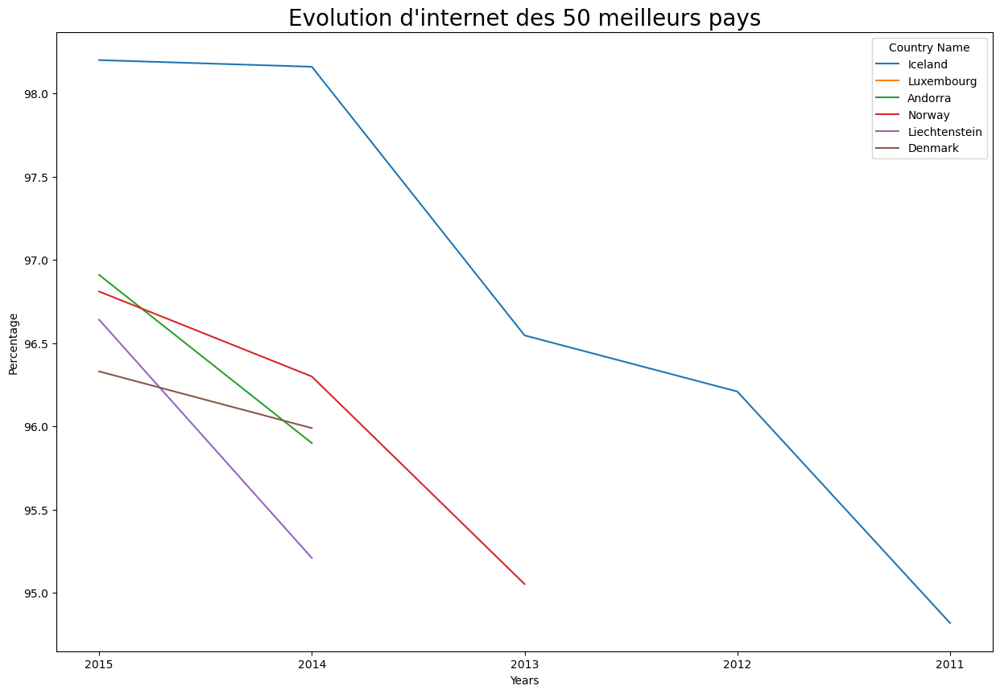

In [180]:
# Trier les données par ordre décroissant selon le taux de pénétration d'Internet
data_etude_pivoter_sorted = data_etude_pivoter.sort_values(by="Internet users (per 100 people)", ascending=False)

# Sélectionner les 50 premiers pays avec le taux de pénétration le plus élevé
top_20_countries = data_etude_pivoter_sorted.head(15)

plt.figure(figsize=(15, 10))
plot = sns.lineplot(x="Year",
                    y="Internet users (per 100 people)",
                    hue="Country Name",
                    data=top_20_countries)

plt.title("Evolution d'internet des 50 meilleurs pays", size=20)
plot.set(xlabel="Years", ylabel="Percentage")

# Sauvegarder le graphique
plt.savefig("internet_penetration_evolution_top_20.png")
plt.show()

### Graphique en bar pour le top 14 utilisant l'internet

In [181]:
import plotly.express as px

# Filtrer et trier les données
data = data_etude_pivoter[["Country Name", "Internet users (per 100 people)"]].sort_values("Internet users (per 100 people)", ascending=False).head(50)

# Créer le graphique à barres
fig = px.bar(data, 
             x="Internet users (per 100 people)", 
             y="Country Name", 
             orientation='h', 
             title="Utilisation d'internet des pays",  # Utilisation de guillemets doubles pour éviter le conflit
             labels={"Internet users (per 100 people)": "Taux d'internet (%)", "Country Name": "Pays"})

# Mettre à jour la disposition pour ordonner les pays de manière ascendante
fig.update_layout(yaxis={'categoryorder':'total ascending'}, height=700)

# Afficher le graphique
fig.show()

### Top des pays Government expenditure on education as % of GDP (%)

In [182]:
gouvernement_on_education = data_etude_pivoter[data_etude_pivoter["Government expenditure on education as % of GDP (%)"]>5]
gouvernement_on_education 
# Trier les résultats en ordre décroissant "
gouvernement_on_education_decroissant = gouvernement_on_education.sort_values(by="Government expenditure on education as % of GDP (%)", ascending=False)
gouvernement_on_education_decroissant

Indicator Name,Country Code,Indicator Code,Country Name,Year,Income Group,Region,Topic,"Adjusted net enrolment rate, lower secondary, both sexes (%)",Annual statutory teacher salaries in public institutions in USD. Lower Secondary. 10 years of experience,GDP per capita (current US$),"GDP per capita, PPP (current international $)",Government expenditure on education as % of GDP (%),Internet users (per 100 people),Population growth (annual %),"Population of the official entrance age to secondary general education, male (number)","Population, ages 15-24, total","Population, total"
3616,CUB,SE.XPD.TOTL.GD.ZS,Cuba,2008,Upper middle income,Latin America & Caribbean,Expenditures,NaN,NaN,NaN,NaN,14.05908,NaN,NaN,NaN,NaN,NaN
3617,CUB,SE.XPD.TOTL.GD.ZS,Cuba,2009,Upper middle income,Latin America & Caribbean,Expenditures,NaN,NaN,NaN,NaN,13.12516,NaN,NaN,NaN,NaN,NaN
3618,CUB,SE.XPD.TOTL.GD.ZS,Cuba,2010,Upper middle income,Latin America & Caribbean,Expenditures,NaN,NaN,NaN,NaN,12.83727,NaN,NaN,NaN,NaN,NaN
5245,FSM,SE.XPD.TOTL.GD.ZS,"Micronesia, Fed. Sts.",2015,Lower middle income,East Asia & Pacific,Expenditures,NaN,NaN,NaN,NaN,12.46775,NaN,NaN,NaN,NaN,NaN
9043,LSO,SE.XPD.TOTL.GD.ZS,Lesotho,2005,Lower middle income,Sub-Saharan Africa,Expenditures,NaN,NaN,NaN,NaN,12.07967,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12893,RWA,SE.XPD.TOTL.GD.ZS,Rwanda,2013,Low income,Sub-Saharan Africa,Expenditures,NaN,NaN,NaN,NaN,5.02228,NaN,NaN,NaN,NaN,NaN
4766,EST,SE.XPD.TOTL.GD.ZS,Estonia,2011,High income: OECD,Europe & Central Asia,Expenditures,NaN,NaN,NaN,NaN,5.01738,NaN,NaN,NaN,NaN,NaN
5405,GBR,SE.XPD.TOTL.GD.ZS,United Kingdom,2005,High income: OECD,Europe & Central Asia,Expenditures,NaN,NaN,NaN,NaN,5.01561,NaN,NaN,NaN,NaN,NaN
16240,VUT,SE.XPD.TOTL.GD.ZS,Vanuatu,2009,Lower middle income,East Asia & Pacific,Expenditures,NaN,NaN,NaN,NaN,5.01295,NaN,NaN,NaN,NaN,NaN


### graphique en bar des depenses des gouvernements dans le le secteur de l'education

In [183]:
import plotly.express as px

# Filtrer et trier les données
data = data_etude_pivoter[["Country Name", "Government expenditure on education as % of GDP (%)"]].sort_values(by="Government expenditure on education as % of GDP (%)", ascending=False).head(10)

# Créer le graphique à barres
fig = px.bar(data, 
             x="Government expenditure on education as % of GDP (%)", 
             y="Country Name", 
             orientation='h', 
             title="Dépenses des gouvernements dans le secteur de l'éducation",  # Utilisation de guillemets doubles pour éviter le conflit
             labels={"Government expenditure on education as % of GDP (%)": "Dépenses en éducation (% du PIB)", "Country Name": "Pays"})

# Mettre à jour la disposition pour ordonner les pays de manière ascendante
fig.update_layout(yaxis={'categoryorder':'total ascending'}, height=700)

# Afficher le graphique
fig.show()

### Top des pays par GDP per capita, PPP (current international $)

In [184]:
pib = data_etude_pivoter[data_etude_pivoter["GDP per capita, PPP (current international $)"]>22618.227204]
pib 
# Trier les résultats en ordre décroissant "
pib_decroissant = pib.sort_values(by="GDP per capita, PPP (current international $)", ascending=False)
pib_decroissant

Indicator Name,Country Code,Indicator Code,Country Name,Year,Income Group,Region,Topic,"Adjusted net enrolment rate, lower secondary, both sexes (%)",Annual statutory teacher salaries in public institutions in USD. Lower Secondary. 10 years of experience,GDP per capita (current US$),"GDP per capita, PPP (current international $)",Government expenditure on education as % of GDP (%),Internet users (per 100 people),Population growth (annual %),"Population of the official entrance age to secondary general education, male (number)","Population, ages 15-24, total","Population, total"
12616,QAT,NY.GDP.PCAP.PP.CD,Qatar,2011,High income: nonOECD,Middle East & North Africa,Economic Policy & Debt: Purchasing power parity,NaN,NaN,NaN,129349.916352,NaN,NaN,NaN,NaN,NaN,NaN
12620,QAT,NY.GDP.PCAP.PP.CD,Qatar,2015,High income: nonOECD,Middle East & North Africa,Economic Policy & Debt: Purchasing power parity,NaN,NaN,NaN,127764.462337,NaN,NaN,NaN,NaN,NaN,NaN
12617,QAT,NY.GDP.PCAP.PP.CD,Qatar,2012,High income: nonOECD,Middle East & North Africa,Economic Policy & Debt: Purchasing power parity,NaN,NaN,NaN,127610.208824,NaN,NaN,NaN,NaN,NaN,NaN
12619,QAT,NY.GDP.PCAP.PP.CD,Qatar,2014,High income: nonOECD,Middle East & North Africa,Economic Policy & Debt: Purchasing power parity,NaN,NaN,NaN,127313.494355,NaN,NaN,NaN,NaN,NaN,NaN
12618,QAT,NY.GDP.PCAP.PP.CD,Qatar,2013,High income: nonOECD,Middle East & North Africa,Economic Policy & Debt: Purchasing power parity,NaN,NaN,NaN,126913.035408,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6616,HUN,NY.GDP.PCAP.PP.CD,Hungary,2011,Upper middle income,Europe & Central Asia,Economic Policy & Debt: Purchasing power parity,NaN,NaN,NaN,22841.210338,NaN,NaN,NaN,NaN,NaN,NaN
9320,LVA,NY.GDP.PCAP.PP.CD,Latvia,2013,High income: nonOECD,Europe & Central Asia,Economic Policy & Debt: Purchasing power parity,NaN,NaN,NaN,22741.666949,NaN,NaN,NaN,NaN,NaN,NaN
12423,PRT,NY.GDP.PCAP.PP.CD,Portugal,2005,High income: OECD,Europe & Central Asia,Economic Policy & Debt: Purchasing power parity,NaN,NaN,NaN,22739.589660,NaN,NaN,NaN,NaN,NaN,NaN
1576,BHS,NY.GDP.PCAP.PP.CD,"Bahamas, The",2011,High income: nonOECD,Latin America & Caribbean,Economic Policy & Debt: Purchasing power parity,NaN,NaN,NaN,22674.727816,NaN,NaN,NaN,NaN,NaN,NaN


### Graphique lineaire du PIB par habitant

C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.



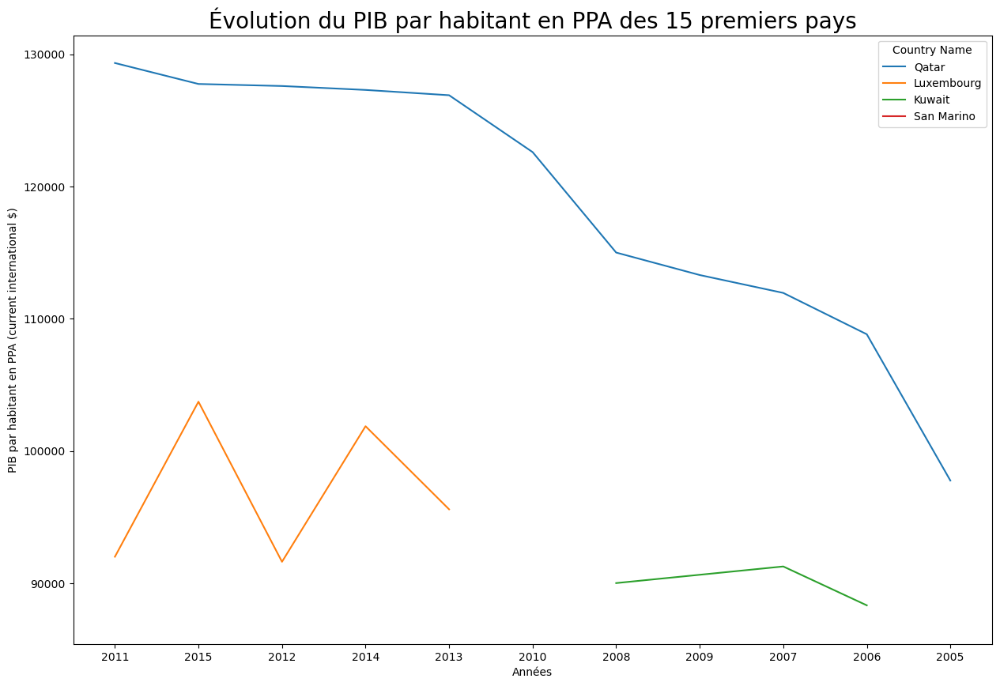

In [185]:
# Trier les données par ordre décroissant selon le PIB par habitant en PPA (current international $)
pib_sort = data_etude_pivoter.sort_values(by="GDP per capita, PPP (current international $)", ascending=False).head(20)

# Sélectionner les 15 premiers pays avec le PIB par habitant en PPA le plus élevé
top_15_countries = pib_sort.head(20)

plt.figure(figsize=(15, 10))
plot = sns.lineplot(x="Year",
                    y="GDP per capita, PPP (current international $)",
                    hue="Country Name",
                    data=top_15_countries)

plt.title("Évolution du PIB par habitant en PPA des 15 premiers pays", size=20)
plot.set(xlabel="Années", ylabel="PIB par habitant en PPA (current international $)")

# Sauvegarder le graphique
plt.savefig("gdp_per_capita_evolution_top_15.png")
plt.show()

### Graphique en bar du PIB par habitant

In [186]:
import plotly.express as px

# Filtrer et trier les données
data = data_etude_pivoter[["Country Name", "GDP per capita, PPP (current international $)"]].sort_values(by="GDP per capita, PPP (current international $)", ascending=False).head(50)

# Créer le graphique à barres
fig = px.bar(data, 
             x="GDP per capita, PPP (current international $)", 
             y="Country Name", 
             orientation='h', 
             title="PIB par habitant des pays",  # Utilisation de guillemets doubles pour éviter le conflit
             labels={"GDP per capita, PPP (current international $)": "PIB par habitant (PPA, $ international courant)", "Country Name": "Pays"})

# Mettre à jour la disposition pour ordonner les pays de manière ascendante
fig.update_layout(yaxis={'categoryorder':'total ascending'}, height=700)

# Afficher le graphique
fig.show()

### Carte modiale du PIB par habitant

In [187]:
fig = px.choropleth(data_etude_pivoter, 
                    locations="Country Name", 
                    locationmode='country names', 
                    color="GDP per capita, PPP (current international $)", 
                    hover_name="Country Name", 
                    title="Carte choroplèthe du PIB par habitant",
                    color_continuous_scale=px.colors.sequential.Plasma)

fig.update_layout(
    width=1000,  # largeur en pixels
    height=600,  # hauteur en pixels
)

fig.show()

### Top croissance demographique 

In [188]:
demo = data_etude_pivoter[data_etude_pivoter["Population growth (annual %)"]>2.333768]
demo 
# Trier les résultats en ordre décroissant "
demo_decroissant = demo.sort_values(by="Population growth (annual %)", ascending=False)
demo_decroissant

Indicator Name,Country Code,Indicator Code,Country Name,Year,Income Group,Region,Topic,"Adjusted net enrolment rate, lower secondary, both sexes (%)",Annual statutory teacher salaries in public institutions in USD. Lower Secondary. 10 years of experience,GDP per capita (current US$),"GDP per capita, PPP (current international $)",Government expenditure on education as % of GDP (%),Internet users (per 100 people),Population growth (annual %),"Population of the official entrance age to secondary general education, male (number)","Population, ages 15-24, total","Population, total"
12644,QAT,SP.POP.GROW,Qatar,2007,High income: nonOECD,Middle East & North Africa,Health: Population: Dynamics,NaN,NaN,NaN,NaN,NaN,NaN,16.331638,NaN,NaN,NaN
12643,QAT,SP.POP.GROW,Qatar,2006,High income: nonOECD,Middle East & North Africa,Health: Population: Dynamics,NaN,NaN,NaN,NaN,NaN,NaN,15.551264,NaN,NaN,NaN
12645,QAT,SP.POP.GROW,Qatar,2008,High income: nonOECD,Middle East & North Africa,Health: Population: Dynamics,NaN,NaN,NaN,NaN,NaN,NaN,15.518540,NaN,NaN,NaN
354,ARE,SP.POP.GROW,United Arab Emirates,2007,High income: nonOECD,Middle East & North Africa,Health: Population: Dynamics,NaN,NaN,NaN,NaN,NaN,NaN,14.236792,NaN,NaN,NaN
12646,QAT,SP.POP.GROW,Qatar,2009,High income: nonOECD,Middle East & North Africa,Health: Population: Dynamics,NaN,NaN,NaN,NaN,NaN,NaN,13.539421,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16723,ZWE,SP.POP.GROW,Zimbabwe,2015,Low income,Sub-Saharan Africa,Health: Population: Dynamics,NaN,NaN,NaN,NaN,NaN,NaN,2.345643,NaN,NaN,NaN
16722,ZWE,SP.POP.GROW,Zimbabwe,2014,Low income,Sub-Saharan Africa,Health: Population: Dynamics,NaN,NaN,NaN,NaN,NaN,NaN,2.344799,NaN,NaN,NaN
13410,SLE,SP.POP.GROW,Sierra Leone,2011,Low income,Sub-Saharan Africa,Health: Population: Dynamics,NaN,NaN,NaN,NaN,NaN,NaN,2.340844,NaN,NaN,NaN
13830,STP,SP.POP.GROW,Sao Tome and Principe,2007,Lower middle income,Sub-Saharan Africa,Health: Population: Dynamics,NaN,NaN,NaN,NaN,NaN,NaN,2.340467,NaN,NaN,NaN


### Graphique croissance démographique (annuelle %)

C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.



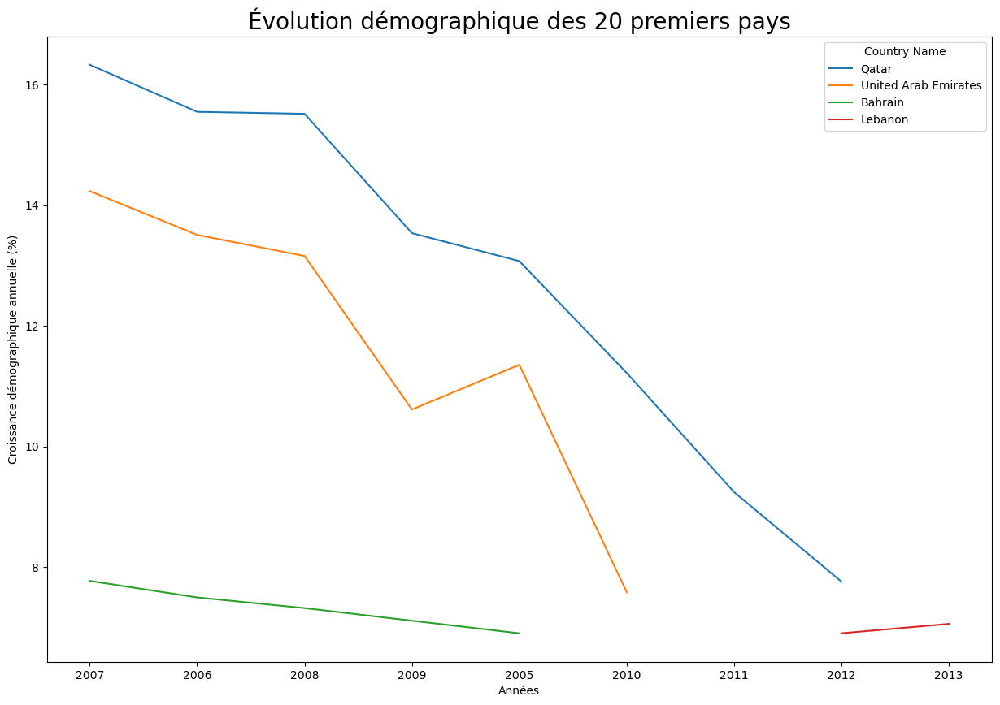

In [189]:
# Trier les données par ordre décroissant selon la croissance démographique annuelle (%)
pib_sort = data_etude_pivoter.sort_values(by="Population growth (annual %)", ascending=False)

# Sélectionner les 20 premiers pays avec la croissance démographique annuelle la plus élevée
top_20_countries = pib_sort.head(20)

plt.figure(figsize=(15, 10))
plot = sns.lineplot(x="Year",
                    y="Population growth (annual %)",
                    hue="Country Name",
                    data=top_20_countries)

plt.title("Évolution démographique des 20 premiers pays", size=20)
plot.set(xlabel="Années", ylabel="Croissance démographique annuelle (%)")

# Sauvegarder le graphique
plt.savefig("population_growth_evolution_top_20.png")
plt.show()

### Graphique en bar despays en croissance demographique

In [190]:
import plotly.express as px

# Filtrer et trier les données
data = data_etude_pivoter[["Country Name", "Population growth (annual %)"]].sort_values(by="Population growth (annual %)", ascending=False).head(50)

# Créer le graphique à barres
fig = px.bar(data, 
             x="Population growth (annual %)", 
             y="Country Name", 
             orientation='h', 
             title="Croissance démographique des pays",  # Utilisation de guillemets doubles pour éviter le conflit
             labels={"Population growth (annual %)": "Croissance démographique annuelle (%)", "Country Name": "Pays"})

# Mettre à jour la disposition pour ordonner les pays de manière ascendante
fig.update_layout(yaxis={'categoryorder':'total ascending'}, height=700)

# Afficher le graphique
fig.show()

# Graphique Pays/Region

### Graphique en bar du nombre de pays par Region

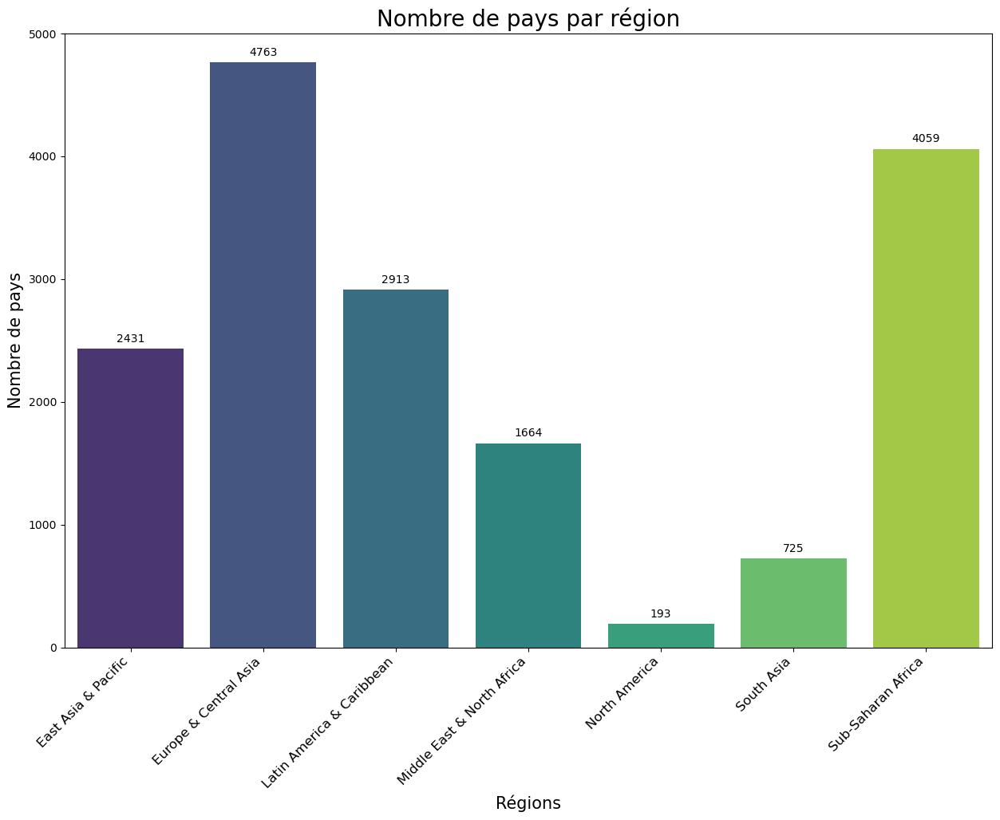

In [238]:
# Calculer le nombre de pays par région
df_countries_by_region = data_etude_pivoter[["Country Name", "Region"]].groupby("Region").count().reset_index()

# Renommer les colonnes pour plus de clarté
df_countries_by_region.columns = ["Région", "Nombre de Pays"]

# Créer le graphique à barres
plt.figure(figsize=(15, 10))
plot = sns.barplot(x="Région", y="Nombre de Pays", data=df_countries_by_region, palette="viridis")

# Ajouter les annotations pour chaque barre
for p in plot.patches:
    plot.annotate(f'{p.get_height():.0f}', (p.get_x() + p.get_width() / 2., p.get_height()),
                  ha='center', va='center', xytext=(0, 9), textcoords='offset points')

# Définir les titres et les labels
plt.title("Nombre de pays par région", fontsize=20)
plt.xlabel("Régions", fontsize=15)
plt.ylabel("Nombre de pays", fontsize=15)

# Ajuster l'angle des étiquettes de l'axe des x pour une meilleure lisibilité
plot.set_xticklabels(plot.get_xticklabels(), rotation=45, ha='right', fontsize=12)

# Afficher le graphique
plt.show()

#### Graphique en du nombre de pays par type de revenu

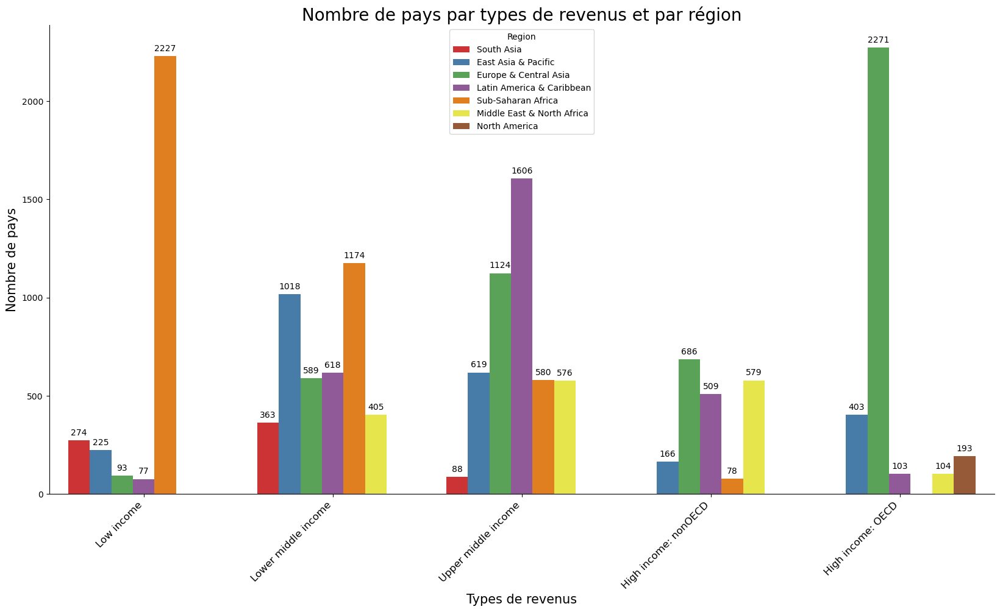

In [243]:
# Calculer le nombre de pays par type de revenu et par région
df_income_region = data_etude_pivoter.groupby(['Income Group', 'Region']).size().reset_index(name='Country Count')

# Créer le DataFrame pour les groupes de revenus et leur ordre
income_order = pd.DataFrame({
    "Income Group": ['Low income', 'Lower middle income', 'Upper middle income', 'High income: nonOECD', 'High income: OECD'], 
    "Order": [0, 1, 2, 3, 4]
})

# Fusionner les données régionales avec le DataFrame income_order
df_income_region_ordered = pd.merge(df_income_region, income_order, on='Income Group').sort_values('Order')

# Créer le graphique à barres empilées
fig, ax1 = plt.subplots(figsize=(20, 10))
plot = sns.barplot(x='Income Group', y='Country Count', hue='Region', data=df_income_region_ordered, ax=ax1, palette="Set1")

# Ajouter les annotations pour chaque barre
for p in plot.patches:
    height = p.get_height()
    if height > 0:  # Ajouter des annotations uniquement pour les barres non vides
        plot.annotate(f'{height:.0f}', (p.get_x() + p.get_width() / 2., height),
                      ha='center', va='center', color='black', xytext=(0, 9), textcoords='offset points')

# Définir les labels et le titre
plt.xlabel("Types de revenus", size=15)
plt.ylabel("Nombre de pays", size=15)
plt.title("Nombre de pays par types de revenus et par région", size=20)

# Ajuster l'angle des étiquettes de l'axe des x pour une meilleure lisibilité
plot.set_xticklabels(plot.get_xticklabels(), rotation=45, ha='right', fontsize=12)

# Supprimer les bordures du graphique
sns.despine(fig)

# Afficher le graphique
plt.show()

# Les Graphique des indicateur par pays 

#### Nombre indicateur par pays

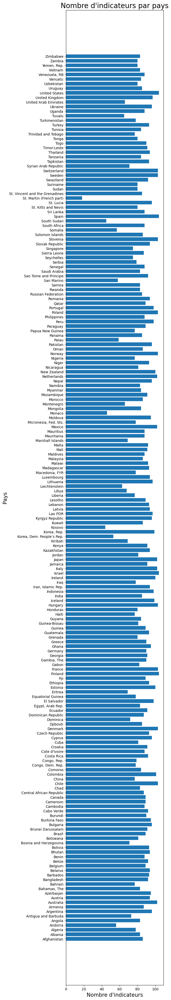

In [193]:
# Calculer le nombre d'indicateurs par pays
graphe_pays = data_etude_pivoter.groupby("Country Name")["Indicator Code"].count().reset_index()

# Créer le graphique à barres horizontales
plt.figure(figsize=(5, 50))
plt.barh(graphe_pays["Country Name"], graphe_pays["Indicator Code"])
plt.xlabel("Nombre d'indicateurs", size=15)
plt.ylabel("Pays", size=15)
plt.title("Nombre d'indicateurs par pays", size=20)
plt.show()

### Prediction 

In [194]:
# dans un premier temps j'affiche le dataframe pertinent_EdStatsData et son data pivoter
pertinent_EdStatsData

,Country Name,Country Code,Indicator Name,Indicator Code,1970,1971,1972,1973,1974,1975,1976,1977,1978,1979,1980,1981,1982,1983,1984,1985,1986,1987,1988,1989,1990,1991,1992,1993,1994,1995,1996,1997,1998,1999,2000,2001,2002,2003,2004,2005,2006,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016,2017,2020,2025,2030,2035,2040,2045,2050,2055,2060,2065,2070,2075,2080,2085,2090,2095,2100,Unnamed: 69
91625,Afghanistan,AFG,"Adjusted net enrolment rate, lower secondary, ...",UIS.NERA.2,NaN,NaN,NaN,NaN,7.05911,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,17.260189,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,28.05987,NaN,NaN,NaN,NaN,NaN,47.43679,50.627232,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
91645,Afghanistan,AFG,"Adult literacy rate, population 15+ years, bot...",SE.ADT.LITR.ZS,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,18.157681,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,31.74112,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
91647,Afghanistan,AFG,"Adult literacy rate, population 15+ years, gen...",UIS.LR.AG15T99.GPI,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.164560,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.38778,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
91758,Afghanistan,AFG,Annual statutory teacher salaries in public in...,OECD.TSAL.2.E10,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
91999,Afghanistan,AFG,Barro-Lee: Percentage of population age 15+ wi...,BAR.NOED.15UP.ZS,88.81,NaN,NaN,NaN,NaN,85.74,NaN,NaN,NaN,NaN,82.03,NaN,NaN,NaN,NaN,77.8,NaN,NaN,NaN,NaN,75.04,NaN,NaN,NaN,NaN,73.21,NaN,NaN,NaN,NaN,67.85,NaN,NaN,NaN,NaN,65.73,NaN,NaN,NaN,NaN,58.38,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
886626,Zimbabwe,ZWE,Wittgenstein Projection: Mean years of schooli...,PRJ.MYS.2024.MF,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,11.30,NaN,NaN,NaN,NaN,11.70,NaN,NaN,12.00,12.20,12.30,12.50,12.60,12.70,12.70,12.80,12.80,12.90,12.90,13.00,13.00,13.10,13.20,13.20,13.30,NaN
886771,Zimbabwe,ZWE,Wittgenstein Projection: Percentage of the pop...,PRJ.ATT.2529.4.MF,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.06,NaN,NaN,NaN,NaN,0.07,NaN,NaN,0.08,0.09,0.10,0.11,0.12,0.14,0.15,0.17,0.18,0.20,0.22,0.23,0.25,0.27,0.29,0.31,0.33,NaN
886897,Zimbabwe,ZWE,Wittgenstein Projection: Population age 25-29 ...,PRJ.POP.2529.4.MF,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,76.71,NaN,NaN,NaN,NaN,90.03,NaN,NaN,99.70,107.30,117.68,134.22,144.02,152.44,158.23,162.40,169.05,177.46,185.54,191.79,195.98,203.30,209.91,219.22,222.40,NaN
886923,Zimbabwe,ZWE,"Youth illiterate population, 15-24 years, both...",UIS.LP.AG15T24,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,164719.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,102022.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,295605.00000,NaN,NaN,311114.000000,NaN,NaN,NaN,NaN,NaN,NaN,

In [195]:
pertinent_EdStatsData_pivoter

Indicator Name,Country Code,Indicator Code,Country Name,Year,"Adjusted net enrolment rate, lower secondary, both sexes (%)","Adult literacy rate, population 15+ years, both sexes (%)","Adult literacy rate, population 15+ years, gender parity index (GPI)",Annual statutory teacher salaries in public institutions in USD. Lower Secondary. 10 years of experience,Barro-Lee: Percentage of population age 15+ with no education,Capital expenditure as % of total expenditure in lower secondary public institutions (%),Capital expenditure as % of total expenditure in tertiary public institutions (%),Capital expenditure as % of total expenditure in upper-secondary public institutions (%),Expenditure on tertiary as % of total government expenditure (%),GDP per capita (current US$),"GDP per capita, PPP (current international $)",Government expenditure on education as % of GDP (%),Government expenditure per post-secondary non-tertiary student as % of GDP per capita (%),Internet users (per 100 people),Population growth (annual %),"Population of the official age for tertiary education, both sexes (number)","Population of the official entrance age to secondary general education, male (number)","Population, ages 15-24, total","Population, total",Wittgenstein Projection: Mean years of schooling. Age 20-24. Total,Wittgenstein Projection: Percentage of the population age 25-29 by highest level of educational attainment. Post Secondary. Total,Wittgenstein Projection: Population age 25-29 in thousands by highest level of educational attainment. Post Secondary. Total,"Youth illiterate population, 15-24 years, both sexes (number)","Youth literacy rate, population 15-24 years, both sexes (%)"
0,AFG,BAR.NOED.15UP.ZS,Afghanistan,1970,NaN,NaN,NaN,NaN,88.81,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,AFG,BAR.NOED.15UP.ZS,Afghanistan,1975,NaN,NaN,NaN,NaN,85.74,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,AFG,BAR.NOED.15UP.ZS,Afghanistan,1980,NaN,NaN,NaN,NaN,82.03,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,AFG,BAR.NOED.15UP.ZS,Afghanistan,1985,NaN,NaN,NaN,NaN,77.80,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,AFG,BAR.NOED.15UP.ZS,Afghanistan,1990,NaN,NaN,NaN,NaN,75.04,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
80141,ZWE,UIS.SAP.23.GPV.G1.M,Zimbabwe,1988,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,125515.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
80142,ZWE,UIS.SAP.23.GPV.G1.M,Zimbabwe,1989,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,130472.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
80143,ZWE,UIS.XGOVEXP.IMF.56,Zimbabwe,2010,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.98968,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
80144,ZWE,UIS.XGOVEXP.IMF.56,Zimbabwe,2009,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.90494,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


#### les données par ans de pertinent_EdStatsData

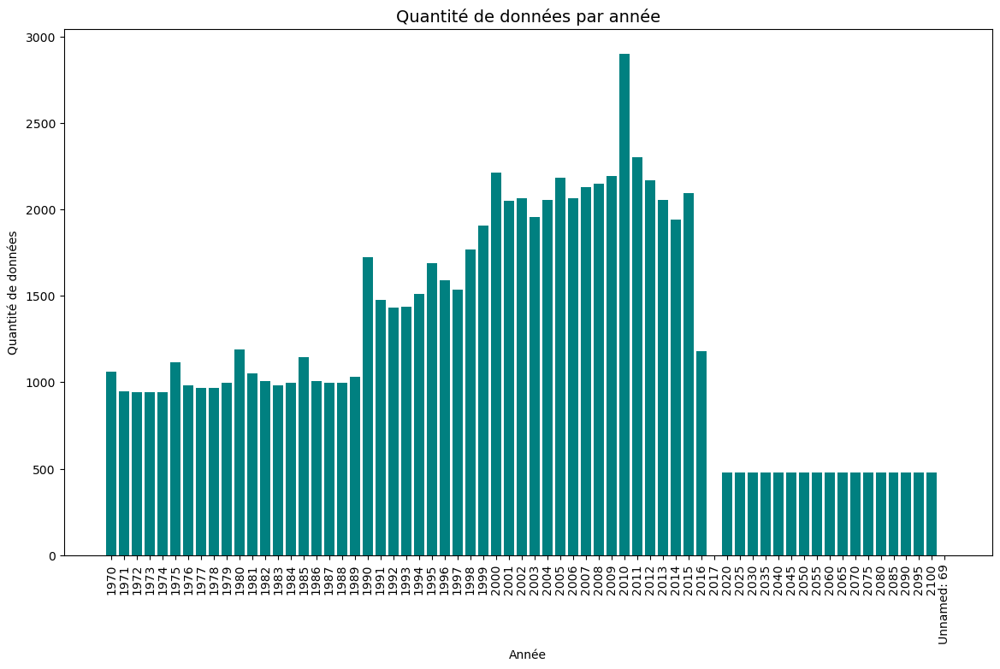

In [196]:
# Calcul du nombre de données non manquantes par année
data_counts = pertinent_EdStatsData.iloc[:, 4:].count()

# Création du graphique
plt.figure(figsize=(14, 8))
plt.bar(data_counts.index, data_counts.values, color='teal')
plt.title("Quantité de données par année", fontsize=14)
plt.xlabel("Année")
plt.ylabel("Quantité de données")
plt.xticks(rotation=90)
plt.show()

### Prediction Années moyennes de scolarité. 20-24 ans. Total

C:\Users\dtabd\AppData\Local\Temp\ipykernel_1180\3847333800.py:8: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



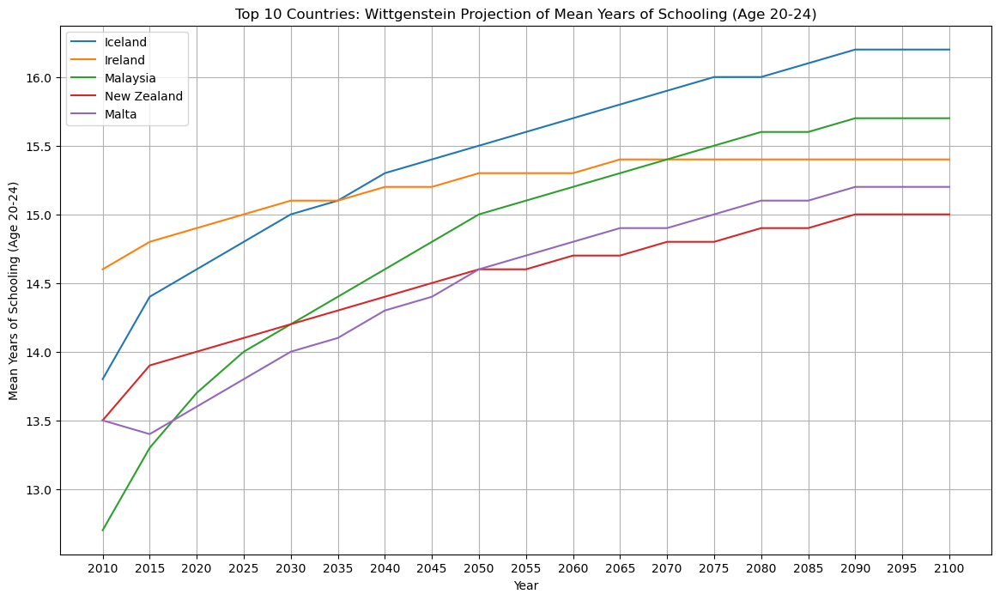

In [197]:
# Copier le DataFrame original
df = pertinent_EdStatsData_pivoter.copy()

# Filtrer les colonnes pertinentes
df_filtered = df[['Country Name', 'Year', 'Wittgenstein Projection: Mean years of schooling. Age 20-24. Total']]

# Supprimer les lignes avec des valeurs manquantes
df_filtered.dropna(subset=['Wittgenstein Projection: Mean years of schooling. Age 20-24. Total'], inplace=True)

# Calculer la moyenne des années de scolarité pour chaque pays
df_mean_years = df_filtered.groupby('Country Name')['Wittgenstein Projection: Mean years of schooling. Age 20-24. Total'].mean().reset_index()

# Sélectionner les 10 pays avec les valeurs moyennes les plus élevées
top_10_countries = df_mean_years.nlargest(5, 'Wittgenstein Projection: Mean years of schooling. Age 20-24. Total')['Country Name']

# Filtrer les données d'origine pour ces 10 pays
df_top_10 = df_filtered[df_filtered['Country Name'].isin(top_10_countries)]

# Tracer le graphique linéaire
plt.figure(figsize=(14, 8))
for country in top_10_countries:
    country_data = df_top_10[df_top_10['Country Name'] == country]
    plt.plot(country_data['Year'], country_data['Wittgenstein Projection: Mean years of schooling. Age 20-24. Total'], label=country)

plt.xlabel('Year')
plt.ylabel('Mean Years of Schooling (Age 20-24)')
plt.title('Top 10 Countries: Wittgenstein Projection of Mean Years of Schooling (Age 20-24)')
plt.legend()
plt.grid(True)
plt.show()

### Graphique Années moyennes de scolarité. 20-24 ans. Total

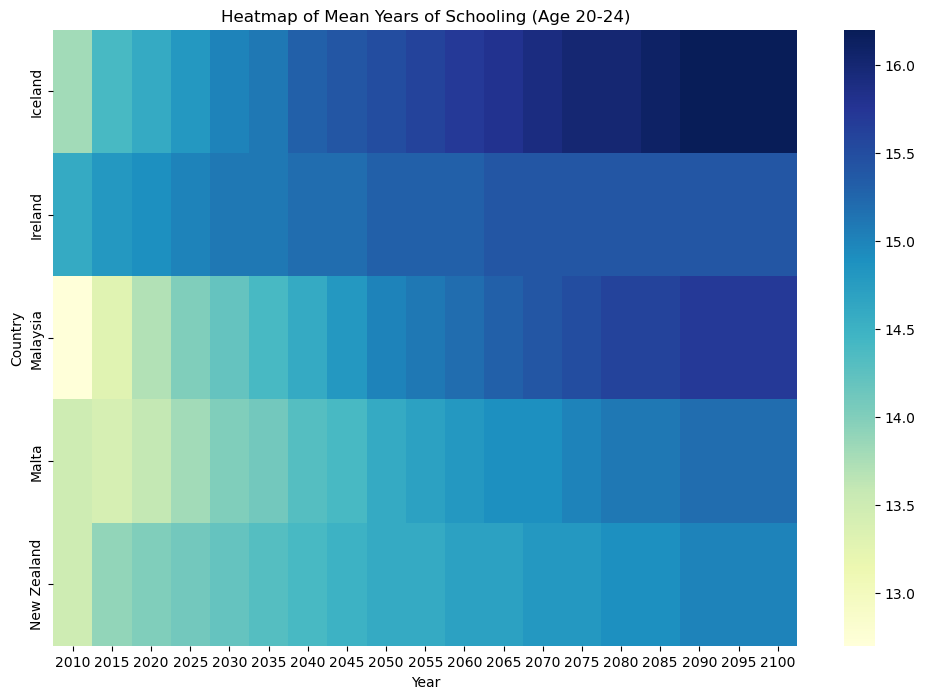

In [198]:
# Pivoter les données pour avoir les années en colonnes et les pays en index
df_pivot = df_top_10.pivot(index='Country Name', columns='Year', values='Wittgenstein Projection: Mean years of schooling. Age 20-24. Total')

# Tracer le heatmap
plt.figure(figsize=(12, 8))
sns.heatmap(df_pivot, cmap='YlGnBu')
plt.title('Heatmap of Mean Years of Schooling (Age 20-24)')
plt.xlabel('Year')
plt.ylabel('Country')
plt.show()

### Prediction population âgée de 25 à 29 ans, en milliers, selon le niveau d'éducation le plus élevé atteint. Postsecondaire. Total

C:\Users\dtabd\AppData\Local\Temp\ipykernel_1180\3565688144.py:8: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



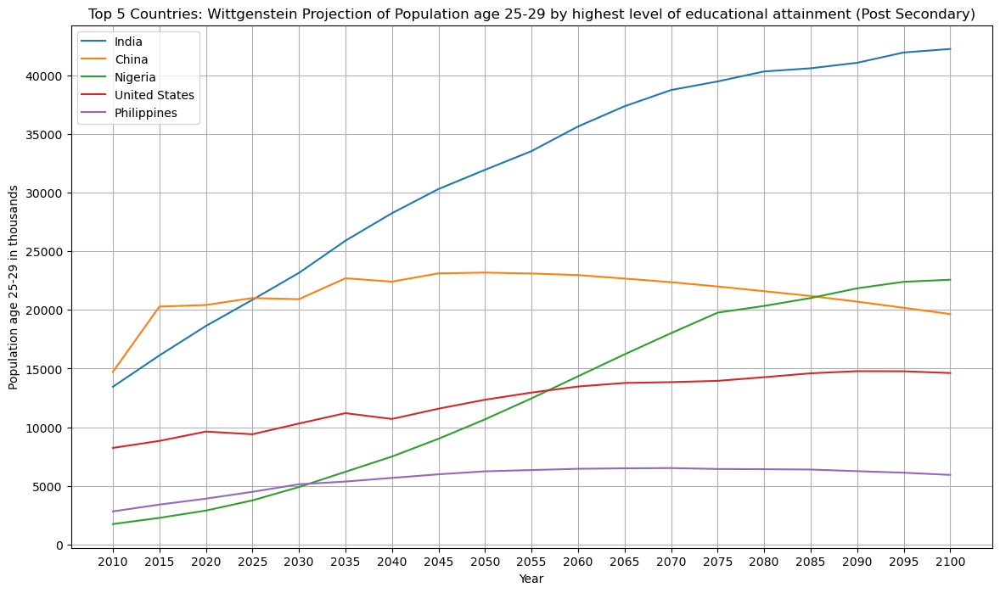

In [199]:
# Copier le DataFrame original
df = pertinent_EdStatsData_pivoter.copy()

# Filtrer les colonnes pertinentes
df_filtered = df[['Country Name', 'Year', 'Wittgenstein Projection: Population age 25-29 in thousands by highest level of educational attainment. Post Secondary. Total']]

# Supprimer les lignes avec des valeurs manquantes
df_filtered.dropna(subset=['Wittgenstein Projection: Population age 25-29 in thousands by highest level of educational attainment. Post Secondary. Total'], inplace=True)

# Calculer la moyenne pour chaque pays
df_mean_years = df_filtered.groupby('Country Name')['Wittgenstein Projection: Population age 25-29 in thousands by highest level of educational attainment. Post Secondary. Total'].mean().reset_index()

# Sélectionner les 5 pays avec les valeurs moyennes les plus élevées
top_5_countries = df_mean_years.nlargest(5, 'Wittgenstein Projection: Population age 25-29 in thousands by highest level of educational attainment. Post Secondary. Total')['Country Name']

# Filtrer les données d'origine pour ces 5 pays
df_top_5 = df_filtered[df_filtered['Country Name'].isin(top_5_countries)]

# Tracer le graphique linéaire
plt.figure(figsize=(14, 8))
for country in top_5_countries:
    country_data = df_top_5[df_top_5['Country Name'] == country]
    plt.plot(country_data['Year'], country_data['Wittgenstein Projection: Population age 25-29 in thousands by highest level of educational attainment. Post Secondary. Total'], label=country)

plt.xlabel('Year')
plt.ylabel('Population age 25-29 in thousands')
plt.title('Top 5 Countries: Wittgenstein Projection of Population age 25-29 by highest level of educational attainment (Post Secondary)')
plt.legend()
plt.grid(True)
plt.show()

### Graphique heatmap population âgée de 25 à 29 ans, en milliers, selon le niveau d'éducation le plus élevé atteint. Postsecondaire. Total

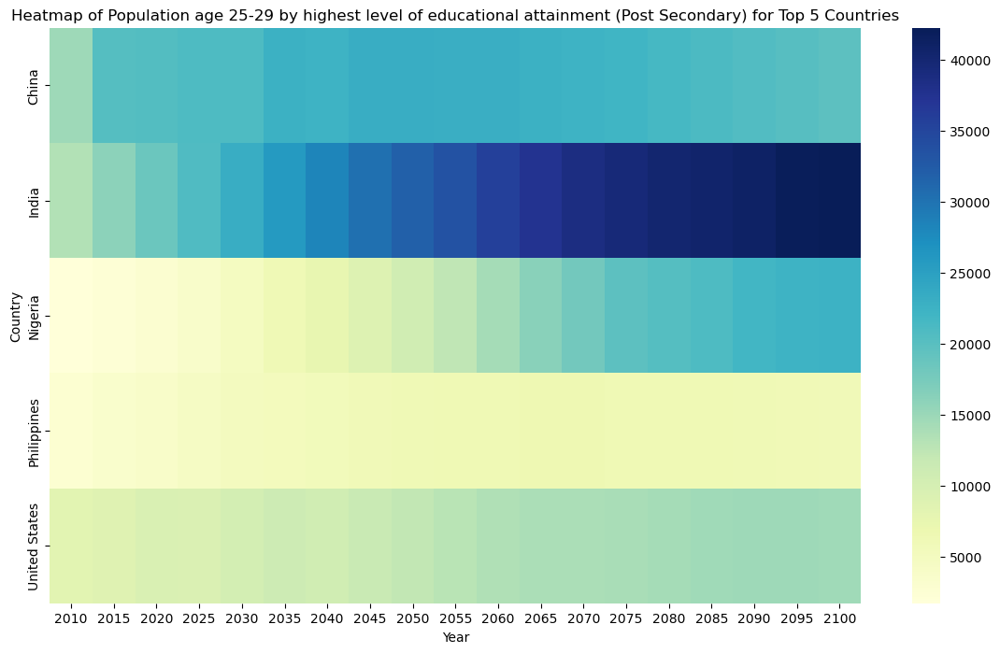

In [200]:
# Pivoter les données pour les mettre dans un format adapté au heatmap
heatmap_data = df_top_5.pivot(index='Country Name', columns='Year', values='Wittgenstein Projection: Population age 25-29 in thousands by highest level of educational attainment. Post Secondary. Total')

# Tracer le heatmap
plt.figure(figsize=(14, 8))
sns.heatmap(heatmap_data, cmap='YlGnBu')
plt.title('Heatmap of Population age 25-29 by highest level of educational attainment (Post Secondary) for Top 5 Countries')
plt.xlabel('Year')
plt.ylabel('Country')
plt.show()

### Prediction Pourcentage de la population âgée de 25 à 29 ans selon le niveau d'éducation le plus élevé. Postsecondaire.Total

C:\Users\dtabd\AppData\Local\Temp\ipykernel_1180\2029319254.py:8: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



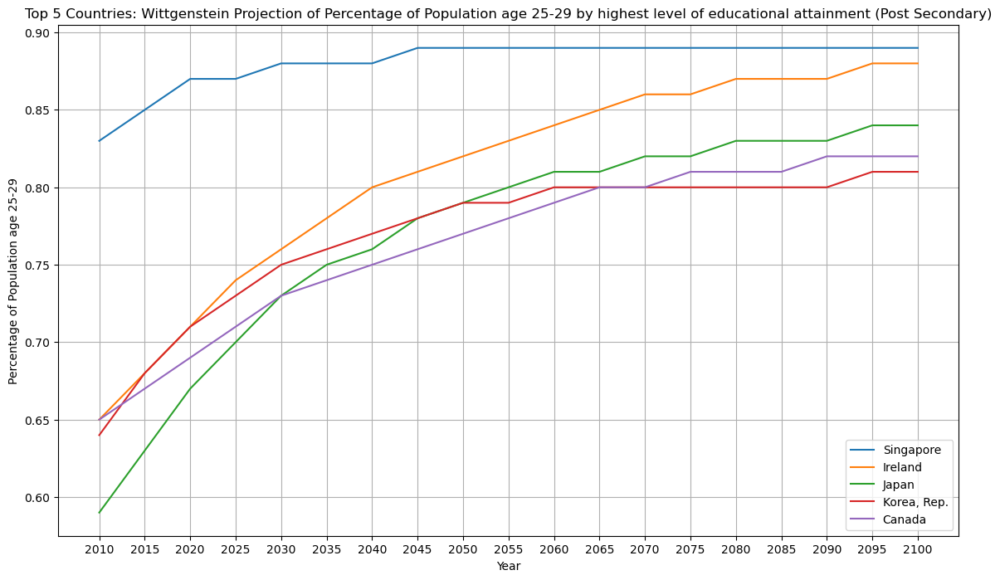

In [201]:
# Copier le DataFrame original
df = pertinent_EdStatsData_pivoter.copy()

# Filtrer les colonnes pertinentes
df_filtered = df[['Country Name', 'Year', 'Wittgenstein Projection: Percentage of the population age 25-29 by highest level of educational attainment. Post Secondary. Total']]

# Supprimer les lignes avec des valeurs manquantes
df_filtered.dropna(subset=['Wittgenstein Projection: Percentage of the population age 25-29 by highest level of educational attainment. Post Secondary. Total'], inplace=True)

# Calculer la moyenne pour chaque pays
df_mean_years = df_filtered.groupby('Country Name')['Wittgenstein Projection: Percentage of the population age 25-29 by highest level of educational attainment. Post Secondary. Total'].mean().reset_index()

# Sélectionner les 5 pays avec les valeurs moyennes les plus élevées
top_5_countries = df_mean_years.nlargest(5, 'Wittgenstein Projection: Percentage of the population age 25-29 by highest level of educational attainment. Post Secondary. Total')['Country Name']

# Filtrer les données d'origine pour ces 5 pays
df_top_5 = df_filtered[df_filtered['Country Name'].isin(top_5_countries)]

# Tracer le graphique linéaire
plt.figure(figsize=(14, 8))
for country in top_5_countries:
    country_data = df_top_5[df_top_5['Country Name'] == country]
    plt.plot(country_data['Year'], country_data['Wittgenstein Projection: Percentage of the population age 25-29 by highest level of educational attainment. Post Secondary. Total'], label=country)

plt.xlabel('Year')
plt.ylabel('Percentage of Population age 25-29')
plt.title('Top 5 Countries: Wittgenstein Projection of Percentage of Population age 25-29 by highest level of educational attainment (Post Secondary)')
plt.legend()
plt.grid(True)
plt.show()

###  Graphique heatmap de Prediction Pourcentage de la population âgée de 25 à 29 ans selon le niveau d'éducation le plus élevé. Postsecondaire.Total

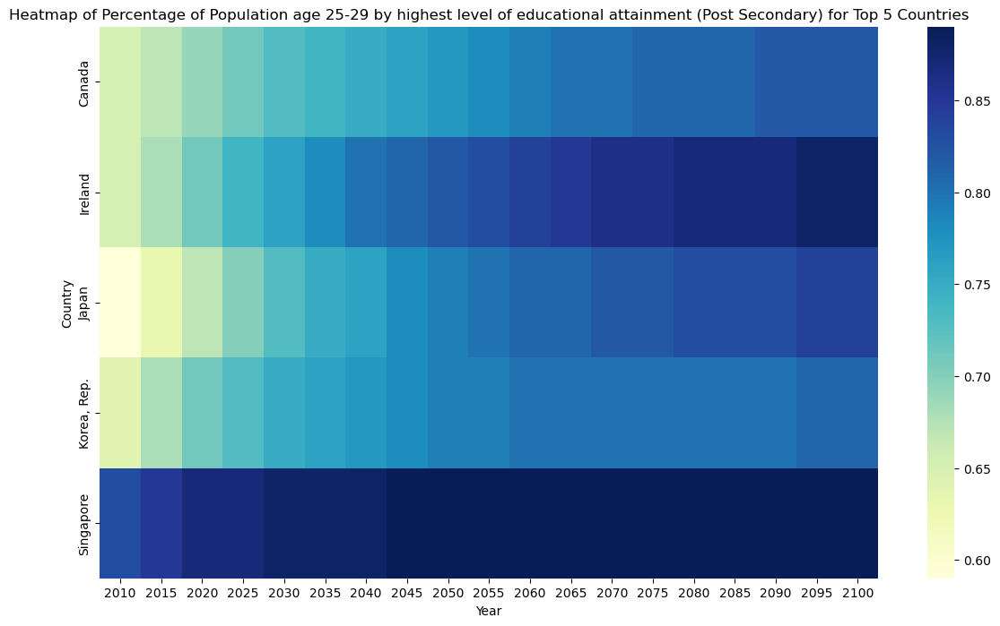

In [202]:
# Pivoter les données pour les mettre dans un format adapté au heatmap
heatmap_data = df_top_5.pivot(index='Country Name', columns='Year', values='Wittgenstein Projection: Percentage of the population age 25-29 by highest level of educational attainment. Post Secondary. Total')

# Tracer le heatmap
plt.figure(figsize=(14, 8))
sns.heatmap(heatmap_data, cmap='YlGnBu')
plt.title('Heatmap of Percentage of Population age 25-29 by highest level of educational attainment (Post Secondary) for Top 5 Countries')
plt.xlabel('Year')
plt.ylabel('Country')
plt.show()

# Conclusion 